# NEURAL NETWORKS AND DEEP LEARNING

---
A.A. 2021/22 (6 CFU) - Dr. Alberto Testolin, Dr. Umberto Michieli
---


# Homework II - Unsupervised Deep Learning

Accomplished by Ali Bavarchee(1219425)
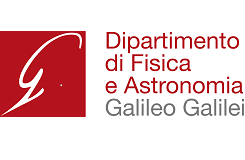




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import os

In [27]:
PATH = os. getcwd()

In [2]:
! pip install pytorch-lightning

In [3]:
!pip install rich

In [4]:
!pip install optuna

In [5]:
import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as Data
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from torch.autograd import Variable

import pandas as pd
import numpy as np
import random
import os
import sys
import glob
import json
import joblib
from rich.jupyter import print
from tqdm import tqdm


from sklearn.model_selection import KFold, train_test_split
from scipy.stats import loguniform 


import matplotlib.pyplot as plt
%matplotlib inline
import imageio
#import plotly.express as px


from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from matplotlib.patches import Ellipse
from sklearn import metrics, manifold
import time
from sklearn.metrics import precision_recall_fscore_support, confusion_matrix

import pytorch_lightning as pl
from pytorch_lightning import Callback
import optuna
from optuna.integration import PyTorchLightningPruningCallback
from pytorch_lightning.callbacks.early_stopping import EarlyStopping

In [6]:
# device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cpu

In [7]:
import plotly.express as px

## Define the dataset transform

In [9]:
data_dir = 'dataset'
train_dataset = torchvision.datasets.FashionMNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST(data_dir, train=False, download=True)

In [8]:
torch.manual_seed(999)    
np.random.seed(999)


In [10]:
to_tensor = torchvision.transforms.ToTensor()
#image_tensor = to_tensor(pil_image)

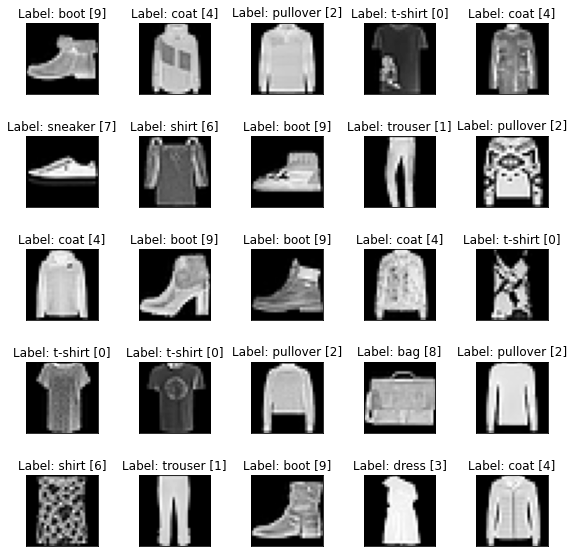

In [11]:
### Plot some sample
label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten():
    # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
    img, label = random.choice(train_dataset)
    ax.imshow(np.array(img), cmap='gist_gray')
    ax.set_title(f'Label: {label_names[label]} [{label}]')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

## Define the dataset transform

In [12]:
train_transform = transforms.Compose([
    transforms.ToTensor(),
])
test_transform = transforms.Compose([
    transforms.ToTensor(),
])

In [58]:
# check what is going on BEFORE the transformation is in place!
print(train_dataset)
print(train_dataset[0])
print(train_dataset[0][0])
print(train_dataset[0][1])

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: dataset
    Split: Train

(<PIL.Image.Image image mode=L size=28x28 at 0x7F3EB94EE9D0>, 9)

<PIL.Image.Image image mode=L size=28x28 at 0x7F3EB94EEAD0>

9

In [13]:
# Set the train transform
train_dataset.transform = train_transform
# Set the test transform
test_dataset.transform = test_transform

In [60]:
# check what is going on AFTER the transformation is in place!
print(train_dataset)
print(train_dataset[0])
print(train_dataset[0][0])
print(train_dataset[0][1])

Dataset FashionMNIST
    Number of datapoints: 60000
    Root location: dataset
    Split: Train

(
    tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.0000, 0.0510,
          0.2863, 0.0000, 0.0000, 0.0039, 0.0157, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0039, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0118, 0.0000, 0.1412, 0.5333,
          0.4980, 0.2431, 0.2118, 0.0000, 0.0000, 0.0000, 0.0039, 0.0118,
          0.0157, 0.0000, 0.0000, 0.0118],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0235, 0.0000, 0.4000, 0.8000,
          0.6902, 0.5255, 0.5647, 0.4824, 0.0902, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0471, 0.0392, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.6078, 0.9255,
          0.8118, 0.6980, 0.4196, 0.6118, 0.6314, 0.4275, 0.2510, 0.0902,
          0.3020, 0.5098, 0.2824, 0.0588],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.2706, 0.8118, 0.8745,
          0.8549, 0.8471, 0.8471, 0.6392, 0.4980, 0.4745, 0.4784, 0.5725,
          0.5529, 0.3451, 0.6745, 0.2588],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0039, 0.0039, 0.0000, 0.7843, 0.9098, 0.9098,
          0.9137, 0.8980, 0.8745, 0.8745, 0.8431, 0.8353, 0.6431, 0.4980,
          0.4824, 0.7686, 0.8980, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.7176, 0.8824, 0.8471,
          0.8745, 0.8941, 0.9216, 0.8902, 0.8784, 0.8706, 0.8784, 0.8667,
          0.8745, 0.9608, 0.6784, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.7569, 0.8941, 0.8549,
          0.8353, 0.7765, 0.7059, 0.8314, 0.8235, 0.8275, 0.8353, 0.8745,
          0.8627, 0.9529, 0.7922, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0118, 0.0000, 0.0471, 0.8588, 0.8627, 0.8314,
          0.8549, 0.7529, 0.6627, 0.8902, 0.8157, 0.8549, 0.8784, 0.8314,
          0.8863, 0.7725, 0.8196, 0.2039],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0235, 0.0000, 0.3882, 0.9569, 0.8706, 0.8627,
          0.8549, 0.7961, 0.7765, 0.8667, 0.8431, 0.8353, 0.8706, 0.8627,
          0.9608, 0.4667, 0.6549, 0.2196],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0157, 0.0000, 0.0000, 0.2157, 0.9255, 0.8941, 0.9020,
          0.8941, 0.9412, 0.9098, 0.8353, 0.8549, 0.8745, 0.9176, 0.8510,
          0.8510, 0.8196, 0.3608, 0.0000],
         [0.0000, 0.0000, 0.0039, 0.0157, 0.0235, 0.0275, 0.0078, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.9294, 0.8863, 0.8510, 0.8745,
          0.8706, 0.8588, 0.8706, 0.8667, 0.8471, 0.8745, 0.8980, 0.8431,
          0.8549, 1.0000, 0.3020, 0.0000],
         [0.0000, 0

tensor([[[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.0000, 0.0510,
          0.2863, 0.0000, 0.0000, 0.0039, 0.0157, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0039, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0118, 0.0000, 0.1412, 0.5333,
          0.4980, 0.2431, 0.2118, 0.0000, 0.0000, 0.0000, 0.0039, 0.0118,
          0.0157, 0.0000, 0.0000, 0.0118],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0235, 0.0000, 0.4000, 0.8000,
          0.6902, 0.5255, 0.5647, 0.4824, 0.0902, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0471, 0.0392, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.6078, 0.9255,
          0.8118, 0.6980, 0.4196, 0.6118, 0.6314, 0.4275, 0.2510, 0.0902,
          0.3020, 0.5098, 0.2824, 0.0588],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0039, 0.0000, 0.2706, 0.8118, 0.8745,
          0.8549, 0.8471, 0.8471, 0.6392, 0.4980, 0.4745, 0.4784, 0.5725,
          0.5529, 0.3451, 0.6745, 0.2588],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0039, 0.0039, 0.0000, 0.7843, 0.9098, 0.9098,
          0.9137, 0.8980, 0.8745, 0.8745, 0.8431, 0.8353, 0.6431, 0.4980,
          0.4824, 0.7686, 0.8980, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.7176, 0.8824, 0.8471,
          0.8745, 0.8941, 0.9216, 0.8902, 0.8784, 0.8706, 0.8784, 0.8667,
          0.8745, 0.9608, 0.6784, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.7569, 0.8941, 0.8549,
          0.8353, 0.7765, 0.7059, 0.8314, 0.8235, 0.8275, 0.8353, 0.8745,
          0.8627, 0.9529, 0.7922, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0039, 0.0118, 0.0000, 0.0471, 0.8588, 0.8627, 0.8314,
          0.8549, 0.7529, 0.6627, 0.8902, 0.8157, 0.8549, 0.8784, 0.8314,
          0.8863, 0.7725, 0.8196, 0.2039],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0000, 0.0235, 0.0000, 0.3882, 0.9569, 0.8706, 0.8627,
          0.8549, 0.7961, 0.7765, 0.8667, 0.8431, 0.8353, 0.8706, 0.8627,
          0.9608, 0.4667, 0.6549, 0.2196],
         [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
          0.0000, 0.0157, 0.0000, 0.0000, 0.2157, 0.9255, 0.8941, 0.9020,
          0.8941, 0.9412, 0.9098, 0.8353, 0.8549, 0.8745, 0.9176, 0.8510,
          0.8510, 0.8196, 0.3608, 0.0000],
         [0.0000, 0.0000, 0.0039, 0.0157, 0.0235, 0.0275, 0.0078, 0.0000,
          0.0000, 0.0000, 0.0000, 0.0000, 0.9294, 0.8863, 0.8510, 0.8745,
          0.8706, 0.8588, 0.8706, 0.8667, 0.8471, 0.8745, 0.8980, 0.8431,
          0.8549, 1.0000, 0.3020, 0.0000],
         [0.0000, 0.0118,

9

## Define the dataloader

In [14]:
# prepare validation set by splitting the train one
train_dataset, valid_dataset = torch.utils.data.random_split(train_dataset, [int(0.8*len(train_dataset)),int(0.2*len(train_dataset))])

print('Train samples:', len(train_dataset), '\nValidation samples:', len(valid_dataset), '\nTest samples:', len(test_dataset))

# set up dataloaders
train_load = Data.DataLoader(train_dataset, batch_size=256, shuffle=True, num_workers=0)
valid_load = Data.DataLoader(valid_dataset, batch_size=256, shuffle=False, num_workers=0)

test_load  = Data.DataLoader(test_dataset, batch_size=256, shuffle=False)

Train samples: 48000 
Validation samples: 12000 
Test samples: 10000

In [15]:
### Define train dataloader
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)
### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False)
### Define validation dataloader
val_dataloader   = DataLoader(dataset=valid_dataset, batch_size=256,  shuffle=False, num_workers=8)


batch_data, batch_labels = next(iter(train_dataloader))
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.



TRAIN BATCH SHAPE

Data: torch.Size([256, 1, 28, 28])

Labels: torch.Size([256])

TEST BATCH SHAPE

Data: torch.Size([256, 1, 28, 28])

Labels: torch.Size([256])

# Autoencoder

## Support functions

In [ ]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Second convolutional layer
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Third convolutional layer
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, 
                      stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=288, out_features=96),
            nn.ReLU(True),
            # Second linear layer
            nn.Linear(in_features=96, out_features=3)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

## Decoder

In [ ]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()

        ### Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=3, out_features=96),
            nn.ReLU(True),
            # Second linear layer
            nn.Linear(in_features=96, out_features=288),
            nn.ReLU(True)
        )

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        ### Convolutional section
        self.decoder_conv = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=3, 
                               stride=2, padding = 0, output_padding=0),
            nn.ReLU(True),
            # Second transposed convolution
            nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # Third transposed convolution
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=3, 
                               stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

## Initialize the two networks.

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(999)

# Loss func
loss_func = nn.MSELoss()

### Initialize the two networks
encoded_space_dim = 3
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)

In [ ]:
### Some examples
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)
# Encode the image
img_enc = encoder(img)
print('Encoded image shape:', img_enc.shape)
# Decode the image
dec_img = decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape:
torch.Size([1, 1, 28, 28])

Encoded image shape:
torch.Size([1, 3])

Decoded image shape:
torch.Size([1, 1, 28, 28])

# Training

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 5e-4 # Learning rate
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-5)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cuda

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=3, out_features=96, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=96, out_features=288, bias=True)
    (3): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

### Training function

In [ ]:
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        # Encode data
        encoded_data = encoder(image_batch)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        print('\t partial train loss (single batch): %f' % (loss.data))

## Test function

In [ ]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

## Training loop

EPOCH 1/10

partial train loss (single batch): 0.156353

partial train loss (single batch): 0.153081

partial train loss (single batch): 0.159899

partial train loss (single batch): 0.154812

partial train loss (single batch): 0.154009

partial train loss (single batch): 0.155490

partial train loss (single batch): 0.158357

partial train loss (single batch): 0.157132

partial train loss (single batch): 0.152889

partial train loss (single batch): 0.153200

partial train loss (single batch): 0.154373

partial train loss (single batch): 0.151713

partial train loss (single batch): 0.155306

partial train loss (single batch): 0.156411

partial train loss (single batch): 0.158013

partial train loss (single batch): 0.156560

partial train loss (single batch): 0.153698

partial train loss (single batch): 0.154544

partial train loss (single batch): 0.156481

partial train loss (single batch): 0.151485

partial train loss (single batch): 0.158702

partial train loss (single batch): 0.153544

partial train loss (single batch): 0.151487

partial train loss (single batch): 0.151904

partial train loss (single batch): 0.149912

partial train loss (single batch): 0.156104

partial train loss (single batch): 0.155057

partial train loss (single batch): 0.150419

partial train loss (single batch): 0.152369

partial train loss (single batch): 0.148465

partial train loss (single batch): 0.151766

partial train loss (single batch): 0.151686

partial train loss (single batch): 0.152356

partial train loss (single batch): 0.154438

partial train loss (single batch): 0.152641

partial train loss (single batch): 0.148483

partial train loss (single batch): 0.147391

partial train loss (single batch): 0.147522

partial train loss (single batch): 0.148050

partial train loss (single batch): 0.144955

partial train loss (single batch): 0.146036

partial train loss (single batch): 0.147478

partial train loss (single batch): 0.145866

partial train loss (single batch): 0.144475

partial train loss (single batch): 0.143115

partial train loss (single batch): 0.140827

partial train loss (single batch): 0.141042

partial train loss (single batch): 0.142430

partial train loss (single batch): 0.137137

partial train loss (single batch): 0.138878

partial train loss (single batch): 0.136764

partial train loss (single batch): 0.137164

partial train loss (single batch): 0.132073

partial train loss (single batch): 0.132749

partial train loss (single batch): 0.130489

partial train loss (single batch): 0.129804

partial train loss (single batch): 0.129396

partial train loss (single batch): 0.129353

partial train loss (single batch): 0.120535

partial train loss (single batch): 0.121402

partial train loss (single batch): 0.118662

partial train loss (single batch): 0.120976

partial train loss (single batch): 0.116624

partial train loss (single batch): 0.118642

partial train loss (single batch): 0.113132

partial train loss (single batch): 0.110407

partial train loss (single batch): 0.114849

partial train loss (single batch): 0.113458

partial train loss (single batch): 0.110678

partial train loss (single batch): 0.109075

partial train loss (single batch): 0.107239

partial train loss (single batch): 0.111826

partial train loss (single batch): 0.103086

partial train loss (single batch): 0.101792

partial train loss (single batch): 0.103061

partial train loss (single batch): 0.104851

partial train loss (single batch): 0.107151

partial train loss (single batch): 0.104436

partial train loss (single batch): 0.101592

partial train loss (single batch): 0.103880

partial train loss (single batch): 0.099779

partial train loss (single batch): 0.101821

partial train loss (single batch): 0.102088

partial train loss (single batch): 0.097945

partial train loss (single batch): 0.100105

partial train loss (single batch): 0.103753

partial train loss (single batch): 0.097062

partial train loss (single batch): 0.100025

partial train loss (single batch): 0.100549

partial train loss (single batch): 0.099674

partial train loss (single batch): 0.098137

partial train loss (single batch): 0.096457

partial train loss (single batch): 0.098195

partial train loss (single batch): 0.097205

partial train loss (single batch): 0.096224

partial train loss (single batch): 0.096261

partial train loss (single batch): 0.096481

partial train loss (single batch): 0.095967

partial train loss (single batch): 0.092260

partial train loss (single batch): 0.095911

partial train loss (single batch): 0.096699

partial train loss (single batch): 0.094790

partial train loss (single batch): 0.093563

partial train loss (single batch): 0.093633

partial train loss (single batch): 0.091573

partial train loss (single batch): 0.093953

partial train loss (single batch): 0.091757

partial train loss (single batch): 0.092808

partial train loss (single batch): 0.096862

partial train loss (single batch): 0.095426

partial train loss (single batch): 0.093470

partial train loss (single batch): 0.095982

partial train loss (single batch): 0.091659

partial train loss (single batch): 0.091624

partial train loss (single batch): 0.091987

partial train loss (single batch): 0.090448

partial train loss (single batch): 0.090583

partial train loss (single batch): 0.093268

partial train loss (single batch): 0.091524

partial train loss (single batch): 0.092552

partial train loss (single batch): 0.090944

partial train loss (single batch): 0.089784

partial train loss (single batch): 0.092894

partial train loss (single batch): 0.089649

partial train loss (single batch): 0.090471

partial train loss (single batch): 0.089505

partial train loss (single batch): 0.092570

partial train loss (single batch): 0.090662

partial train loss (single batch): 0.093165

partial train loss (single batch): 0.087125

partial train loss (single batch): 0.084702

partial train loss (single batch): 0.086894

partial train loss (single batch): 0.090925

partial train loss (single batch): 0.088596

partial train loss (single batch): 0.090644

partial train loss (single batch): 0.091978

partial train loss (single batch): 0.086930

partial train loss (single batch): 0.088725

partial train loss (single batch): 0.089015

partial train loss (single batch): 0.089967

partial train loss (single batch): 0.089538

partial train loss (single batch): 0.085564

partial train loss (single batch): 0.088826

partial train loss (single batch): 0.087536

partial train loss (single batch): 0.089081

partial train loss (single batch): 0.086196

partial train loss (single batch): 0.087699

partial train loss (single batch): 0.083248

partial train loss (single batch): 0.087139

partial train loss (single batch): 0.085464

partial train loss (single batch): 0.086683

partial train loss (single batch): 0.092935

partial train loss (single batch): 0.084712

partial train loss (single batch): 0.088948

partial train loss (single batch): 0.087347

partial train loss (single batch): 0.087466

partial train loss (single batch): 0.086847

partial train loss (single batch): 0.084379

partial train loss (single batch): 0.085306

partial train loss (single batch): 0.086665

partial train loss (single batch): 0.087297

partial train loss (single batch): 0.090611

partial train loss (single batch): 0.084038

partial train loss (single batch): 0.086124

partial train loss (single batch): 0.083575

partial train loss (single batch): 0.085119

partial train loss (single batch): 0.087071

partial train loss (single batch): 0.085394

partial train loss (single batch): 0.079876

partial train loss (single batch): 0.083405

partial train loss (single batch): 0.085224

partial train loss (single batch): 0.086859

partial train loss (single batch): 0.084668

partial train loss (single batch): 0.083579

partial train loss (single batch): 0.085002

partial train loss (single batch): 0.083339

partial train loss (single batch): 0.083121

partial train loss (single batch): 0.084195

partial train loss (single batch): 0.079756

partial train loss (single batch): 0.082836

partial train loss (single batch): 0.078458

partial train loss (single batch): 0.078803

partial train loss (single batch): 0.078519

partial train loss (single batch): 0.077657

partial train loss (single batch): 0.080472

partial train loss (single batch): 0.076536

partial train loss (single batch): 0.073173

partial train loss (single batch): 0.074880

partial train loss (single batch): 0.070662

partial train loss (single batch): 0.073427

partial train loss (single batch): 0.071108

partial train loss (single batch): 0.071123

partial train loss (single batch): 0.072731

partial train loss (single batch): 0.067077

partial train loss (single batch): 0.070299

partial train loss (single batch): 0.069180

partial train loss (single batch): 0.069099

partial train loss (single batch): 0.065062

partial train loss (single batch): 0.062640

partial train loss (single batch): 0.063417

partial train loss (single batch): 0.066596

partial train loss (single batch): 0.061436

partial train loss (single batch): 0.064293

partial train loss (single batch): 0.060524

partial train loss (single batch): 0.059644

partial train loss (single batch): 0.059473

partial train loss (single batch): 0.058688

partial train loss (single batch): 0.057308

partial train loss (single batch): 0.054747

partial train loss (single batch): 0.055325

partial train loss (single batch): 0.054644

partial train loss (single batch): 0.053728

partial train loss (single batch): 0.052892

partial train loss (single batch): 0.053080

partial train loss (single batch): 0.052023

partial train loss (single batch): 0.054777

partial train loss (single batch): 0.051251

partial train loss (single batch): 0.051119

partial train loss (single batch): 0.050521

partial train loss (single batch): 0.051214

partial train loss (single batch): 0.049069

partial train loss (single batch): 0.050498

partial train loss (single batch): 0.050609

partial train loss (single batch): 0.049431

partial train loss (single batch): 0.050443

partial train loss (single batch): 0.046618

partial train loss (single batch): 0.050675

partial train loss (single batch): 0.047533

partial train loss (single batch): 0.047170

partial train loss (single batch): 0.045700

partial train loss (single batch): 0.047298

partial train loss (single batch): 0.047782

partial train loss (single batch): 0.047051

partial train loss (single batch): 0.047205

partial train loss (single batch): 0.047243

VALIDATION - EPOCH 1/10 - loss: 0.046568

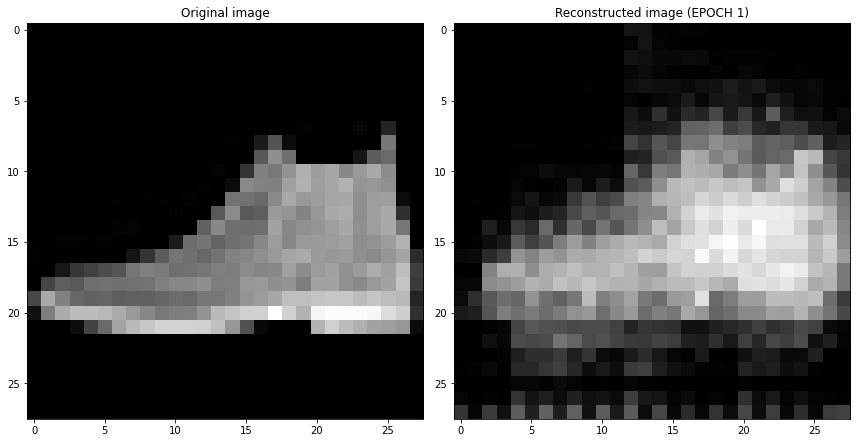

EPOCH 2/10

partial train loss (single batch): 0.045560

partial train loss (single batch): 0.045651

partial train loss (single batch): 0.046254

partial train loss (single batch): 0.045454

partial train loss (single batch): 0.046921

partial train loss (single batch): 0.044794

partial train loss (single batch): 0.045346

partial train loss (single batch): 0.045656

partial train loss (single batch): 0.044535

partial train loss (single batch): 0.045786

partial train loss (single batch): 0.044720

partial train loss (single batch): 0.044962

partial train loss (single batch): 0.046614

partial train loss (single batch): 0.044245

partial train loss (single batch): 0.044887

partial train loss (single batch): 0.044067

partial train loss (single batch): 0.044475

partial train loss (single batch): 0.044243

partial train loss (single batch): 0.044370

partial train loss (single batch): 0.046761

partial train loss (single batch): 0.043404

partial train loss (single batch): 0.043805

partial train loss (single batch): 0.045707

partial train loss (single batch): 0.044001

partial train loss (single batch): 0.043143

partial train loss (single batch): 0.044548

partial train loss (single batch): 0.041314

partial train loss (single batch): 0.042629

partial train loss (single batch): 0.041672

partial train loss (single batch): 0.045699

partial train loss (single batch): 0.041974

partial train loss (single batch): 0.043191

partial train loss (single batch): 0.045757

partial train loss (single batch): 0.042264

partial train loss (single batch): 0.043127

partial train loss (single batch): 0.041159

partial train loss (single batch): 0.041758

partial train loss (single batch): 0.041294

partial train loss (single batch): 0.041437

partial train loss (single batch): 0.041877

partial train loss (single batch): 0.043432

partial train loss (single batch): 0.042381

partial train loss (single batch): 0.041899

partial train loss (single batch): 0.041894

partial train loss (single batch): 0.041183

partial train loss (single batch): 0.041278

partial train loss (single batch): 0.041326

partial train loss (single batch): 0.042525

partial train loss (single batch): 0.041784

partial train loss (single batch): 0.040672

partial train loss (single batch): 0.041729

partial train loss (single batch): 0.041595

partial train loss (single batch): 0.041394

partial train loss (single batch): 0.043463

partial train loss (single batch): 0.041499

partial train loss (single batch): 0.043404

partial train loss (single batch): 0.041398

partial train loss (single batch): 0.040497

partial train loss (single batch): 0.042095

partial train loss (single batch): 0.036847

partial train loss (single batch): 0.041706

partial train loss (single batch): 0.038221

partial train loss (single batch): 0.041013

partial train loss (single batch): 0.039320

partial train loss (single batch): 0.041342

partial train loss (single batch): 0.039500

partial train loss (single batch): 0.040410

partial train loss (single batch): 0.040585

partial train loss (single batch): 0.039594

partial train loss (single batch): 0.040084

partial train loss (single batch): 0.042081

partial train loss (single batch): 0.038811

partial train loss (single batch): 0.040287

partial train loss (single batch): 0.037523

partial train loss (single batch): 0.038737

partial train loss (single batch): 0.039918

partial train loss (single batch): 0.039000

partial train loss (single batch): 0.039620

partial train loss (single batch): 0.039801

partial train loss (single batch): 0.040450

partial train loss (single batch): 0.041393

partial train loss (single batch): 0.037736

partial train loss (single batch): 0.040279

partial train loss (single batch): 0.038777

partial train loss (single batch): 0.039379

partial train loss (single batch): 0.039183

partial train loss (single batch): 0.041577

partial train loss (single batch): 0.037806

partial train loss (single batch): 0.039768

partial train loss (single batch): 0.038142

partial train loss (single batch): 0.040037

partial train loss (single batch): 0.039672

partial train loss (single batch): 0.037820

partial train loss (single batch): 0.038859

partial train loss (single batch): 0.036895

partial train loss (single batch): 0.038632

partial train loss (single batch): 0.038226

partial train loss (single batch): 0.038940

partial train loss (single batch): 0.037628

partial train loss (single batch): 0.039227

partial train loss (single batch): 0.039303

partial train loss (single batch): 0.039647

partial train loss (single batch): 0.036742

partial train loss (single batch): 0.037244

partial train loss (single batch): 0.037927

partial train loss (single batch): 0.039418

partial train loss (single batch): 0.037181

partial train loss (single batch): 0.037904

partial train loss (single batch): 0.038331

partial train loss (single batch): 0.039567

partial train loss (single batch): 0.039220

partial train loss (single batch): 0.039732

partial train loss (single batch): 0.039003

partial train loss (single batch): 0.040207

partial train loss (single batch): 0.037981

partial train loss (single batch): 0.037205

partial train loss (single batch): 0.039708

partial train loss (single batch): 0.040558

partial train loss (single batch): 0.037683

partial train loss (single batch): 0.038320

partial train loss (single batch): 0.037404

partial train loss (single batch): 0.038434

partial train loss (single batch): 0.035701

partial train loss (single batch): 0.036154

partial train loss (single batch): 0.037672

partial train loss (single batch): 0.036619

partial train loss (single batch): 0.036119

partial train loss (single batch): 0.036251

partial train loss (single batch): 0.037187

partial train loss (single batch): 0.036599

partial train loss (single batch): 0.036082

partial train loss (single batch): 0.038490

partial train loss (single batch): 0.036944

partial train loss (single batch): 0.036741

partial train loss (single batch): 0.035517

partial train loss (single batch): 0.037784

partial train loss (single batch): 0.036757

partial train loss (single batch): 0.035881

partial train loss (single batch): 0.037367

partial train loss (single batch): 0.038286

partial train loss (single batch): 0.036927

partial train loss (single batch): 0.037032

partial train loss (single batch): 0.037310

partial train loss (single batch): 0.035499

partial train loss (single batch): 0.037661

partial train loss (single batch): 0.035127

partial train loss (single batch): 0.035895

partial train loss (single batch): 0.035073

partial train loss (single batch): 0.035455

partial train loss (single batch): 0.037165

partial train loss (single batch): 0.037769

partial train loss (single batch): 0.038145

partial train loss (single batch): 0.035793

partial train loss (single batch): 0.036309

partial train loss (single batch): 0.033866

partial train loss (single batch): 0.034927

partial train loss (single batch): 0.036551

partial train loss (single batch): 0.034892

partial train loss (single batch): 0.035997

partial train loss (single batch): 0.035832

partial train loss (single batch): 0.038235

partial train loss (single batch): 0.034910

partial train loss (single batch): 0.035351

partial train loss (single batch): 0.035035

partial train loss (single batch): 0.034693

partial train loss (single batch): 0.037770

partial train loss (single batch): 0.036247

partial train loss (single batch): 0.034806

partial train loss (single batch): 0.036468

partial train loss (single batch): 0.034786

partial train loss (single batch): 0.035642

partial train loss (single batch): 0.035902

partial train loss (single batch): 0.034399

partial train loss (single batch): 0.034344

partial train loss (single batch): 0.036550

partial train loss (single batch): 0.034225

partial train loss (single batch): 0.034723

partial train loss (single batch): 0.035230

partial train loss (single batch): 0.034835

partial train loss (single batch): 0.036886

partial train loss (single batch): 0.034279

partial train loss (single batch): 0.035825

partial train loss (single batch): 0.034535

partial train loss (single batch): 0.034595

partial train loss (single batch): 0.036884

partial train loss (single batch): 0.036667

partial train loss (single batch): 0.033186

partial train loss (single batch): 0.033878

partial train loss (single batch): 0.035170

partial train loss (single batch): 0.034901

partial train loss (single batch): 0.032972

partial train loss (single batch): 0.034880

partial train loss (single batch): 0.034513

partial train loss (single batch): 0.036805

partial train loss (single batch): 0.034854

partial train loss (single batch): 0.034903

partial train loss (single batch): 0.033533

partial train loss (single batch): 0.035512

partial train loss (single batch): 0.034130

partial train loss (single batch): 0.035540

partial train loss (single batch): 0.034915

partial train loss (single batch): 0.032944

partial train loss (single batch): 0.033041

partial train loss (single batch): 0.033375

partial train loss (single batch): 0.033703

partial train loss (single batch): 0.032729

partial train loss (single batch): 0.034711

partial train loss (single batch): 0.034078

partial train loss (single batch): 0.033344

partial train loss (single batch): 0.033862

partial train loss (single batch): 0.033635

partial train loss (single batch): 0.035719

partial train loss (single batch): 0.035372

partial train loss (single batch): 0.034257

partial train loss (single batch): 0.035049

partial train loss (single batch): 0.035311

partial train loss (single batch): 0.032769

partial train loss (single batch): 0.036140

partial train loss (single batch): 0.035373

partial train loss (single batch): 0.032537

partial train loss (single batch): 0.034238

partial train loss (single batch): 0.034217

partial train loss (single batch): 0.032212

partial train loss (single batch): 0.034358

partial train loss (single batch): 0.032762

partial train loss (single batch): 0.035286

partial train loss (single batch): 0.034515

partial train loss (single batch): 0.033629

partial train loss (single batch): 0.036958

partial train loss (single batch): 0.033634

partial train loss (single batch): 0.035669

partial train loss (single batch): 0.033883

partial train loss (single batch): 0.034276

partial train loss (single batch): 0.032435

partial train loss (single batch): 0.033746

VALIDATION - EPOCH 2/10 - loss: 0.033773

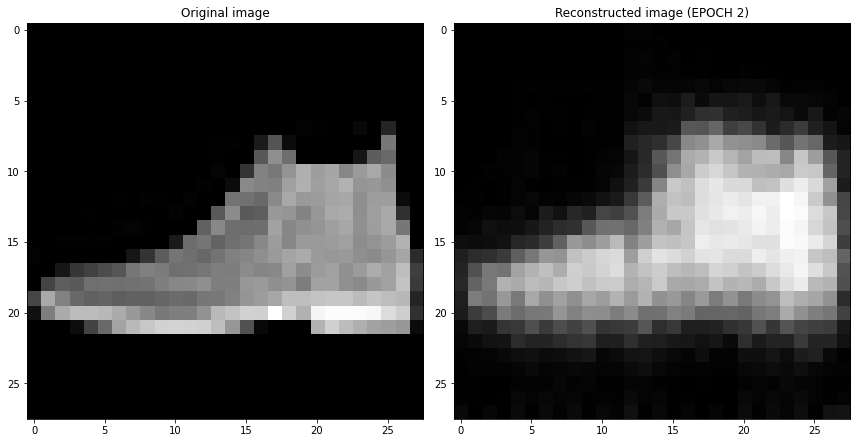

EPOCH 3/10

partial train loss (single batch): 0.032911

partial train loss (single batch): 0.035284

partial train loss (single batch): 0.033702

partial train loss (single batch): 0.033557

partial train loss (single batch): 0.035472

partial train loss (single batch): 0.031997

partial train loss (single batch): 0.034108

partial train loss (single batch): 0.033418

partial train loss (single batch): 0.035608

partial train loss (single batch): 0.034420

partial train loss (single batch): 0.033376

partial train loss (single batch): 0.032958

partial train loss (single batch): 0.030768

partial train loss (single batch): 0.035112

partial train loss (single batch): 0.031294

partial train loss (single batch): 0.035070

partial train loss (single batch): 0.033939

partial train loss (single batch): 0.034959

partial train loss (single batch): 0.033302

partial train loss (single batch): 0.035044

partial train loss (single batch): 0.032666

partial train loss (single batch): 0.032641

partial train loss (single batch): 0.031773

partial train loss (single batch): 0.033923

partial train loss (single batch): 0.032665

partial train loss (single batch): 0.032288

partial train loss (single batch): 0.033190

partial train loss (single batch): 0.032123

partial train loss (single batch): 0.033060

partial train loss (single batch): 0.032722

partial train loss (single batch): 0.033916

partial train loss (single batch): 0.033431

partial train loss (single batch): 0.031363

partial train loss (single batch): 0.034124

partial train loss (single batch): 0.033514

partial train loss (single batch): 0.033526

partial train loss (single batch): 0.033439

partial train loss (single batch): 0.033549

partial train loss (single batch): 0.032935

partial train loss (single batch): 0.032013

partial train loss (single batch): 0.032776

partial train loss (single batch): 0.033190

partial train loss (single batch): 0.033649

partial train loss (single batch): 0.032181

partial train loss (single batch): 0.033104

partial train loss (single batch): 0.031998

partial train loss (single batch): 0.032677

partial train loss (single batch): 0.032416

partial train loss (single batch): 0.033707

partial train loss (single batch): 0.032891

partial train loss (single batch): 0.031228

partial train loss (single batch): 0.033846

partial train loss (single batch): 0.031995

partial train loss (single batch): 0.033379

partial train loss (single batch): 0.031968

partial train loss (single batch): 0.033915

partial train loss (single batch): 0.036060

partial train loss (single batch): 0.034264

partial train loss (single batch): 0.033343

partial train loss (single batch): 0.034057

partial train loss (single batch): 0.033182

partial train loss (single batch): 0.032313

partial train loss (single batch): 0.033261

partial train loss (single batch): 0.032406

partial train loss (single batch): 0.031810

partial train loss (single batch): 0.034644

partial train loss (single batch): 0.033820

partial train loss (single batch): 0.032799

partial train loss (single batch): 0.033825

partial train loss (single batch): 0.032273

partial train loss (single batch): 0.033521

partial train loss (single batch): 0.034125

partial train loss (single batch): 0.030924

partial train loss (single batch): 0.032252

partial train loss (single batch): 0.031843

partial train loss (single batch): 0.032120

partial train loss (single batch): 0.032875

partial train loss (single batch): 0.033531

partial train loss (single batch): 0.033451

partial train loss (single batch): 0.031486

partial train loss (single batch): 0.033054

partial train loss (single batch): 0.031800

partial train loss (single batch): 0.032424

partial train loss (single batch): 0.031712

partial train loss (single batch): 0.031243

partial train loss (single batch): 0.032187

partial train loss (single batch): 0.033542

partial train loss (single batch): 0.031210

partial train loss (single batch): 0.033081

partial train loss (single batch): 0.032463

partial train loss (single batch): 0.033207

partial train loss (single batch): 0.031689

partial train loss (single batch): 0.033507

partial train loss (single batch): 0.032074

partial train loss (single batch): 0.031434

partial train loss (single batch): 0.032537

partial train loss (single batch): 0.033325

partial train loss (single batch): 0.032894

partial train loss (single batch): 0.034676

partial train loss (single batch): 0.028689

partial train loss (single batch): 0.032093

partial train loss (single batch): 0.032961

partial train loss (single batch): 0.033204

partial train loss (single batch): 0.032986

partial train loss (single batch): 0.032103

partial train loss (single batch): 0.031802

partial train loss (single batch): 0.032776

partial train loss (single batch): 0.032778

partial train loss (single batch): 0.032660

partial train loss (single batch): 0.033447

partial train loss (single batch): 0.032957

partial train loss (single batch): 0.034428

partial train loss (single batch): 0.033756

partial train loss (single batch): 0.032637

partial train loss (single batch): 0.032166

partial train loss (single batch): 0.032125

partial train loss (single batch): 0.034449

partial train loss (single batch): 0.032367

partial train loss (single batch): 0.033274

partial train loss (single batch): 0.032052

partial train loss (single batch): 0.032111

partial train loss (single batch): 0.032585

partial train loss (single batch): 0.032662

partial train loss (single batch): 0.031568

partial train loss (single batch): 0.032432

partial train loss (single batch): 0.030104

partial train loss (single batch): 0.032872

partial train loss (single batch): 0.033068

partial train loss (single batch): 0.031889

partial train loss (single batch): 0.032948

partial train loss (single batch): 0.032707

partial train loss (single batch): 0.031685

partial train loss (single batch): 0.032525

partial train loss (single batch): 0.030136

partial train loss (single batch): 0.032823

partial train loss (single batch): 0.031632

partial train loss (single batch): 0.032051

partial train loss (single batch): 0.032527

partial train loss (single batch): 0.032739

partial train loss (single batch): 0.032584

partial train loss (single batch): 0.030323

partial train loss (single batch): 0.032055

partial train loss (single batch): 0.032002

partial train loss (single batch): 0.031411

partial train loss (single batch): 0.031615

partial train loss (single batch): 0.031479

partial train loss (single batch): 0.033840

partial train loss (single batch): 0.031487

partial train loss (single batch): 0.031078

partial train loss (single batch): 0.033386

partial train loss (single batch): 0.032849

partial train loss (single batch): 0.029842

partial train loss (single batch): 0.032801

partial train loss (single batch): 0.030827

partial train loss (single batch): 0.031133

partial train loss (single batch): 0.031276

partial train loss (single batch): 0.031617

partial train loss (single batch): 0.033427

partial train loss (single batch): 0.033605

partial train loss (single batch): 0.031389

partial train loss (single batch): 0.031751

partial train loss (single batch): 0.032410

partial train loss (single batch): 0.032579

partial train loss (single batch): 0.031661

partial train loss (single batch): 0.032343

partial train loss (single batch): 0.033044

partial train loss (single batch): 0.031497

partial train loss (single batch): 0.030151

partial train loss (single batch): 0.031819

partial train loss (single batch): 0.032018

partial train loss (single batch): 0.033586

partial train loss (single batch): 0.029599

partial train loss (single batch): 0.030141

partial train loss (single batch): 0.030812

partial train loss (single batch): 0.032068

partial train loss (single batch): 0.031786

partial train loss (single batch): 0.031028

partial train loss (single batch): 0.031733

partial train loss (single batch): 0.033419

partial train loss (single batch): 0.033681

partial train loss (single batch): 0.033068

partial train loss (single batch): 0.031318

partial train loss (single batch): 0.032156

partial train loss (single batch): 0.030013

partial train loss (single batch): 0.032735

partial train loss (single batch): 0.033580

partial train loss (single batch): 0.031239

partial train loss (single batch): 0.033445

partial train loss (single batch): 0.031666

partial train loss (single batch): 0.031432

partial train loss (single batch): 0.033942

partial train loss (single batch): 0.032699

partial train loss (single batch): 0.031606

partial train loss (single batch): 0.032204

partial train loss (single batch): 0.032577

partial train loss (single batch): 0.032570

partial train loss (single batch): 0.030422

partial train loss (single batch): 0.032840

partial train loss (single batch): 0.032148

partial train loss (single batch): 0.032073

partial train loss (single batch): 0.031102

partial train loss (single batch): 0.031792

partial train loss (single batch): 0.032653

partial train loss (single batch): 0.032346

partial train loss (single batch): 0.032612

partial train loss (single batch): 0.031659

partial train loss (single batch): 0.031441

partial train loss (single batch): 0.029712

partial train loss (single batch): 0.030591

partial train loss (single batch): 0.031965

partial train loss (single batch): 0.031790

partial train loss (single batch): 0.031047

partial train loss (single batch): 0.032315

partial train loss (single batch): 0.031989

partial train loss (single batch): 0.032273

partial train loss (single batch): 0.031616

partial train loss (single batch): 0.031530

partial train loss (single batch): 0.032848

partial train loss (single batch): 0.028829

partial train loss (single batch): 0.032262

partial train loss (single batch): 0.031448

partial train loss (single batch): 0.031800

partial train loss (single batch): 0.031795

partial train loss (single batch): 0.030894

partial train loss (single batch): 0.032727

partial train loss (single batch): 0.032176

partial train loss (single batch): 0.031395

partial train loss (single batch): 0.031477

partial train loss (single batch): 0.031866

partial train loss (single batch): 0.032024

partial train loss (single batch): 0.030930

partial train loss (single batch): 0.031607

partial train loss (single batch): 0.028792

partial train loss (single batch): 0.031255

partial train loss (single batch): 0.035277

VALIDATION - EPOCH 3/10 - loss: 0.031430

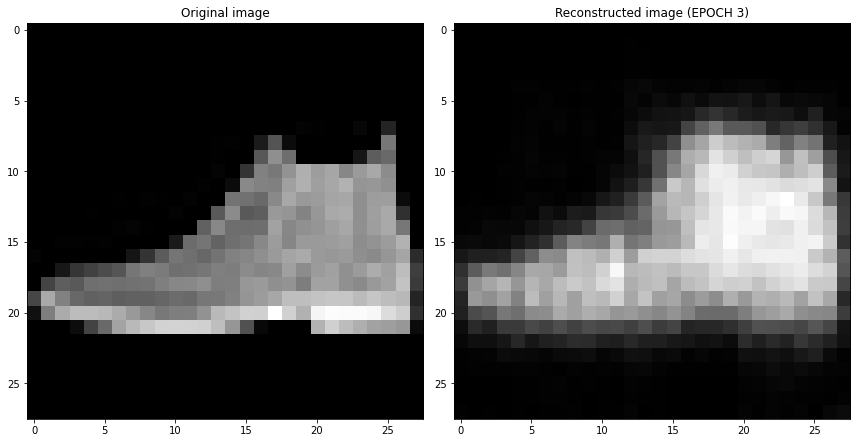

EPOCH 4/10

partial train loss (single batch): 0.033386

partial train loss (single batch): 0.032728

partial train loss (single batch): 0.030546

partial train loss (single batch): 0.031751

partial train loss (single batch): 0.031605

partial train loss (single batch): 0.029807

partial train loss (single batch): 0.032539

partial train loss (single batch): 0.033116

partial train loss (single batch): 0.030968

partial train loss (single batch): 0.030888

partial train loss (single batch): 0.030678

partial train loss (single batch): 0.030145

partial train loss (single batch): 0.031285

partial train loss (single batch): 0.030265

partial train loss (single batch): 0.030834

partial train loss (single batch): 0.031115

partial train loss (single batch): 0.030971

partial train loss (single batch): 0.031930

partial train loss (single batch): 0.032839

partial train loss (single batch): 0.032430

partial train loss (single batch): 0.031538

partial train loss (single batch): 0.030806

partial train loss (single batch): 0.031609

partial train loss (single batch): 0.032616

partial train loss (single batch): 0.032365

partial train loss (single batch): 0.031566

partial train loss (single batch): 0.032155

partial train loss (single batch): 0.032306

partial train loss (single batch): 0.029188

partial train loss (single batch): 0.029787

partial train loss (single batch): 0.031358

partial train loss (single batch): 0.032051

partial train loss (single batch): 0.030473

partial train loss (single batch): 0.031570

partial train loss (single batch): 0.031772

partial train loss (single batch): 0.033221

partial train loss (single batch): 0.030210

partial train loss (single batch): 0.032856

partial train loss (single batch): 0.030513

partial train loss (single batch): 0.029928

partial train loss (single batch): 0.030986

partial train loss (single batch): 0.031946

partial train loss (single batch): 0.031238

partial train loss (single batch): 0.031507

partial train loss (single batch): 0.032174

partial train loss (single batch): 0.030737

partial train loss (single batch): 0.029691

partial train loss (single batch): 0.032659

partial train loss (single batch): 0.030890

partial train loss (single batch): 0.031261

partial train loss (single batch): 0.029905

partial train loss (single batch): 0.031818

partial train loss (single batch): 0.032684

partial train loss (single batch): 0.030437

partial train loss (single batch): 0.030764

partial train loss (single batch): 0.030421

partial train loss (single batch): 0.030045

partial train loss (single batch): 0.030168

partial train loss (single batch): 0.031008

partial train loss (single batch): 0.029692

partial train loss (single batch): 0.029680

partial train loss (single batch): 0.030984

partial train loss (single batch): 0.029522

partial train loss (single batch): 0.031666

partial train loss (single batch): 0.031899

partial train loss (single batch): 0.030621

partial train loss (single batch): 0.031136

partial train loss (single batch): 0.032173

partial train loss (single batch): 0.030924

partial train loss (single batch): 0.030652

partial train loss (single batch): 0.031187

partial train loss (single batch): 0.029741

partial train loss (single batch): 0.030518

partial train loss (single batch): 0.030043

partial train loss (single batch): 0.029711

partial train loss (single batch): 0.029762

partial train loss (single batch): 0.032629

partial train loss (single batch): 0.031617

partial train loss (single batch): 0.029593

partial train loss (single batch): 0.032682

partial train loss (single batch): 0.032454

partial train loss (single batch): 0.029954

partial train loss (single batch): 0.032096

partial train loss (single batch): 0.030935

partial train loss (single batch): 0.030368

partial train loss (single batch): 0.030670

partial train loss (single batch): 0.031032

partial train loss (single batch): 0.030472

partial train loss (single batch): 0.032436

partial train loss (single batch): 0.029586

partial train loss (single batch): 0.030359

partial train loss (single batch): 0.031386

partial train loss (single batch): 0.028681

partial train loss (single batch): 0.030813

partial train loss (single batch): 0.031825

partial train loss (single batch): 0.030681

partial train loss (single batch): 0.031979

partial train loss (single batch): 0.031367

partial train loss (single batch): 0.031287

partial train loss (single batch): 0.031613

partial train loss (single batch): 0.028872

partial train loss (single batch): 0.030331

partial train loss (single batch): 0.031842

partial train loss (single batch): 0.030086

partial train loss (single batch): 0.030965

partial train loss (single batch): 0.029647

partial train loss (single batch): 0.030673

partial train loss (single batch): 0.031272

partial train loss (single batch): 0.030655

partial train loss (single batch): 0.030828

partial train loss (single batch): 0.029845

partial train loss (single batch): 0.031003

partial train loss (single batch): 0.033057

partial train loss (single batch): 0.033149

partial train loss (single batch): 0.029093

partial train loss (single batch): 0.028736

partial train loss (single batch): 0.032931

partial train loss (single batch): 0.031940

partial train loss (single batch): 0.032350

partial train loss (single batch): 0.030002

partial train loss (single batch): 0.031349

partial train loss (single batch): 0.031401

partial train loss (single batch): 0.030751

partial train loss (single batch): 0.029608

partial train loss (single batch): 0.030714

partial train loss (single batch): 0.030899

partial train loss (single batch): 0.029149

partial train loss (single batch): 0.030842

partial train loss (single batch): 0.028342

partial train loss (single batch): 0.031018

partial train loss (single batch): 0.031235

partial train loss (single batch): 0.032557

partial train loss (single batch): 0.030849

partial train loss (single batch): 0.030619

partial train loss (single batch): 0.030551

partial train loss (single batch): 0.029701

partial train loss (single batch): 0.031740

partial train loss (single batch): 0.029035

partial train loss (single batch): 0.030764

partial train loss (single batch): 0.031023

partial train loss (single batch): 0.029321

partial train loss (single batch): 0.029137

partial train loss (single batch): 0.030670

partial train loss (single batch): 0.031720

partial train loss (single batch): 0.030310

partial train loss (single batch): 0.030410

partial train loss (single batch): 0.029710

partial train loss (single batch): 0.032934

partial train loss (single batch): 0.029266

partial train loss (single batch): 0.030908

partial train loss (single batch): 0.030672

partial train loss (single batch): 0.031517

partial train loss (single batch): 0.028696

partial train loss (single batch): 0.030506

partial train loss (single batch): 0.030223

partial train loss (single batch): 0.030260

partial train loss (single batch): 0.031110

partial train loss (single batch): 0.029836

partial train loss (single batch): 0.030234

partial train loss (single batch): 0.030984

partial train loss (single batch): 0.030517

partial train loss (single batch): 0.032026

partial train loss (single batch): 0.029667

partial train loss (single batch): 0.032554

partial train loss (single batch): 0.030061

partial train loss (single batch): 0.029149

partial train loss (single batch): 0.029362

partial train loss (single batch): 0.029556

partial train loss (single batch): 0.030918

partial train loss (single batch): 0.029570

partial train loss (single batch): 0.029562

partial train loss (single batch): 0.030148

partial train loss (single batch): 0.030052

partial train loss (single batch): 0.031577

partial train loss (single batch): 0.028337

partial train loss (single batch): 0.030329

partial train loss (single batch): 0.028992

partial train loss (single batch): 0.029871

partial train loss (single batch): 0.030408

partial train loss (single batch): 0.030242

partial train loss (single batch): 0.029471

partial train loss (single batch): 0.029322

partial train loss (single batch): 0.031227

partial train loss (single batch): 0.028740

partial train loss (single batch): 0.030490

partial train loss (single batch): 0.029873

partial train loss (single batch): 0.030278

partial train loss (single batch): 0.027957

partial train loss (single batch): 0.030027

partial train loss (single batch): 0.033758

partial train loss (single batch): 0.029837

partial train loss (single batch): 0.031460

partial train loss (single batch): 0.030777

partial train loss (single batch): 0.032045

partial train loss (single batch): 0.029916

partial train loss (single batch): 0.030263

partial train loss (single batch): 0.030080

partial train loss (single batch): 0.029511

partial train loss (single batch): 0.029727

partial train loss (single batch): 0.029160

partial train loss (single batch): 0.030929

partial train loss (single batch): 0.031916

partial train loss (single batch): 0.030696

partial train loss (single batch): 0.031027

partial train loss (single batch): 0.032591

partial train loss (single batch): 0.031375

partial train loss (single batch): 0.029798

partial train loss (single batch): 0.030598

partial train loss (single batch): 0.030897

partial train loss (single batch): 0.030029

partial train loss (single batch): 0.031775

partial train loss (single batch): 0.031359

partial train loss (single batch): 0.029681

partial train loss (single batch): 0.028966

partial train loss (single batch): 0.032166

partial train loss (single batch): 0.031452

partial train loss (single batch): 0.030594

partial train loss (single batch): 0.029835

partial train loss (single batch): 0.031424

partial train loss (single batch): 0.031695

partial train loss (single batch): 0.030797

partial train loss (single batch): 0.032064

partial train loss (single batch): 0.031434

partial train loss (single batch): 0.032677

partial train loss (single batch): 0.029171

partial train loss (single batch): 0.029369

partial train loss (single batch): 0.031403

partial train loss (single batch): 0.031249

partial train loss (single batch): 0.032278

partial train loss (single batch): 0.031278

partial train loss (single batch): 0.032244

partial train loss (single batch): 0.027961

partial train loss (single batch): 0.030649

partial train loss (single batch): 0.031065

partial train loss (single batch): 0.029903

VALIDATION - EPOCH 4/10 - loss: 0.030401

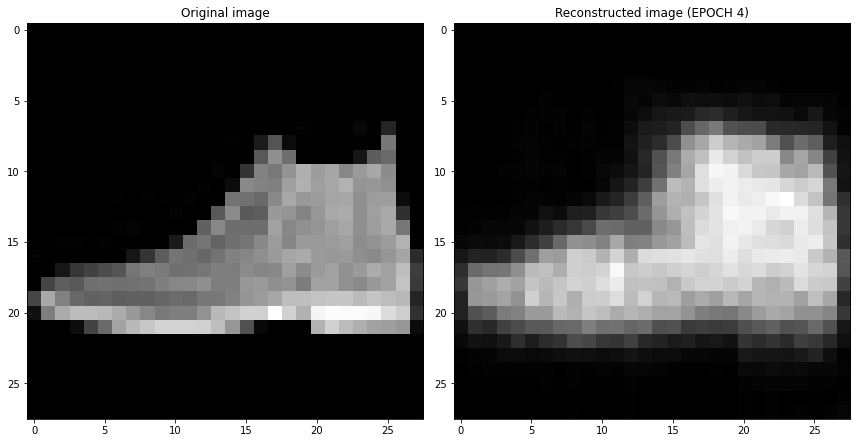

EPOCH 5/10

partial train loss (single batch): 0.031111

partial train loss (single batch): 0.029728

partial train loss (single batch): 0.029410

partial train loss (single batch): 0.029457

partial train loss (single batch): 0.030456

partial train loss (single batch): 0.031742

partial train loss (single batch): 0.029020

partial train loss (single batch): 0.030496

partial train loss (single batch): 0.030995

partial train loss (single batch): 0.029495

partial train loss (single batch): 0.029555

partial train loss (single batch): 0.030580

partial train loss (single batch): 0.030724

partial train loss (single batch): 0.030611

partial train loss (single batch): 0.029312

partial train loss (single batch): 0.031058

partial train loss (single batch): 0.030312

partial train loss (single batch): 0.031995

partial train loss (single batch): 0.030864

partial train loss (single batch): 0.029652

partial train loss (single batch): 0.031023

partial train loss (single batch): 0.029906

partial train loss (single batch): 0.029783

partial train loss (single batch): 0.030383

partial train loss (single batch): 0.029252

partial train loss (single batch): 0.029860

partial train loss (single batch): 0.030104

partial train loss (single batch): 0.031770

partial train loss (single batch): 0.030248

partial train loss (single batch): 0.030547

partial train loss (single batch): 0.028041

partial train loss (single batch): 0.028410

partial train loss (single batch): 0.028972

partial train loss (single batch): 0.030500

partial train loss (single batch): 0.029143

partial train loss (single batch): 0.030032

partial train loss (single batch): 0.030533

partial train loss (single batch): 0.028574

partial train loss (single batch): 0.028760

partial train loss (single batch): 0.032315

partial train loss (single batch): 0.030692

partial train loss (single batch): 0.031044

partial train loss (single batch): 0.029809

partial train loss (single batch): 0.032274

partial train loss (single batch): 0.030948

partial train loss (single batch): 0.030119

partial train loss (single batch): 0.029941

partial train loss (single batch): 0.029152

partial train loss (single batch): 0.029992

partial train loss (single batch): 0.029833

partial train loss (single batch): 0.029542

partial train loss (single batch): 0.029234

partial train loss (single batch): 0.030469

partial train loss (single batch): 0.030142

partial train loss (single batch): 0.030236

partial train loss (single batch): 0.030226

partial train loss (single batch): 0.029006

partial train loss (single batch): 0.028568

partial train loss (single batch): 0.029554

partial train loss (single batch): 0.030866

partial train loss (single batch): 0.028461

partial train loss (single batch): 0.030738

partial train loss (single batch): 0.030720

partial train loss (single batch): 0.030917

partial train loss (single batch): 0.029870

partial train loss (single batch): 0.030963

partial train loss (single batch): 0.030720

partial train loss (single batch): 0.030154

partial train loss (single batch): 0.030092

partial train loss (single batch): 0.029616

partial train loss (single batch): 0.031133

partial train loss (single batch): 0.030493

partial train loss (single batch): 0.030198

partial train loss (single batch): 0.029433

partial train loss (single batch): 0.030687

partial train loss (single batch): 0.029773

partial train loss (single batch): 0.031122

partial train loss (single batch): 0.030894

partial train loss (single batch): 0.029976

partial train loss (single batch): 0.029732

partial train loss (single batch): 0.029890

partial train loss (single batch): 0.028962

partial train loss (single batch): 0.030223

partial train loss (single batch): 0.030947

partial train loss (single batch): 0.030307

partial train loss (single batch): 0.029003

partial train loss (single batch): 0.030244

partial train loss (single batch): 0.031626

partial train loss (single batch): 0.030816

partial train loss (single batch): 0.031015

partial train loss (single batch): 0.030494

partial train loss (single batch): 0.031033

partial train loss (single batch): 0.030442

partial train loss (single batch): 0.029666

partial train loss (single batch): 0.029716

partial train loss (single batch): 0.030604

partial train loss (single batch): 0.028970

partial train loss (single batch): 0.030176

partial train loss (single batch): 0.029693

partial train loss (single batch): 0.030184

partial train loss (single batch): 0.029023

partial train loss (single batch): 0.029253

partial train loss (single batch): 0.028154

partial train loss (single batch): 0.031022

partial train loss (single batch): 0.031395

partial train loss (single batch): 0.029348

partial train loss (single batch): 0.030714

partial train loss (single batch): 0.030887

partial train loss (single batch): 0.028590

partial train loss (single batch): 0.029889

partial train loss (single batch): 0.030188

partial train loss (single batch): 0.028333

partial train loss (single batch): 0.032864

partial train loss (single batch): 0.029681

partial train loss (single batch): 0.028849

partial train loss (single batch): 0.029525

partial train loss (single batch): 0.029557

partial train loss (single batch): 0.029322

partial train loss (single batch): 0.030317

partial train loss (single batch): 0.029620

partial train loss (single batch): 0.030505

partial train loss (single batch): 0.029442

partial train loss (single batch): 0.029106

partial train loss (single batch): 0.028912

partial train loss (single batch): 0.028020

partial train loss (single batch): 0.028785

partial train loss (single batch): 0.029806

partial train loss (single batch): 0.029091

partial train loss (single batch): 0.030371

partial train loss (single batch): 0.028978

partial train loss (single batch): 0.029972

partial train loss (single batch): 0.030996

partial train loss (single batch): 0.030828

partial train loss (single batch): 0.032559

partial train loss (single batch): 0.031187

partial train loss (single batch): 0.030501

partial train loss (single batch): 0.028773

partial train loss (single batch): 0.028613

partial train loss (single batch): 0.031660

partial train loss (single batch): 0.030750

partial train loss (single batch): 0.030529

partial train loss (single batch): 0.029960

partial train loss (single batch): 0.029806

partial train loss (single batch): 0.029167

partial train loss (single batch): 0.028783

partial train loss (single batch): 0.030596

partial train loss (single batch): 0.032216

partial train loss (single batch): 0.030976

partial train loss (single batch): 0.028584

partial train loss (single batch): 0.029774

partial train loss (single batch): 0.030421

partial train loss (single batch): 0.028167

partial train loss (single batch): 0.030087

partial train loss (single batch): 0.028485

partial train loss (single batch): 0.030238

partial train loss (single batch): 0.031202

partial train loss (single batch): 0.027578

partial train loss (single batch): 0.029517

partial train loss (single batch): 0.031239

partial train loss (single batch): 0.030354

partial train loss (single batch): 0.030002

partial train loss (single batch): 0.029742

partial train loss (single batch): 0.029351

partial train loss (single batch): 0.027937

partial train loss (single batch): 0.031040

partial train loss (single batch): 0.029750

partial train loss (single batch): 0.029236

partial train loss (single batch): 0.030058

partial train loss (single batch): 0.029114

partial train loss (single batch): 0.028470

partial train loss (single batch): 0.028168

partial train loss (single batch): 0.028059

partial train loss (single batch): 0.028488

partial train loss (single batch): 0.028778

partial train loss (single batch): 0.031046

partial train loss (single batch): 0.029647

partial train loss (single batch): 0.030146

partial train loss (single batch): 0.030772

partial train loss (single batch): 0.029289

partial train loss (single batch): 0.028678

partial train loss (single batch): 0.029025

partial train loss (single batch): 0.029536

partial train loss (single batch): 0.029078

partial train loss (single batch): 0.029740

partial train loss (single batch): 0.028192

partial train loss (single batch): 0.027991

partial train loss (single batch): 0.029270

partial train loss (single batch): 0.028084

partial train loss (single batch): 0.029442

partial train loss (single batch): 0.030230

partial train loss (single batch): 0.028636

partial train loss (single batch): 0.030636

partial train loss (single batch): 0.029660

partial train loss (single batch): 0.030370

partial train loss (single batch): 0.030953

partial train loss (single batch): 0.028868

partial train loss (single batch): 0.027468

partial train loss (single batch): 0.028302

partial train loss (single batch): 0.029022

partial train loss (single batch): 0.029740

partial train loss (single batch): 0.030948

partial train loss (single batch): 0.028542

partial train loss (single batch): 0.028291

partial train loss (single batch): 0.030924

partial train loss (single batch): 0.029038

partial train loss (single batch): 0.030903

partial train loss (single batch): 0.029038

partial train loss (single batch): 0.031577

partial train loss (single batch): 0.028766

partial train loss (single batch): 0.029515

partial train loss (single batch): 0.027996

partial train loss (single batch): 0.030313

partial train loss (single batch): 0.030867

partial train loss (single batch): 0.029733

partial train loss (single batch): 0.029459

partial train loss (single batch): 0.028960

partial train loss (single batch): 0.029322

partial train loss (single batch): 0.030571

partial train loss (single batch): 0.029546

partial train loss (single batch): 0.029579

partial train loss (single batch): 0.030206

partial train loss (single batch): 0.029261

partial train loss (single batch): 0.028281

partial train loss (single batch): 0.028727

partial train loss (single batch): 0.028898

partial train loss (single batch): 0.030770

partial train loss (single batch): 0.029382

partial train loss (single batch): 0.028130

partial train loss (single batch): 0.030043

partial train loss (single batch): 0.030444

partial train loss (single batch): 0.029176

partial train loss (single batch): 0.028599

partial train loss (single batch): 0.029731

partial train loss (single batch): 0.029781

partial train loss (single batch): 0.031648

VALIDATION - EPOCH 5/10 - loss: 0.029389

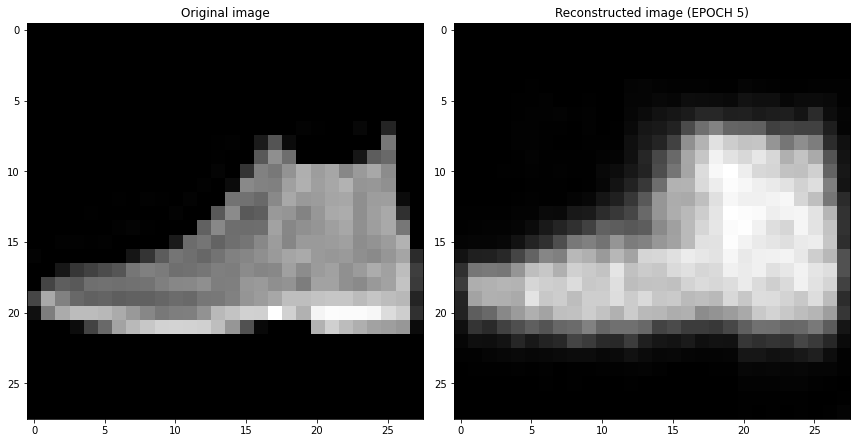

EPOCH 6/10

partial train loss (single batch): 0.029339

partial train loss (single batch): 0.030640

partial train loss (single batch): 0.030385

partial train loss (single batch): 0.028754

partial train loss (single batch): 0.029539

partial train loss (single batch): 0.030439

partial train loss (single batch): 0.029760

partial train loss (single batch): 0.030158

partial train loss (single batch): 0.030604

partial train loss (single batch): 0.030255

partial train loss (single batch): 0.029685

partial train loss (single batch): 0.028212

partial train loss (single batch): 0.027449

partial train loss (single batch): 0.027829

partial train loss (single batch): 0.029123

partial train loss (single batch): 0.029244

partial train loss (single batch): 0.029556

partial train loss (single batch): 0.028576

partial train loss (single batch): 0.029519

partial train loss (single batch): 0.031126

partial train loss (single batch): 0.030832

partial train loss (single batch): 0.030922

partial train loss (single batch): 0.030330

partial train loss (single batch): 0.029478

partial train loss (single batch): 0.030480

partial train loss (single batch): 0.028607

partial train loss (single batch): 0.031352

partial train loss (single batch): 0.028169

partial train loss (single batch): 0.028846

partial train loss (single batch): 0.030202

partial train loss (single batch): 0.029863

partial train loss (single batch): 0.030739

partial train loss (single batch): 0.029486

partial train loss (single batch): 0.030190

partial train loss (single batch): 0.028638

partial train loss (single batch): 0.030218

partial train loss (single batch): 0.029192

partial train loss (single batch): 0.027842

partial train loss (single batch): 0.029132

partial train loss (single batch): 0.030054

partial train loss (single batch): 0.030664

partial train loss (single batch): 0.030367

partial train loss (single batch): 0.029066

partial train loss (single batch): 0.029572

partial train loss (single batch): 0.030053

partial train loss (single batch): 0.029014

partial train loss (single batch): 0.029254

partial train loss (single batch): 0.028766

partial train loss (single batch): 0.027462

partial train loss (single batch): 0.028013

partial train loss (single batch): 0.027955

partial train loss (single batch): 0.028355

partial train loss (single batch): 0.029397

partial train loss (single batch): 0.027539

partial train loss (single batch): 0.029461

partial train loss (single batch): 0.028743

partial train loss (single batch): 0.029533

partial train loss (single batch): 0.031462

partial train loss (single batch): 0.029249

partial train loss (single batch): 0.027844

partial train loss (single batch): 0.029790

partial train loss (single batch): 0.029135

partial train loss (single batch): 0.028162

partial train loss (single batch): 0.028128

partial train loss (single batch): 0.028139

partial train loss (single batch): 0.029185

partial train loss (single batch): 0.030118

partial train loss (single batch): 0.027944

partial train loss (single batch): 0.029669

partial train loss (single batch): 0.028988

partial train loss (single batch): 0.028661

partial train loss (single batch): 0.028812

partial train loss (single batch): 0.030020

partial train loss (single batch): 0.029316

partial train loss (single batch): 0.028304

partial train loss (single batch): 0.030998

partial train loss (single batch): 0.029649

partial train loss (single batch): 0.028425

partial train loss (single batch): 0.030941

partial train loss (single batch): 0.028792

partial train loss (single batch): 0.029270

partial train loss (single batch): 0.027372

partial train loss (single batch): 0.028114

partial train loss (single batch): 0.029811

partial train loss (single batch): 0.029134

partial train loss (single batch): 0.027381

partial train loss (single batch): 0.029292

partial train loss (single batch): 0.030262

partial train loss (single batch): 0.028680

partial train loss (single batch): 0.029524

partial train loss (single batch): 0.029089

partial train loss (single batch): 0.028295

partial train loss (single batch): 0.030249

partial train loss (single batch): 0.029658

partial train loss (single batch): 0.028987

partial train loss (single batch): 0.031616

partial train loss (single batch): 0.028769

partial train loss (single batch): 0.030360

partial train loss (single batch): 0.028755

partial train loss (single batch): 0.028492

partial train loss (single batch): 0.027621

partial train loss (single batch): 0.026760

partial train loss (single batch): 0.028705

partial train loss (single batch): 0.029009

partial train loss (single batch): 0.029015

partial train loss (single batch): 0.030191

partial train loss (single batch): 0.029176

partial train loss (single batch): 0.030522

partial train loss (single batch): 0.028977

partial train loss (single batch): 0.029710

partial train loss (single batch): 0.028420

partial train loss (single batch): 0.029058

partial train loss (single batch): 0.029219

partial train loss (single batch): 0.029274

partial train loss (single batch): 0.027671

partial train loss (single batch): 0.028336

partial train loss (single batch): 0.029326

partial train loss (single batch): 0.029404

partial train loss (single batch): 0.029444

partial train loss (single batch): 0.029759

partial train loss (single batch): 0.029926

partial train loss (single batch): 0.028920

partial train loss (single batch): 0.028535

partial train loss (single batch): 0.029667

partial train loss (single batch): 0.027463

partial train loss (single batch): 0.029357

partial train loss (single batch): 0.027645

partial train loss (single batch): 0.029648

partial train loss (single batch): 0.027923

partial train loss (single batch): 0.029288

partial train loss (single batch): 0.028586

partial train loss (single batch): 0.029029

partial train loss (single batch): 0.028189

partial train loss (single batch): 0.027904

partial train loss (single batch): 0.029666

partial train loss (single batch): 0.028687

partial train loss (single batch): 0.028783

partial train loss (single batch): 0.029521

partial train loss (single batch): 0.028415

partial train loss (single batch): 0.030590

partial train loss (single batch): 0.028755

partial train loss (single batch): 0.029280

partial train loss (single batch): 0.028119

partial train loss (single batch): 0.027743

partial train loss (single batch): 0.030869

partial train loss (single batch): 0.029045

partial train loss (single batch): 0.029013

partial train loss (single batch): 0.028318

partial train loss (single batch): 0.028433

partial train loss (single batch): 0.027974

partial train loss (single batch): 0.028508

partial train loss (single batch): 0.030331

partial train loss (single batch): 0.029210

partial train loss (single batch): 0.029833

partial train loss (single batch): 0.029028

partial train loss (single batch): 0.029941

partial train loss (single batch): 0.028245

partial train loss (single batch): 0.028852

partial train loss (single batch): 0.029116

partial train loss (single batch): 0.028469

partial train loss (single batch): 0.030837

partial train loss (single batch): 0.029380

partial train loss (single batch): 0.029767

partial train loss (single batch): 0.027807

partial train loss (single batch): 0.027791

partial train loss (single batch): 0.027650

partial train loss (single batch): 0.028588

partial train loss (single batch): 0.028250

partial train loss (single batch): 0.030372

partial train loss (single batch): 0.028654

partial train loss (single batch): 0.027141

partial train loss (single batch): 0.028824

partial train loss (single batch): 0.027819

partial train loss (single batch): 0.028749

partial train loss (single batch): 0.030987

partial train loss (single batch): 0.027837

partial train loss (single batch): 0.030150

partial train loss (single batch): 0.028972

partial train loss (single batch): 0.030180

partial train loss (single batch): 0.028447

partial train loss (single batch): 0.030015

partial train loss (single batch): 0.028828

partial train loss (single batch): 0.028258

partial train loss (single batch): 0.029188

partial train loss (single batch): 0.028927

partial train loss (single batch): 0.028174

partial train loss (single batch): 0.028971

partial train loss (single batch): 0.028282

partial train loss (single batch): 0.028714

partial train loss (single batch): 0.028348

partial train loss (single batch): 0.028366

partial train loss (single batch): 0.028543

partial train loss (single batch): 0.026073

partial train loss (single batch): 0.029721

partial train loss (single batch): 0.028517

partial train loss (single batch): 0.029230

partial train loss (single batch): 0.028654

partial train loss (single batch): 0.028665

partial train loss (single batch): 0.028244

partial train loss (single batch): 0.028885

partial train loss (single batch): 0.027881

partial train loss (single batch): 0.028352

partial train loss (single batch): 0.030312

partial train loss (single batch): 0.027679

partial train loss (single batch): 0.028178

partial train loss (single batch): 0.030869

partial train loss (single batch): 0.028055

partial train loss (single batch): 0.028266

partial train loss (single batch): 0.028802

partial train loss (single batch): 0.029385

partial train loss (single batch): 0.031619

partial train loss (single batch): 0.027912

partial train loss (single batch): 0.030378

partial train loss (single batch): 0.030921

partial train loss (single batch): 0.028611

partial train loss (single batch): 0.027424

partial train loss (single batch): 0.029532

partial train loss (single batch): 0.028776

partial train loss (single batch): 0.030214

partial train loss (single batch): 0.027994

partial train loss (single batch): 0.030918

partial train loss (single batch): 0.028621

partial train loss (single batch): 0.028720

partial train loss (single batch): 0.028123

partial train loss (single batch): 0.029040

partial train loss (single batch): 0.028498

partial train loss (single batch): 0.028061

partial train loss (single batch): 0.028343

partial train loss (single batch): 0.029780

partial train loss (single batch): 0.028839

partial train loss (single batch): 0.029467

partial train loss (single batch): 0.029767

partial train loss (single batch): 0.027404

partial train loss (single batch): 0.028298

partial train loss (single batch): 0.030628

VALIDATION - EPOCH 6/10 - loss: 0.028667

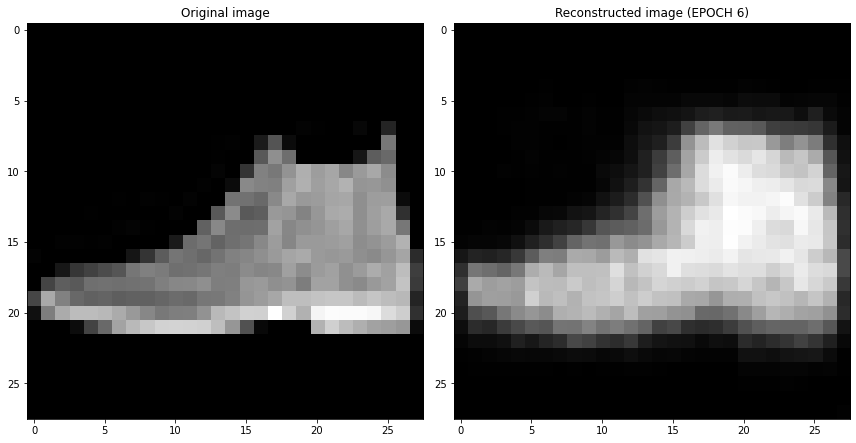

EPOCH 7/10

partial train loss (single batch): 0.028956

partial train loss (single batch): 0.028921

partial train loss (single batch): 0.029554

partial train loss (single batch): 0.027767

partial train loss (single batch): 0.028250

partial train loss (single batch): 0.027671

partial train loss (single batch): 0.028387

partial train loss (single batch): 0.029991

partial train loss (single batch): 0.029047

partial train loss (single batch): 0.027564

partial train loss (single batch): 0.029235

partial train loss (single batch): 0.026256

partial train loss (single batch): 0.029218

partial train loss (single batch): 0.029667

partial train loss (single batch): 0.028267

partial train loss (single batch): 0.028272

partial train loss (single batch): 0.029811

partial train loss (single batch): 0.028895

partial train loss (single batch): 0.028995

partial train loss (single batch): 0.027627

partial train loss (single batch): 0.030961

partial train loss (single batch): 0.027827

partial train loss (single batch): 0.028535

partial train loss (single batch): 0.030045

partial train loss (single batch): 0.029360

partial train loss (single batch): 0.028352

partial train loss (single batch): 0.029157

partial train loss (single batch): 0.028929

partial train loss (single batch): 0.029131

partial train loss (single batch): 0.029388

partial train loss (single batch): 0.027291

partial train loss (single batch): 0.030143

partial train loss (single batch): 0.029277

partial train loss (single batch): 0.029480

partial train loss (single batch): 0.028562

partial train loss (single batch): 0.029090

partial train loss (single batch): 0.029680

partial train loss (single batch): 0.029379

partial train loss (single batch): 0.027549

partial train loss (single batch): 0.030293

partial train loss (single batch): 0.028450

partial train loss (single batch): 0.027328

partial train loss (single batch): 0.029408

partial train loss (single batch): 0.027852

partial train loss (single batch): 0.028229

partial train loss (single batch): 0.028914

partial train loss (single batch): 0.028627

partial train loss (single batch): 0.029558

partial train loss (single batch): 0.030460

partial train loss (single batch): 0.028770

partial train loss (single batch): 0.028304

partial train loss (single batch): 0.028118

partial train loss (single batch): 0.027311

partial train loss (single batch): 0.027819

partial train loss (single batch): 0.028027

partial train loss (single batch): 0.028220

partial train loss (single batch): 0.028811

partial train loss (single batch): 0.027470

partial train loss (single batch): 0.027888

partial train loss (single batch): 0.027496

partial train loss (single batch): 0.027433

partial train loss (single batch): 0.027297

partial train loss (single batch): 0.027890

partial train loss (single batch): 0.026534

partial train loss (single batch): 0.026760

partial train loss (single batch): 0.030676

partial train loss (single batch): 0.026800

partial train loss (single batch): 0.030539

partial train loss (single batch): 0.028598

partial train loss (single batch): 0.029127

partial train loss (single batch): 0.028217

partial train loss (single batch): 0.027713

partial train loss (single batch): 0.028360

partial train loss (single batch): 0.029864

partial train loss (single batch): 0.027280

partial train loss (single batch): 0.027177

partial train loss (single batch): 0.029564

partial train loss (single batch): 0.027637

partial train loss (single batch): 0.029011

partial train loss (single batch): 0.029346

partial train loss (single batch): 0.029204

partial train loss (single batch): 0.026854

partial train loss (single batch): 0.029459

partial train loss (single batch): 0.029230

partial train loss (single batch): 0.028691

partial train loss (single batch): 0.028066

partial train loss (single batch): 0.029605

partial train loss (single batch): 0.028256

partial train loss (single batch): 0.027115

partial train loss (single batch): 0.028612

partial train loss (single batch): 0.030018

partial train loss (single batch): 0.028454

partial train loss (single batch): 0.027133

partial train loss (single batch): 0.027867

partial train loss (single batch): 0.028759

partial train loss (single batch): 0.029468

partial train loss (single batch): 0.031295

partial train loss (single batch): 0.030999

partial train loss (single batch): 0.029973

partial train loss (single batch): 0.031076

partial train loss (single batch): 0.030213

partial train loss (single batch): 0.026798

partial train loss (single batch): 0.028102

partial train loss (single batch): 0.027516

partial train loss (single batch): 0.029424

partial train loss (single batch): 0.028006

partial train loss (single batch): 0.026949

partial train loss (single batch): 0.029724

partial train loss (single batch): 0.029317

partial train loss (single batch): 0.029245

partial train loss (single batch): 0.028675

partial train loss (single batch): 0.028763

partial train loss (single batch): 0.027778

partial train loss (single batch): 0.029472

partial train loss (single batch): 0.029348

partial train loss (single batch): 0.028769

partial train loss (single batch): 0.028295

partial train loss (single batch): 0.029807

partial train loss (single batch): 0.029030

partial train loss (single batch): 0.024854

partial train loss (single batch): 0.028941

partial train loss (single batch): 0.026746

partial train loss (single batch): 0.029359

partial train loss (single batch): 0.030519

partial train loss (single batch): 0.027198

partial train loss (single batch): 0.029168

partial train loss (single batch): 0.028433

partial train loss (single batch): 0.027256

partial train loss (single batch): 0.031291

partial train loss (single batch): 0.030158

partial train loss (single batch): 0.026523

partial train loss (single batch): 0.028437

partial train loss (single batch): 0.027574

partial train loss (single batch): 0.028978

partial train loss (single batch): 0.027804

partial train loss (single batch): 0.027409

partial train loss (single batch): 0.026584

partial train loss (single batch): 0.028924

partial train loss (single batch): 0.027210

partial train loss (single batch): 0.029101

partial train loss (single batch): 0.028019

partial train loss (single batch): 0.027538

partial train loss (single batch): 0.027356

partial train loss (single batch): 0.027414

partial train loss (single batch): 0.027704

partial train loss (single batch): 0.027444

partial train loss (single batch): 0.029642

partial train loss (single batch): 0.027196

partial train loss (single batch): 0.027045

partial train loss (single batch): 0.028782

partial train loss (single batch): 0.027714

partial train loss (single batch): 0.028447

partial train loss (single batch): 0.029655

partial train loss (single batch): 0.026561

partial train loss (single batch): 0.028741

partial train loss (single batch): 0.030963

partial train loss (single batch): 0.029125

partial train loss (single batch): 0.028989

partial train loss (single batch): 0.026796

partial train loss (single batch): 0.027896

partial train loss (single batch): 0.027376

partial train loss (single batch): 0.028019

partial train loss (single batch): 0.027753

partial train loss (single batch): 0.029065

partial train loss (single batch): 0.027863

partial train loss (single batch): 0.028223

partial train loss (single batch): 0.028695

partial train loss (single batch): 0.027729

partial train loss (single batch): 0.029095

partial train loss (single batch): 0.027288

partial train loss (single batch): 0.028282

partial train loss (single batch): 0.027997

partial train loss (single batch): 0.027075

partial train loss (single batch): 0.027320

partial train loss (single batch): 0.027579

partial train loss (single batch): 0.027895

partial train loss (single batch): 0.028699

partial train loss (single batch): 0.025325

partial train loss (single batch): 0.027948

partial train loss (single batch): 0.027799

partial train loss (single batch): 0.027890

partial train loss (single batch): 0.026889

partial train loss (single batch): 0.028223

partial train loss (single batch): 0.029713

partial train loss (single batch): 0.027920

partial train loss (single batch): 0.029976

partial train loss (single batch): 0.028394

partial train loss (single batch): 0.027985

partial train loss (single batch): 0.029129

partial train loss (single batch): 0.027597

partial train loss (single batch): 0.027069

partial train loss (single batch): 0.030094

partial train loss (single batch): 0.028122

partial train loss (single batch): 0.028055

partial train loss (single batch): 0.028686

partial train loss (single batch): 0.028110

partial train loss (single batch): 0.026179

partial train loss (single batch): 0.028719

partial train loss (single batch): 0.028500

partial train loss (single batch): 0.028487

partial train loss (single batch): 0.027962

partial train loss (single batch): 0.028504

partial train loss (single batch): 0.029610

partial train loss (single batch): 0.029044

partial train loss (single batch): 0.029220

partial train loss (single batch): 0.028991

partial train loss (single batch): 0.028315

partial train loss (single batch): 0.027880

partial train loss (single batch): 0.027863

partial train loss (single batch): 0.027974

partial train loss (single batch): 0.027198

partial train loss (single batch): 0.027274

partial train loss (single batch): 0.027058

partial train loss (single batch): 0.029024

partial train loss (single batch): 0.027944

partial train loss (single batch): 0.027586

partial train loss (single batch): 0.028180

partial train loss (single batch): 0.027859

partial train loss (single batch): 0.027681

partial train loss (single batch): 0.029320

partial train loss (single batch): 0.031103

partial train loss (single batch): 0.029235

partial train loss (single batch): 0.029473

partial train loss (single batch): 0.028413

partial train loss (single batch): 0.027727

partial train loss (single batch): 0.027522

partial train loss (single batch): 0.028941

partial train loss (single batch): 0.028139

partial train loss (single batch): 0.027793

partial train loss (single batch): 0.027648

partial train loss (single batch): 0.028457

partial train loss (single batch): 0.027305

partial train loss (single batch): 0.028244

partial train loss (single batch): 0.028248

partial train loss (single batch): 0.027117

VALIDATION - EPOCH 7/10 - loss: 0.028091

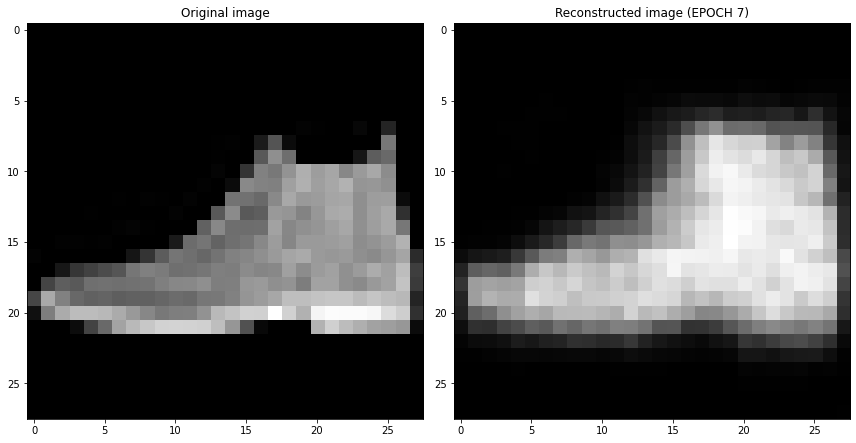

EPOCH 8/10

partial train loss (single batch): 0.029297

partial train loss (single batch): 0.026093

partial train loss (single batch): 0.027047

partial train loss (single batch): 0.030053

partial train loss (single batch): 0.027150

partial train loss (single batch): 0.029370

partial train loss (single batch): 0.028915

partial train loss (single batch): 0.026910

partial train loss (single batch): 0.027687

partial train loss (single batch): 0.028635

partial train loss (single batch): 0.029453

partial train loss (single batch): 0.030509

partial train loss (single batch): 0.027129

partial train loss (single batch): 0.027921

partial train loss (single batch): 0.027884

partial train loss (single batch): 0.029452

partial train loss (single batch): 0.028223

partial train loss (single batch): 0.027221

partial train loss (single batch): 0.027673

partial train loss (single batch): 0.028773

partial train loss (single batch): 0.026654

partial train loss (single batch): 0.028311

partial train loss (single batch): 0.028042

partial train loss (single batch): 0.029080

partial train loss (single batch): 0.026204

partial train loss (single batch): 0.027398

partial train loss (single batch): 0.028780

partial train loss (single batch): 0.027848

partial train loss (single batch): 0.026937

partial train loss (single batch): 0.029732

partial train loss (single batch): 0.029648

partial train loss (single batch): 0.028375

partial train loss (single batch): 0.028580

partial train loss (single batch): 0.027703

partial train loss (single batch): 0.028943

partial train loss (single batch): 0.028413

partial train loss (single batch): 0.027918

partial train loss (single batch): 0.027691

partial train loss (single batch): 0.029276

partial train loss (single batch): 0.027515

partial train loss (single batch): 0.028500

partial train loss (single batch): 0.028207

partial train loss (single batch): 0.026050

partial train loss (single batch): 0.029185

partial train loss (single batch): 0.027957

partial train loss (single batch): 0.028328

partial train loss (single batch): 0.028682

partial train loss (single batch): 0.027597

partial train loss (single batch): 0.027399

partial train loss (single batch): 0.028012

partial train loss (single batch): 0.027656

partial train loss (single batch): 0.027821

partial train loss (single batch): 0.027340

partial train loss (single batch): 0.028592

partial train loss (single batch): 0.028411

partial train loss (single batch): 0.027422

partial train loss (single batch): 0.027571

partial train loss (single batch): 0.027500

partial train loss (single batch): 0.026747

partial train loss (single batch): 0.027794

partial train loss (single batch): 0.028238

partial train loss (single batch): 0.028352

partial train loss (single batch): 0.028130

partial train loss (single batch): 0.027355

partial train loss (single batch): 0.028645

partial train loss (single batch): 0.027880

partial train loss (single batch): 0.027166

partial train loss (single batch): 0.028023

partial train loss (single batch): 0.028162

partial train loss (single batch): 0.027546

partial train loss (single batch): 0.028352

partial train loss (single batch): 0.028447

partial train loss (single batch): 0.028201

partial train loss (single batch): 0.027715

partial train loss (single batch): 0.028696

partial train loss (single batch): 0.028901

partial train loss (single batch): 0.027226

partial train loss (single batch): 0.029243

partial train loss (single batch): 0.029188

partial train loss (single batch): 0.027210

partial train loss (single batch): 0.028254

partial train loss (single batch): 0.029134

partial train loss (single batch): 0.029211

partial train loss (single batch): 0.028025

partial train loss (single batch): 0.027474

partial train loss (single batch): 0.027698

partial train loss (single batch): 0.026998

partial train loss (single batch): 0.027835

partial train loss (single batch): 0.026880

partial train loss (single batch): 0.027703

partial train loss (single batch): 0.028795

partial train loss (single batch): 0.028023

partial train loss (single batch): 0.028383

partial train loss (single batch): 0.027414

partial train loss (single batch): 0.027172

partial train loss (single batch): 0.026919

partial train loss (single batch): 0.027831

partial train loss (single batch): 0.028594

partial train loss (single batch): 0.028791

partial train loss (single batch): 0.028359

partial train loss (single batch): 0.027628

partial train loss (single batch): 0.028662

partial train loss (single batch): 0.028374

partial train loss (single batch): 0.027439

partial train loss (single batch): 0.026575

partial train loss (single batch): 0.027798

partial train loss (single batch): 0.026224

partial train loss (single batch): 0.027530

partial train loss (single batch): 0.026820

partial train loss (single batch): 0.025503

partial train loss (single batch): 0.028862

partial train loss (single batch): 0.028219

partial train loss (single batch): 0.027205

partial train loss (single batch): 0.028720

partial train loss (single batch): 0.026206

partial train loss (single batch): 0.026889

partial train loss (single batch): 0.027425

partial train loss (single batch): 0.027335

partial train loss (single batch): 0.028186

partial train loss (single batch): 0.028212

partial train loss (single batch): 0.028010

partial train loss (single batch): 0.028497

partial train loss (single batch): 0.027031

partial train loss (single batch): 0.029071

partial train loss (single batch): 0.026405

partial train loss (single batch): 0.029035

partial train loss (single batch): 0.028753

partial train loss (single batch): 0.028889

partial train loss (single batch): 0.027734

partial train loss (single batch): 0.028026

partial train loss (single batch): 0.026132

partial train loss (single batch): 0.028503

partial train loss (single batch): 0.028614

partial train loss (single batch): 0.027888

partial train loss (single batch): 0.027891

partial train loss (single batch): 0.027388

partial train loss (single batch): 0.029314

partial train loss (single batch): 0.026706

partial train loss (single batch): 0.028750

partial train loss (single batch): 0.027591

partial train loss (single batch): 0.029890

partial train loss (single batch): 0.025463

partial train loss (single batch): 0.026913

partial train loss (single batch): 0.027023

partial train loss (single batch): 0.027533

partial train loss (single batch): 0.028377

partial train loss (single batch): 0.029070

partial train loss (single batch): 0.029478

partial train loss (single batch): 0.028715

partial train loss (single batch): 0.027423

partial train loss (single batch): 0.027647

partial train loss (single batch): 0.027724

partial train loss (single batch): 0.028543

partial train loss (single batch): 0.028194

partial train loss (single batch): 0.027930

partial train loss (single batch): 0.028209

partial train loss (single batch): 0.026595

partial train loss (single batch): 0.028112

partial train loss (single batch): 0.028047

partial train loss (single batch): 0.026250

partial train loss (single batch): 0.028034

partial train loss (single batch): 0.027356

partial train loss (single batch): 0.027986

partial train loss (single batch): 0.026851

partial train loss (single batch): 0.027840

partial train loss (single batch): 0.028047

partial train loss (single batch): 0.027740

partial train loss (single batch): 0.028111

partial train loss (single batch): 0.027131

partial train loss (single batch): 0.027343

partial train loss (single batch): 0.027056

partial train loss (single batch): 0.028878

partial train loss (single batch): 0.026550

partial train loss (single batch): 0.027902

partial train loss (single batch): 0.026874

partial train loss (single batch): 0.029110

partial train loss (single batch): 0.026742

partial train loss (single batch): 0.027414

partial train loss (single batch): 0.028202

partial train loss (single batch): 0.028111

partial train loss (single batch): 0.027119

partial train loss (single batch): 0.026947

partial train loss (single batch): 0.027937

partial train loss (single batch): 0.028282

partial train loss (single batch): 0.027065

partial train loss (single batch): 0.025711

partial train loss (single batch): 0.027579

partial train loss (single batch): 0.027510

partial train loss (single batch): 0.027194

partial train loss (single batch): 0.025592

partial train loss (single batch): 0.027404

partial train loss (single batch): 0.027839

partial train loss (single batch): 0.027300

partial train loss (single batch): 0.027419

partial train loss (single batch): 0.029218

partial train loss (single batch): 0.028485

partial train loss (single batch): 0.029867

partial train loss (single batch): 0.027406

partial train loss (single batch): 0.028303

partial train loss (single batch): 0.026802

partial train loss (single batch): 0.028255

partial train loss (single batch): 0.028466

partial train loss (single batch): 0.026743

partial train loss (single batch): 0.027186

partial train loss (single batch): 0.025904

partial train loss (single batch): 0.027481

partial train loss (single batch): 0.026770

partial train loss (single batch): 0.026320

partial train loss (single batch): 0.027829

partial train loss (single batch): 0.027611

partial train loss (single batch): 0.027608

partial train loss (single batch): 0.028301

partial train loss (single batch): 0.027637

partial train loss (single batch): 0.026745

partial train loss (single batch): 0.026257

partial train loss (single batch): 0.025303

partial train loss (single batch): 0.027689

partial train loss (single batch): 0.026962

partial train loss (single batch): 0.026777

partial train loss (single batch): 0.026738

partial train loss (single batch): 0.029231

partial train loss (single batch): 0.026731

partial train loss (single batch): 0.027943

partial train loss (single batch): 0.028417

partial train loss (single batch): 0.027201

partial train loss (single batch): 0.028908

partial train loss (single batch): 0.026094

partial train loss (single batch): 0.026602

partial train loss (single batch): 0.026920

partial train loss (single batch): 0.027321

partial train loss (single batch): 0.027743

partial train loss (single batch): 0.028090

partial train loss (single batch): 0.028627

partial train loss (single batch): 0.027956

partial train loss (single batch): 0.027294

VALIDATION - EPOCH 8/10 - loss: 0.027653

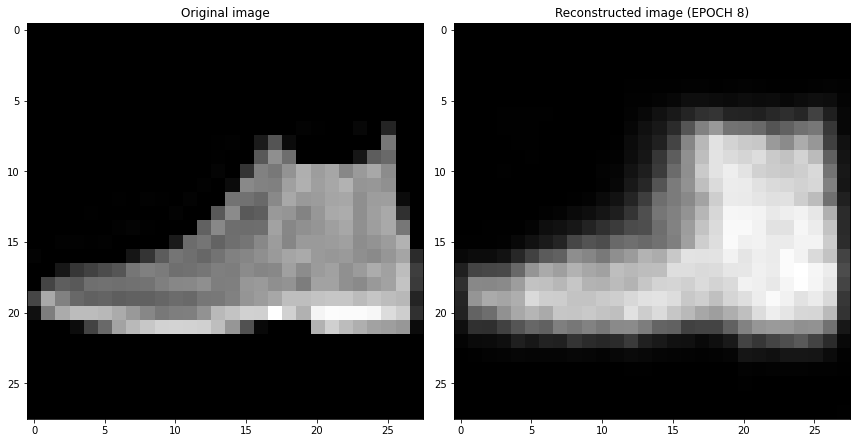

EPOCH 9/10

partial train loss (single batch): 0.025576

partial train loss (single batch): 0.026815

partial train loss (single batch): 0.026793

partial train loss (single batch): 0.027174

partial train loss (single batch): 0.027192

partial train loss (single batch): 0.028692

partial train loss (single batch): 0.026433

partial train loss (single batch): 0.026041

partial train loss (single batch): 0.027776

partial train loss (single batch): 0.028484

partial train loss (single batch): 0.029953

partial train loss (single batch): 0.027322

partial train loss (single batch): 0.027351

partial train loss (single batch): 0.028632

partial train loss (single batch): 0.028603

partial train loss (single batch): 0.028201

partial train loss (single batch): 0.026552

partial train loss (single batch): 0.026547

partial train loss (single batch): 0.027750

partial train loss (single batch): 0.028146

partial train loss (single batch): 0.027409

partial train loss (single batch): 0.026115

partial train loss (single batch): 0.028004

partial train loss (single batch): 0.026884

partial train loss (single batch): 0.027449

partial train loss (single batch): 0.028295

partial train loss (single batch): 0.027313

partial train loss (single batch): 0.027246

partial train loss (single batch): 0.027282

partial train loss (single batch): 0.029065

partial train loss (single batch): 0.027985

partial train loss (single batch): 0.029030

partial train loss (single batch): 0.027940

partial train loss (single batch): 0.027779

partial train loss (single batch): 0.026831

partial train loss (single batch): 0.028352

partial train loss (single batch): 0.026502

partial train loss (single batch): 0.028395

partial train loss (single batch): 0.028322

partial train loss (single batch): 0.027016

partial train loss (single batch): 0.026722

partial train loss (single batch): 0.027761

partial train loss (single batch): 0.026401

partial train loss (single batch): 0.027823

partial train loss (single batch): 0.028672

partial train loss (single batch): 0.025864

partial train loss (single batch): 0.027172

partial train loss (single batch): 0.027215

partial train loss (single batch): 0.025748

partial train loss (single batch): 0.027314

partial train loss (single batch): 0.028392

partial train loss (single batch): 0.026369

partial train loss (single batch): 0.027914

partial train loss (single batch): 0.026798

partial train loss (single batch): 0.027353

partial train loss (single batch): 0.026827

partial train loss (single batch): 0.029618

partial train loss (single batch): 0.026392

partial train loss (single batch): 0.026931

partial train loss (single batch): 0.026785

partial train loss (single batch): 0.027461

partial train loss (single batch): 0.027187

partial train loss (single batch): 0.027729

partial train loss (single batch): 0.028301

partial train loss (single batch): 0.027836

partial train loss (single batch): 0.027007

partial train loss (single batch): 0.028217

partial train loss (single batch): 0.027320

partial train loss (single batch): 0.027604

partial train loss (single batch): 0.026267

partial train loss (single batch): 0.026644

partial train loss (single batch): 0.026502

partial train loss (single batch): 0.026226

partial train loss (single batch): 0.027765

partial train loss (single batch): 0.027054

partial train loss (single batch): 0.026399

partial train loss (single batch): 0.028640

partial train loss (single batch): 0.027192

partial train loss (single batch): 0.027819

partial train loss (single batch): 0.025997

partial train loss (single batch): 0.026913

partial train loss (single batch): 0.026419

partial train loss (single batch): 0.026200

partial train loss (single batch): 0.026663

partial train loss (single batch): 0.027120

partial train loss (single batch): 0.026254

partial train loss (single batch): 0.028962

partial train loss (single batch): 0.026999

partial train loss (single batch): 0.028405

partial train loss (single batch): 0.027841

partial train loss (single batch): 0.027592

partial train loss (single batch): 0.026412

partial train loss (single batch): 0.027498

partial train loss (single batch): 0.028004

partial train loss (single batch): 0.027328

partial train loss (single batch): 0.028191

partial train loss (single batch): 0.027821

partial train loss (single batch): 0.027938

partial train loss (single batch): 0.026722

partial train loss (single batch): 0.025985

partial train loss (single batch): 0.026784

partial train loss (single batch): 0.029818

partial train loss (single batch): 0.027482

partial train loss (single batch): 0.026820

partial train loss (single batch): 0.026650

partial train loss (single batch): 0.026593

partial train loss (single batch): 0.027922

partial train loss (single batch): 0.028411

partial train loss (single batch): 0.028021

partial train loss (single batch): 0.026671

partial train loss (single batch): 0.027155

partial train loss (single batch): 0.027812

partial train loss (single batch): 0.028797

partial train loss (single batch): 0.028392

partial train loss (single batch): 0.027663

partial train loss (single batch): 0.027732

partial train loss (single batch): 0.027875

partial train loss (single batch): 0.026932

partial train loss (single batch): 0.027089

partial train loss (single batch): 0.026252

partial train loss (single batch): 0.027040

partial train loss (single batch): 0.028182

partial train loss (single batch): 0.027733

partial train loss (single batch): 0.026718

partial train loss (single batch): 0.028632

partial train loss (single batch): 0.027563

partial train loss (single batch): 0.026824

partial train loss (single batch): 0.027978

partial train loss (single batch): 0.028597

partial train loss (single batch): 0.027292

partial train loss (single batch): 0.028446

partial train loss (single batch): 0.026170

partial train loss (single batch): 0.026698

partial train loss (single batch): 0.027429

partial train loss (single batch): 0.026432

partial train loss (single batch): 0.026698

partial train loss (single batch): 0.026727

partial train loss (single batch): 0.024645

partial train loss (single batch): 0.026442

partial train loss (single batch): 0.026543

partial train loss (single batch): 0.026207

partial train loss (single batch): 0.027967

partial train loss (single batch): 0.026683

partial train loss (single batch): 0.026716

partial train loss (single batch): 0.027602

partial train loss (single batch): 0.027433

partial train loss (single batch): 0.026776

partial train loss (single batch): 0.027690

partial train loss (single batch): 0.026679

partial train loss (single batch): 0.028578

partial train loss (single batch): 0.027857

partial train loss (single batch): 0.027295

partial train loss (single batch): 0.027422

partial train loss (single batch): 0.028927

partial train loss (single batch): 0.028188

partial train loss (single batch): 0.026251

partial train loss (single batch): 0.026494

partial train loss (single batch): 0.027181

partial train loss (single batch): 0.026991

partial train loss (single batch): 0.026864

partial train loss (single batch): 0.028655

partial train loss (single batch): 0.026216

partial train loss (single batch): 0.029434

partial train loss (single batch): 0.028616

partial train loss (single batch): 0.027006

partial train loss (single batch): 0.027530

partial train loss (single batch): 0.025389

partial train loss (single batch): 0.027233

partial train loss (single batch): 0.025414

partial train loss (single batch): 0.027971

partial train loss (single batch): 0.027346

partial train loss (single batch): 0.028916

partial train loss (single batch): 0.027316

partial train loss (single batch): 0.027343

partial train loss (single batch): 0.028176

partial train loss (single batch): 0.026658

partial train loss (single batch): 0.028045

partial train loss (single batch): 0.027575

partial train loss (single batch): 0.027419

partial train loss (single batch): 0.027368

partial train loss (single batch): 0.027794

partial train loss (single batch): 0.027009

partial train loss (single batch): 0.026628

partial train loss (single batch): 0.026708

partial train loss (single batch): 0.026723

partial train loss (single batch): 0.029336

partial train loss (single batch): 0.027294

partial train loss (single batch): 0.027130

partial train loss (single batch): 0.027755

partial train loss (single batch): 0.026336

partial train loss (single batch): 0.027541

partial train loss (single batch): 0.026755

partial train loss (single batch): 0.029388

partial train loss (single batch): 0.025898

partial train loss (single batch): 0.026623

partial train loss (single batch): 0.028311

partial train loss (single batch): 0.026608

partial train loss (single batch): 0.027208

partial train loss (single batch): 0.026320

partial train loss (single batch): 0.027864

partial train loss (single batch): 0.026691

partial train loss (single batch): 0.028014

partial train loss (single batch): 0.025862

partial train loss (single batch): 0.026863

partial train loss (single batch): 0.027233

partial train loss (single batch): 0.026137

partial train loss (single batch): 0.024859

partial train loss (single batch): 0.028656

partial train loss (single batch): 0.027560

partial train loss (single batch): 0.027271

partial train loss (single batch): 0.027209

partial train loss (single batch): 0.026370

partial train loss (single batch): 0.027614

partial train loss (single batch): 0.027260

partial train loss (single batch): 0.027495

partial train loss (single batch): 0.028871

partial train loss (single batch): 0.027077

partial train loss (single batch): 0.026435

partial train loss (single batch): 0.026721

partial train loss (single batch): 0.026646

partial train loss (single batch): 0.025867

partial train loss (single batch): 0.024927

partial train loss (single batch): 0.026743

partial train loss (single batch): 0.027542

partial train loss (single batch): 0.026305

partial train loss (single batch): 0.026680

partial train loss (single batch): 0.028937

partial train loss (single batch): 0.028078

partial train loss (single batch): 0.025961

partial train loss (single batch): 0.026933

partial train loss (single batch): 0.026822

partial train loss (single batch): 0.025689

partial train loss (single batch): 0.026858

partial train loss (single batch): 0.024758

partial train loss (single batch): 0.029018

VALIDATION - EPOCH 9/10 - loss: 0.027064

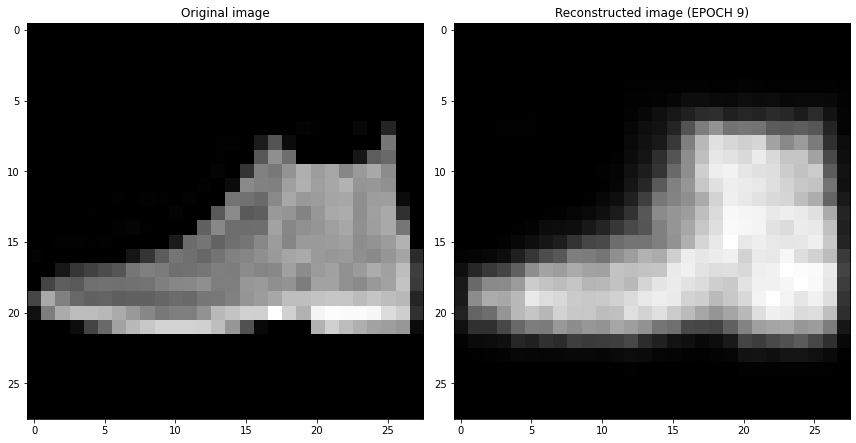

EPOCH 10/10

partial train loss (single batch): 0.026032

partial train loss (single batch): 0.027770

partial train loss (single batch): 0.028335

partial train loss (single batch): 0.026417

partial train loss (single batch): 0.026325

partial train loss (single batch): 0.028247

partial train loss (single batch): 0.026698

partial train loss (single batch): 0.026853

partial train loss (single batch): 0.025966

partial train loss (single batch): 0.025794

partial train loss (single batch): 0.026682

partial train loss (single batch): 0.027371

partial train loss (single batch): 0.027588

partial train loss (single batch): 0.026997

partial train loss (single batch): 0.025486

partial train loss (single batch): 0.026584

partial train loss (single batch): 0.027040

partial train loss (single batch): 0.027630

partial train loss (single batch): 0.027089

partial train loss (single batch): 0.026472

partial train loss (single batch): 0.026876

partial train loss (single batch): 0.028157

partial train loss (single batch): 0.027451

partial train loss (single batch): 0.026048

partial train loss (single batch): 0.026318

partial train loss (single batch): 0.027384

partial train loss (single batch): 0.028005

partial train loss (single batch): 0.028567

partial train loss (single batch): 0.025315

partial train loss (single batch): 0.026887

partial train loss (single batch): 0.027836

partial train loss (single batch): 0.025938

partial train loss (single batch): 0.026426

partial train loss (single batch): 0.025985

partial train loss (single batch): 0.026583

partial train loss (single batch): 0.026342

partial train loss (single batch): 0.026491

partial train loss (single batch): 0.027641

partial train loss (single batch): 0.026216

partial train loss (single batch): 0.027052

partial train loss (single batch): 0.026430

partial train loss (single batch): 0.026836

partial train loss (single batch): 0.025603

partial train loss (single batch): 0.027201

partial train loss (single batch): 0.027462

partial train loss (single batch): 0.027978

partial train loss (single batch): 0.026236

partial train loss (single batch): 0.028597

partial train loss (single batch): 0.026183

partial train loss (single batch): 0.027510

partial train loss (single batch): 0.026823

partial train loss (single batch): 0.026167

partial train loss (single batch): 0.026851

partial train loss (single batch): 0.026666

partial train loss (single batch): 0.027510

partial train loss (single batch): 0.026721

partial train loss (single batch): 0.026692

partial train loss (single batch): 0.027488

partial train loss (single batch): 0.024971

partial train loss (single batch): 0.028177

partial train loss (single batch): 0.027587

partial train loss (single batch): 0.027486

partial train loss (single batch): 0.027137

partial train loss (single batch): 0.025491

partial train loss (single batch): 0.025822

partial train loss (single batch): 0.027408

partial train loss (single batch): 0.028057

partial train loss (single batch): 0.025287

partial train loss (single batch): 0.026288

partial train loss (single batch): 0.028109

partial train loss (single batch): 0.026410

partial train loss (single batch): 0.025876

partial train loss (single batch): 0.028046

partial train loss (single batch): 0.027172

partial train loss (single batch): 0.027269

partial train loss (single batch): 0.027500

partial train loss (single batch): 0.027254

partial train loss (single batch): 0.027430

partial train loss (single batch): 0.025740

partial train loss (single batch): 0.025979

partial train loss (single batch): 0.025517

partial train loss (single batch): 0.026829

partial train loss (single batch): 0.026972

partial train loss (single batch): 0.028190

partial train loss (single batch): 0.027437

partial train loss (single batch): 0.026952

partial train loss (single batch): 0.028037

partial train loss (single batch): 0.026825

partial train loss (single batch): 0.027154

partial train loss (single batch): 0.028380

partial train loss (single batch): 0.026467

partial train loss (single batch): 0.026609

partial train loss (single batch): 0.026438

partial train loss (single batch): 0.025820

partial train loss (single batch): 0.027014

partial train loss (single batch): 0.026994

partial train loss (single batch): 0.028064

partial train loss (single batch): 0.025645

partial train loss (single batch): 0.027770

partial train loss (single batch): 0.027585

partial train loss (single batch): 0.026746

partial train loss (single batch): 0.025829

partial train loss (single batch): 0.026297

partial train loss (single batch): 0.027230

partial train loss (single batch): 0.026809

partial train loss (single batch): 0.027523

partial train loss (single batch): 0.027806

partial train loss (single batch): 0.026781

partial train loss (single batch): 0.026866

partial train loss (single batch): 0.028291

partial train loss (single batch): 0.025939

partial train loss (single batch): 0.026467

partial train loss (single batch): 0.026201

partial train loss (single batch): 0.027283

partial train loss (single batch): 0.026747

partial train loss (single batch): 0.026660

partial train loss (single batch): 0.026130

partial train loss (single batch): 0.027777

partial train loss (single batch): 0.026150

partial train loss (single batch): 0.025161

partial train loss (single batch): 0.027013

partial train loss (single batch): 0.027238

partial train loss (single batch): 0.026809

partial train loss (single batch): 0.027118

partial train loss (single batch): 0.026929

partial train loss (single batch): 0.027865

partial train loss (single batch): 0.027821

partial train loss (single batch): 0.026896

partial train loss (single batch): 0.027820

partial train loss (single batch): 0.025106

partial train loss (single batch): 0.028743

partial train loss (single batch): 0.026625

partial train loss (single batch): 0.028598

partial train loss (single batch): 0.027327

partial train loss (single batch): 0.027373

partial train loss (single batch): 0.025734

partial train loss (single batch): 0.027409

partial train loss (single batch): 0.026303

partial train loss (single batch): 0.025519

partial train loss (single batch): 0.027767

partial train loss (single batch): 0.027535

partial train loss (single batch): 0.028292

partial train loss (single batch): 0.027098

partial train loss (single batch): 0.025675

partial train loss (single batch): 0.025790

partial train loss (single batch): 0.026219

partial train loss (single batch): 0.027263

partial train loss (single batch): 0.025538

partial train loss (single batch): 0.028534

partial train loss (single batch): 0.026354

partial train loss (single batch): 0.026995

partial train loss (single batch): 0.027543

partial train loss (single batch): 0.027137

partial train loss (single batch): 0.026122

partial train loss (single batch): 0.025191

partial train loss (single batch): 0.026307

partial train loss (single batch): 0.026152

partial train loss (single batch): 0.026180

partial train loss (single batch): 0.026820

partial train loss (single batch): 0.026448

partial train loss (single batch): 0.026124

partial train loss (single batch): 0.028184

partial train loss (single batch): 0.027000

partial train loss (single batch): 0.027441

partial train loss (single batch): 0.026316

partial train loss (single batch): 0.027011

partial train loss (single batch): 0.026942

partial train loss (single batch): 0.027392

partial train loss (single batch): 0.027189

partial train loss (single batch): 0.025842

partial train loss (single batch): 0.024646

partial train loss (single batch): 0.028029

partial train loss (single batch): 0.030251

partial train loss (single batch): 0.028167

partial train loss (single batch): 0.025487

partial train loss (single batch): 0.025488

partial train loss (single batch): 0.027256

partial train loss (single batch): 0.027376

partial train loss (single batch): 0.025751

partial train loss (single batch): 0.027114

partial train loss (single batch): 0.026693

partial train loss (single batch): 0.025650

partial train loss (single batch): 0.026337

partial train loss (single batch): 0.026213

partial train loss (single batch): 0.027871

partial train loss (single batch): 0.026591

partial train loss (single batch): 0.025861

partial train loss (single batch): 0.027306

partial train loss (single batch): 0.026220

partial train loss (single batch): 0.026259

partial train loss (single batch): 0.027007

partial train loss (single batch): 0.025640

partial train loss (single batch): 0.026484

partial train loss (single batch): 0.027916

partial train loss (single batch): 0.026518

partial train loss (single batch): 0.027349

partial train loss (single batch): 0.028116

partial train loss (single batch): 0.027413

partial train loss (single batch): 0.027929

partial train loss (single batch): 0.027139

partial train loss (single batch): 0.026889

partial train loss (single batch): 0.026555

partial train loss (single batch): 0.026352

partial train loss (single batch): 0.027580

partial train loss (single batch): 0.026253

partial train loss (single batch): 0.027573

partial train loss (single batch): 0.025808

partial train loss (single batch): 0.025649

partial train loss (single batch): 0.026468

partial train loss (single batch): 0.025691

partial train loss (single batch): 0.026214

partial train loss (single batch): 0.025699

partial train loss (single batch): 0.026386

partial train loss (single batch): 0.026831

partial train loss (single batch): 0.025989

partial train loss (single batch): 0.026033

partial train loss (single batch): 0.026333

partial train loss (single batch): 0.029508

partial train loss (single batch): 0.026945

partial train loss (single batch): 0.026882

partial train loss (single batch): 0.027455

partial train loss (single batch): 0.027088

partial train loss (single batch): 0.024179

partial train loss (single batch): 0.025496

partial train loss (single batch): 0.029441

partial train loss (single batch): 0.027157

partial train loss (single batch): 0.027135

partial train loss (single batch): 0.025120

partial train loss (single batch): 0.027488

partial train loss (single batch): 0.027480

partial train loss (single batch): 0.026054

partial train loss (single batch): 0.025677

partial train loss (single batch): 0.026887

partial train loss (single batch): 0.027097

partial train loss (single batch): 0.025258

VALIDATION - EPOCH 10/10 - loss: 0.026851

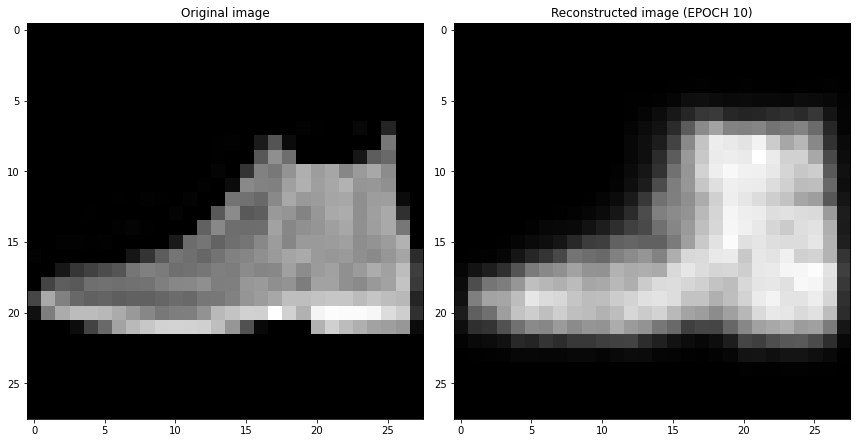

In [ ]:
### Training cycle
num_epochs = 10
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
    ### Validation  (use the testing function)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

    ### Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs('autoencoder_progress_%d_features' % encoded_space_dim, exist_ok=True)
    fig.savefig('autoencoder_progress_%d_features/epoch_%d.jpg' % (encoded_space_dim, epoch + 1))
    plt.show()
    plt.close()

    # Save network parameters
    torch.save(encoder.state_dict(), 'encoder_params.pth')
    torch.save(decoder.state_dict(), 'decoder_params.pth')

# Network Analysis

# Net params reloader

In [ ]:
# Load network parameters
encoder.load_state_dict(torch.load('encoder_params.pth'))
decoder.load_state_dict(torch.load('decoder_params.pth'))

<All keys matched successfully>

### Get the encoded representation of the test samples

In [ ]:
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:08<00:00, 1215.13it/s]


### Converting the results to pandas df:

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,label
0,-32.032452,34.163731,15.523401,9
1,-12.024965,-11.050427,-49.988487,2
2,16.115583,-52.735600,0.642657,1
3,12.018243,-41.821838,12.896399,1
4,0.307872,-3.732992,-15.444021,6
...,...,...,...,...
9995,-22.895277,42.433151,-6.473969,9
9996,6.063692,-28.011778,17.512119,1
9997,-22.510090,-28.130472,7.749954,8
9998,1.155480,-61.025471,11.863786,1


In [ ]:
px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

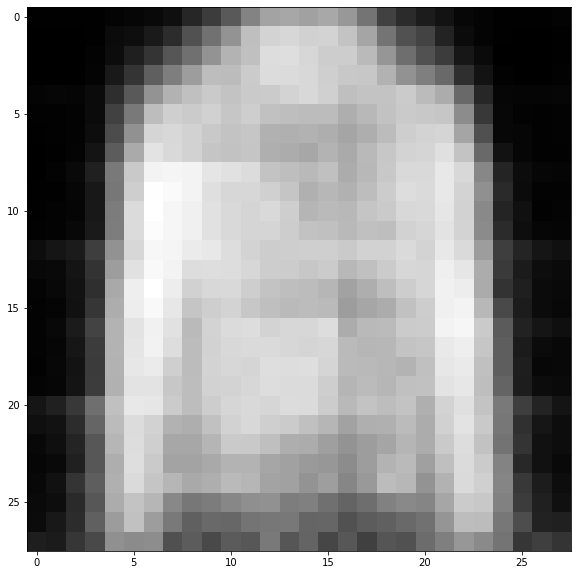

In [ ]:
if encoded_space_dim == 3:
    # Generate a custom sample
    custom_encoded_sample = [-6, -6.0, -11.1]
    encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)

    # Decode sample
    decoder.eval()
    with torch.no_grad():
        generated_img  = decoder(encoded_value)

    plt.figure(figsize=(12,10))
    plt.imshow(generated_img.squeeze().cpu().numpy(), cmap='gist_gray')
    plt.show()

## Further insights on PCA and t-SNE

### Set the random seed for reproducible results

Selected device: cuda

EPOCH 1/10

partial train loss (single batch): 0.156353

partial train loss (single batch): 0.153081

partial train loss (single batch): 0.159899

partial train loss (single batch): 0.154812

partial train loss (single batch): 0.154009

partial train loss (single batch): 0.155490

partial train loss (single batch): 0.158357

partial train loss (single batch): 0.157132

partial train loss (single batch): 0.152889

partial train loss (single batch): 0.153200

partial train loss (single batch): 0.154373

partial train loss (single batch): 0.151713

partial train loss (single batch): 0.155306

partial train loss (single batch): 0.156411

partial train loss (single batch): 0.158013

partial train loss (single batch): 0.156560

partial train loss (single batch): 0.153698

partial train loss (single batch): 0.154544

partial train loss (single batch): 0.156481

partial train loss (single batch): 0.151485

partial train loss (single batch): 0.158702

partial train loss (single batch): 0.153544

partial train loss (single batch): 0.151487

partial train loss (single batch): 0.151904

partial train loss (single batch): 0.149912

partial train loss (single batch): 0.156104

partial train loss (single batch): 0.155057

partial train loss (single batch): 0.150419

partial train loss (single batch): 0.152369

partial train loss (single batch): 0.148465

partial train loss (single batch): 0.151766

partial train loss (single batch): 0.151686

partial train loss (single batch): 0.152356

partial train loss (single batch): 0.154438

partial train loss (single batch): 0.152641

partial train loss (single batch): 0.148483

partial train loss (single batch): 0.147391

partial train loss (single batch): 0.147522

partial train loss (single batch): 0.148050

partial train loss (single batch): 0.144955

partial train loss (single batch): 0.146036

partial train loss (single batch): 0.147478

partial train loss (single batch): 0.145866

partial train loss (single batch): 0.144475

partial train loss (single batch): 0.143115

partial train loss (single batch): 0.140827

partial train loss (single batch): 0.141042

partial train loss (single batch): 0.142430

partial train loss (single batch): 0.137137

partial train loss (single batch): 0.138878

partial train loss (single batch): 0.136764

partial train loss (single batch): 0.137164

partial train loss (single batch): 0.132073

partial train loss (single batch): 0.132750

partial train loss (single batch): 0.130489

partial train loss (single batch): 0.129804

partial train loss (single batch): 0.129397

partial train loss (single batch): 0.129353

partial train loss (single batch): 0.120536

partial train loss (single batch): 0.121403

partial train loss (single batch): 0.118662

partial train loss (single batch): 0.120977

partial train loss (single batch): 0.116624

partial train loss (single batch): 0.118642

partial train loss (single batch): 0.113133

partial train loss (single batch): 0.110406

partial train loss (single batch): 0.114849

partial train loss (single batch): 0.113457

partial train loss (single batch): 0.110677

partial train loss (single batch): 0.109074

partial train loss (single batch): 0.107238

partial train loss (single batch): 0.111825

partial train loss (single batch): 0.103084

partial train loss (single batch): 0.101791

partial train loss (single batch): 0.103060

partial train loss (single batch): 0.104850

partial train loss (single batch): 0.107152

partial train loss (single batch): 0.104436

partial train loss (single batch): 0.101593

partial train loss (single batch): 0.103883

partial train loss (single batch): 0.099780

partial train loss (single batch): 0.101824

partial train loss (single batch): 0.102091

partial train loss (single batch): 0.097945

partial train loss (single batch): 0.100104

partial train loss (single batch): 0.103754

partial train loss (single batch): 0.097061

partial train loss (single batch): 0.100027

partial train loss (single batch): 0.100548

partial train loss (single batch): 0.099671

partial train loss (single batch): 0.098136

partial train loss (single batch): 0.096457

partial train loss (single batch): 0.098197

partial train loss (single batch): 0.097204

partial train loss (single batch): 0.096222

partial train loss (single batch): 0.096257

partial train loss (single batch): 0.096480

partial train loss (single batch): 0.095963

partial train loss (single batch): 0.092259

partial train loss (single batch): 0.095914

partial train loss (single batch): 0.096701

partial train loss (single batch): 0.094781

partial train loss (single batch): 0.093560

partial train loss (single batch): 0.093629

partial train loss (single batch): 0.091562

partial train loss (single batch): 0.093942

partial train loss (single batch): 0.091750

partial train loss (single batch): 0.092797

partial train loss (single batch): 0.096837

partial train loss (single batch): 0.095410

partial train loss (single batch): 0.093465

partial train loss (single batch): 0.095953

partial train loss (single batch): 0.091648

partial train loss (single batch): 0.091625

partial train loss (single batch): 0.092000

partial train loss (single batch): 0.090441

partial train loss (single batch): 0.090578

partial train loss (single batch): 0.093270

partial train loss (single batch): 0.091517

partial train loss (single batch): 0.092535

partial train loss (single batch): 0.090932

partial train loss (single batch): 0.089771

partial train loss (single batch): 0.092892

partial train loss (single batch): 0.089636

partial train loss (single batch): 0.090461

partial train loss (single batch): 0.089518

partial train loss (single batch): 0.092575

partial train loss (single batch): 0.090667

partial train loss (single batch): 0.093183

partial train loss (single batch): 0.087113

partial train loss (single batch): 0.084718

partial train loss (single batch): 0.086902

partial train loss (single batch): 0.090935

partial train loss (single batch): 0.088596

partial train loss (single batch): 0.090651

partial train loss (single batch): 0.091978

partial train loss (single batch): 0.086929

partial train loss (single batch): 0.088727

partial train loss (single batch): 0.089029

partial train loss (single batch): 0.089962

partial train loss (single batch): 0.089524

partial train loss (single batch): 0.085568

partial train loss (single batch): 0.088809

partial train loss (single batch): 0.087528

partial train loss (single batch): 0.089089

partial train loss (single batch): 0.086230

partial train loss (single batch): 0.087716

partial train loss (single batch): 0.083273

partial train loss (single batch): 0.087143

partial train loss (single batch): 0.085443

partial train loss (single batch): 0.086719

partial train loss (single batch): 0.092984

partial train loss (single batch): 0.084765

partial train loss (single batch): 0.088981

partial train loss (single batch): 0.087381

partial train loss (single batch): 0.087522

partial train loss (single batch): 0.086913

partial train loss (single batch): 0.084426

partial train loss (single batch): 0.085339

partial train loss (single batch): 0.086731

partial train loss (single batch): 0.087387

partial train loss (single batch): 0.090720

partial train loss (single batch): 0.084128

partial train loss (single batch): 0.086243

partial train loss (single batch): 0.083669

partial train loss (single batch): 0.085276

partial train loss (single batch): 0.087230

partial train loss (single batch): 0.085554

partial train loss (single batch): 0.080049

partial train loss (single batch): 0.083712

partial train loss (single batch): 0.085508

partial train loss (single batch): 0.087174

partial train loss (single batch): 0.085024

partial train loss (single batch): 0.084018

partial train loss (single batch): 0.085518

partial train loss (single batch): 0.083900

partial train loss (single batch): 0.083793

partial train loss (single batch): 0.084890

partial train loss (single batch): 0.080661

partial train loss (single batch): 0.083824

partial train loss (single batch): 0.079649

partial train loss (single batch): 0.080090

partial train loss (single batch): 0.079903

partial train loss (single batch): 0.079256

partial train loss (single batch): 0.082072

partial train loss (single batch): 0.078092

partial train loss (single batch): 0.074725

partial train loss (single batch): 0.076577

partial train loss (single batch): 0.072397

partial train loss (single batch): 0.075156

partial train loss (single batch): 0.072770

partial train loss (single batch): 0.072791

partial train loss (single batch): 0.074412

partial train loss (single batch): 0.068747

partial train loss (single batch): 0.071982

partial train loss (single batch): 0.071053

partial train loss (single batch): 0.070948

partial train loss (single batch): 0.067270

partial train loss (single batch): 0.064963

partial train loss (single batch): 0.065918

partial train loss (single batch): 0.069129

partial train loss (single batch): 0.063943

partial train loss (single batch): 0.067326

partial train loss (single batch): 0.063717

partial train loss (single batch): 0.062775

partial train loss (single batch): 0.063398

partial train loss (single batch): 0.062466

partial train loss (single batch): 0.061242

partial train loss (single batch): 0.058553

partial train loss (single batch): 0.058959

partial train loss (single batch): 0.058464

partial train loss (single batch): 0.056701

partial train loss (single batch): 0.055381

partial train loss (single batch): 0.055367

partial train loss (single batch): 0.053705

partial train loss (single batch): 0.056478

partial train loss (single batch): 0.052974

partial train loss (single batch): 0.052564

partial train loss (single batch): 0.052320

partial train loss (single batch): 0.052947

partial train loss (single batch): 0.050440

partial train loss (single batch): 0.052094

partial train loss (single batch): 0.052129

partial train loss (single batch): 0.050736

partial train loss (single batch): 0.051780

partial train loss (single batch): 0.047784

partial train loss (single batch): 0.051748

partial train loss (single batch): 0.048555

partial train loss (single batch): 0.048134

partial train loss (single batch): 0.046624

partial train loss (single batch): 0.048272

partial train loss (single batch): 0.048653

partial train loss (single batch): 0.048040

partial train loss (single batch): 0.048236

partial train loss (single batch): 0.048300

VALIDATION - EPOCH 1/10 - loss: 0.047572

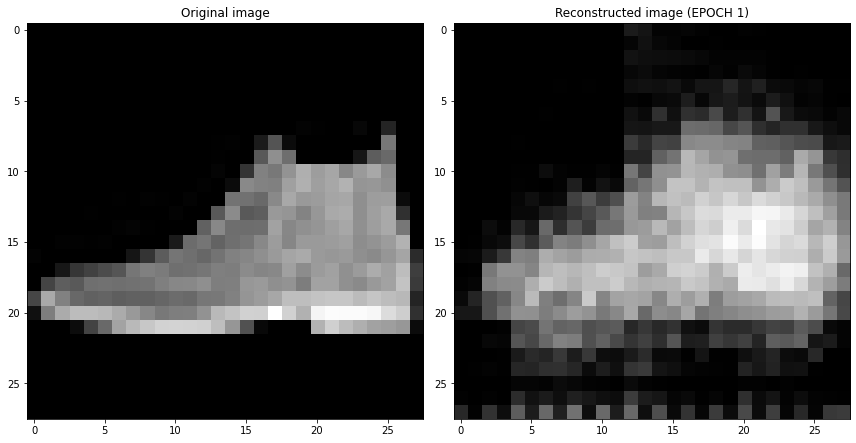

EPOCH 2/10

partial train loss (single batch): 0.046376

partial train loss (single batch): 0.046363

partial train loss (single batch): 0.047116

partial train loss (single batch): 0.046344

partial train loss (single batch): 0.047938

partial train loss (single batch): 0.045553

partial train loss (single batch): 0.046042

partial train loss (single batch): 0.046545

partial train loss (single batch): 0.045318

partial train loss (single batch): 0.046411

partial train loss (single batch): 0.045340

partial train loss (single batch): 0.045480

partial train loss (single batch): 0.047224

partial train loss (single batch): 0.045085

partial train loss (single batch): 0.045579

partial train loss (single batch): 0.044675

partial train loss (single batch): 0.045168

partial train loss (single batch): 0.045002

partial train loss (single batch): 0.045031

partial train loss (single batch): 0.047214

partial train loss (single batch): 0.044006

partial train loss (single batch): 0.044388

partial train loss (single batch): 0.046187

partial train loss (single batch): 0.044447

partial train loss (single batch): 0.043904

partial train loss (single batch): 0.045250

partial train loss (single batch): 0.041835

partial train loss (single batch): 0.043253

partial train loss (single batch): 0.042214

partial train loss (single batch): 0.046112

partial train loss (single batch): 0.042390

partial train loss (single batch): 0.043805

partial train loss (single batch): 0.046364

partial train loss (single batch): 0.042780

partial train loss (single batch): 0.043786

partial train loss (single batch): 0.041694

partial train loss (single batch): 0.042297

partial train loss (single batch): 0.041850

partial train loss (single batch): 0.041820

partial train loss (single batch): 0.042427

partial train loss (single batch): 0.043920

partial train loss (single batch): 0.042838

partial train loss (single batch): 0.042285

partial train loss (single batch): 0.042445

partial train loss (single batch): 0.041643

partial train loss (single batch): 0.041670

partial train loss (single batch): 0.041717

partial train loss (single batch): 0.043001

partial train loss (single batch): 0.042232

partial train loss (single batch): 0.041197

partial train loss (single batch): 0.042250

partial train loss (single batch): 0.042024

partial train loss (single batch): 0.041863

partial train loss (single batch): 0.044028

partial train loss (single batch): 0.042130

partial train loss (single batch): 0.043762

partial train loss (single batch): 0.041857

partial train loss (single batch): 0.041118

partial train loss (single batch): 0.042562

partial train loss (single batch): 0.037073

partial train loss (single batch): 0.042198

partial train loss (single batch): 0.038617

partial train loss (single batch): 0.041504

partial train loss (single batch): 0.039685

partial train loss (single batch): 0.041752

partial train loss (single batch): 0.040053

partial train loss (single batch): 0.040820

partial train loss (single batch): 0.040823

partial train loss (single batch): 0.039942

partial train loss (single batch): 0.040636

partial train loss (single batch): 0.042539

partial train loss (single batch): 0.039291

partial train loss (single batch): 0.040727

partial train loss (single batch): 0.037935

partial train loss (single batch): 0.039281

partial train loss (single batch): 0.040322

partial train loss (single batch): 0.039466

partial train loss (single batch): 0.040078

partial train loss (single batch): 0.040062

partial train loss (single batch): 0.040873

partial train loss (single batch): 0.041712

partial train loss (single batch): 0.038162

partial train loss (single batch): 0.040844

partial train loss (single batch): 0.038965

partial train loss (single batch): 0.039765

partial train loss (single batch): 0.039564

partial train loss (single batch): 0.041748

partial train loss (single batch): 0.038192

partial train loss (single batch): 0.040077

partial train loss (single batch): 0.038527

partial train loss (single batch): 0.040554

partial train loss (single batch): 0.039970

partial train loss (single batch): 0.038127

partial train loss (single batch): 0.039128

partial train loss (single batch): 0.037180

partial train loss (single batch): 0.038894

partial train loss (single batch): 0.038420

partial train loss (single batch): 0.039279

partial train loss (single batch): 0.037857

partial train loss (single batch): 0.039609

partial train loss (single batch): 0.039570

partial train loss (single batch): 0.040023

partial train loss (single batch): 0.037045

partial train loss (single batch): 0.037447

partial train loss (single batch): 0.038159

partial train loss (single batch): 0.039647

partial train loss (single batch): 0.037402

partial train loss (single batch): 0.038130

partial train loss (single batch): 0.038418

partial train loss (single batch): 0.039731

partial train loss (single batch): 0.039471

partial train loss (single batch): 0.040022

partial train loss (single batch): 0.039014

partial train loss (single batch): 0.040366

partial train loss (single batch): 0.038062

partial train loss (single batch): 0.037485

partial train loss (single batch): 0.039803

partial train loss (single batch): 0.040675

partial train loss (single batch): 0.038080

partial train loss (single batch): 0.038592

partial train loss (single batch): 0.037473

partial train loss (single batch): 0.038604

partial train loss (single batch): 0.035767

partial train loss (single batch): 0.036276

partial train loss (single batch): 0.037924

partial train loss (single batch): 0.036645

partial train loss (single batch): 0.036402

partial train loss (single batch): 0.036301

partial train loss (single batch): 0.037233

partial train loss (single batch): 0.036851

partial train loss (single batch): 0.036119

partial train loss (single batch): 0.038541

partial train loss (single batch): 0.037152

partial train loss (single batch): 0.036765

partial train loss (single batch): 0.035760

partial train loss (single batch): 0.037865

partial train loss (single batch): 0.036821

partial train loss (single batch): 0.035940

partial train loss (single batch): 0.037403

partial train loss (single batch): 0.038547

partial train loss (single batch): 0.037120

partial train loss (single batch): 0.037163

partial train loss (single batch): 0.037421

partial train loss (single batch): 0.035692

partial train loss (single batch): 0.037699

partial train loss (single batch): 0.035307

partial train loss (single batch): 0.035967

partial train loss (single batch): 0.035113

partial train loss (single batch): 0.035623

partial train loss (single batch): 0.037199

partial train loss (single batch): 0.037977

partial train loss (single batch): 0.038283

partial train loss (single batch): 0.035918

partial train loss (single batch): 0.036603

partial train loss (single batch): 0.033952

partial train loss (single batch): 0.034969

partial train loss (single batch): 0.036836

partial train loss (single batch): 0.034961

partial train loss (single batch): 0.036118

partial train loss (single batch): 0.035957

partial train loss (single batch): 0.038440

partial train loss (single batch): 0.035174

partial train loss (single batch): 0.035466

partial train loss (single batch): 0.035143

partial train loss (single batch): 0.034715

partial train loss (single batch): 0.038033

partial train loss (single batch): 0.036399

partial train loss (single batch): 0.034859

partial train loss (single batch): 0.036644

partial train loss (single batch): 0.034949

partial train loss (single batch): 0.035900

partial train loss (single batch): 0.036052

partial train loss (single batch): 0.034487

partial train loss (single batch): 0.034349

partial train loss (single batch): 0.036798

partial train loss (single batch): 0.034398

partial train loss (single batch): 0.034838

partial train loss (single batch): 0.035373

partial train loss (single batch): 0.035066

partial train loss (single batch): 0.037074

partial train loss (single batch): 0.034424

partial train loss (single batch): 0.035966

partial train loss (single batch): 0.034580

partial train loss (single batch): 0.034666

partial train loss (single batch): 0.036961

partial train loss (single batch): 0.036781

partial train loss (single batch): 0.033205

partial train loss (single batch): 0.034032

partial train loss (single batch): 0.035197

partial train loss (single batch): 0.035031

partial train loss (single batch): 0.033098

partial train loss (single batch): 0.035018

partial train loss (single batch): 0.034744

partial train loss (single batch): 0.036936

partial train loss (single batch): 0.034958

partial train loss (single batch): 0.035006

partial train loss (single batch): 0.033585

partial train loss (single batch): 0.035739

partial train loss (single batch): 0.034274

partial train loss (single batch): 0.035602

partial train loss (single batch): 0.034994

partial train loss (single batch): 0.032893

partial train loss (single batch): 0.033215

partial train loss (single batch): 0.033563

partial train loss (single batch): 0.033758

partial train loss (single batch): 0.032859

partial train loss (single batch): 0.034795

partial train loss (single batch): 0.034195

partial train loss (single batch): 0.033531

partial train loss (single batch): 0.033991

partial train loss (single batch): 0.033657

partial train loss (single batch): 0.035875

partial train loss (single batch): 0.035403

partial train loss (single batch): 0.034460

partial train loss (single batch): 0.035101

partial train loss (single batch): 0.035546

partial train loss (single batch): 0.032872

partial train loss (single batch): 0.036288

partial train loss (single batch): 0.035509

partial train loss (single batch): 0.032614

partial train loss (single batch): 0.034363

partial train loss (single batch): 0.034341

partial train loss (single batch): 0.032391

partial train loss (single batch): 0.034488

partial train loss (single batch): 0.032935

partial train loss (single batch): 0.035456

partial train loss (single batch): 0.034649

partial train loss (single batch): 0.033571

partial train loss (single batch): 0.037169

partial train loss (single batch): 0.033786

partial train loss (single batch): 0.035751

partial train loss (single batch): 0.034059

partial train loss (single batch): 0.034356

partial train loss (single batch): 0.032591

partial train loss (single batch): 0.034055

VALIDATION - EPOCH 2/10 - loss: 0.033875

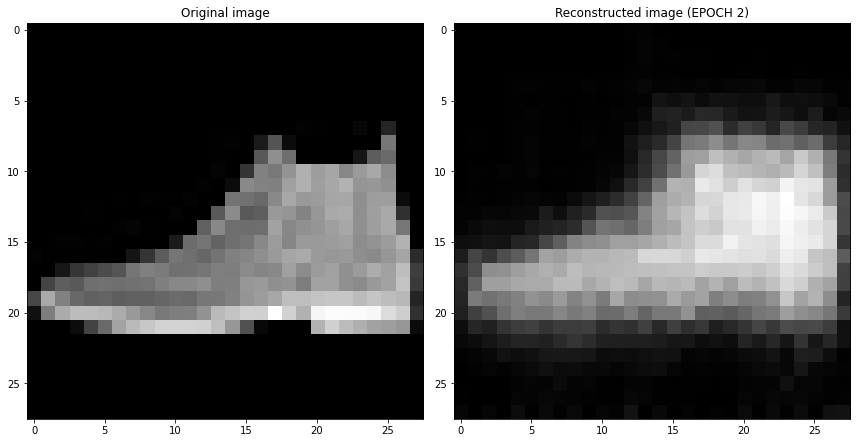

EPOCH 3/10

partial train loss (single batch): 0.032910

partial train loss (single batch): 0.035405

partial train loss (single batch): 0.033791

partial train loss (single batch): 0.033614

partial train loss (single batch): 0.035593

partial train loss (single batch): 0.032055

partial train loss (single batch): 0.034204

partial train loss (single batch): 0.033566

partial train loss (single batch): 0.035607

partial train loss (single batch): 0.034364

partial train loss (single batch): 0.033397

partial train loss (single batch): 0.033095

partial train loss (single batch): 0.030937

partial train loss (single batch): 0.035082

partial train loss (single batch): 0.031461

partial train loss (single batch): 0.035172

partial train loss (single batch): 0.033915

partial train loss (single batch): 0.034982

partial train loss (single batch): 0.033336

partial train loss (single batch): 0.035101

partial train loss (single batch): 0.032784

partial train loss (single batch): 0.032609

partial train loss (single batch): 0.031909

partial train loss (single batch): 0.034118

partial train loss (single batch): 0.032698

partial train loss (single batch): 0.032489

partial train loss (single batch): 0.033342

partial train loss (single batch): 0.032229

partial train loss (single batch): 0.033075

partial train loss (single batch): 0.032738

partial train loss (single batch): 0.034096

partial train loss (single batch): 0.033547

partial train loss (single batch): 0.031428

partial train loss (single batch): 0.034200

partial train loss (single batch): 0.033520

partial train loss (single batch): 0.033809

partial train loss (single batch): 0.033444

partial train loss (single batch): 0.033628

partial train loss (single batch): 0.033097

partial train loss (single batch): 0.032136

partial train loss (single batch): 0.032881

partial train loss (single batch): 0.033385

partial train loss (single batch): 0.033564

partial train loss (single batch): 0.032326

partial train loss (single batch): 0.033190

partial train loss (single batch): 0.031911

partial train loss (single batch): 0.032801

partial train loss (single batch): 0.032591

partial train loss (single batch): 0.033790

partial train loss (single batch): 0.032924

partial train loss (single batch): 0.031386

partial train loss (single batch): 0.033772

partial train loss (single batch): 0.032151

partial train loss (single batch): 0.033447

partial train loss (single batch): 0.032040

partial train loss (single batch): 0.034077

partial train loss (single batch): 0.036162

partial train loss (single batch): 0.034468

partial train loss (single batch): 0.033439

partial train loss (single batch): 0.034220

partial train loss (single batch): 0.033118

partial train loss (single batch): 0.032424

partial train loss (single batch): 0.033243

partial train loss (single batch): 0.032427

partial train loss (single batch): 0.031854

partial train loss (single batch): 0.034693

partial train loss (single batch): 0.033884

partial train loss (single batch): 0.032920

partial train loss (single batch): 0.033939

partial train loss (single batch): 0.032394

partial train loss (single batch): 0.033669

partial train loss (single batch): 0.034267

partial train loss (single batch): 0.030983

partial train loss (single batch): 0.032315

partial train loss (single batch): 0.031981

partial train loss (single batch): 0.032213

partial train loss (single batch): 0.032938

partial train loss (single batch): 0.033589

partial train loss (single batch): 0.033590

partial train loss (single batch): 0.031492

partial train loss (single batch): 0.033106

partial train loss (single batch): 0.031943

partial train loss (single batch): 0.032534

partial train loss (single batch): 0.031836

partial train loss (single batch): 0.031335

partial train loss (single batch): 0.032212

partial train loss (single batch): 0.033622

partial train loss (single batch): 0.031184

partial train loss (single batch): 0.033284

partial train loss (single batch): 0.032411

partial train loss (single batch): 0.033283

partial train loss (single batch): 0.031784

partial train loss (single batch): 0.033497

partial train loss (single batch): 0.031996

partial train loss (single batch): 0.031519

partial train loss (single batch): 0.032646

partial train loss (single batch): 0.033476

partial train loss (single batch): 0.032916

partial train loss (single batch): 0.034742

partial train loss (single batch): 0.028793

partial train loss (single batch): 0.032155

partial train loss (single batch): 0.032946

partial train loss (single batch): 0.033262

partial train loss (single batch): 0.033136

partial train loss (single batch): 0.032091

partial train loss (single batch): 0.031822

partial train loss (single batch): 0.032836

partial train loss (single batch): 0.032875

partial train loss (single batch): 0.032721

partial train loss (single batch): 0.033540

partial train loss (single batch): 0.033062

partial train loss (single batch): 0.034594

partial train loss (single batch): 0.033787

partial train loss (single batch): 0.032752

partial train loss (single batch): 0.032042

partial train loss (single batch): 0.032254

partial train loss (single batch): 0.034443

partial train loss (single batch): 0.032375

partial train loss (single batch): 0.033339

partial train loss (single batch): 0.032154

partial train loss (single batch): 0.032118

partial train loss (single batch): 0.032662

partial train loss (single batch): 0.032644

partial train loss (single batch): 0.031655

partial train loss (single batch): 0.032489

partial train loss (single batch): 0.030259

partial train loss (single batch): 0.032953

partial train loss (single batch): 0.033113

partial train loss (single batch): 0.031975

partial train loss (single batch): 0.032797

partial train loss (single batch): 0.032792

partial train loss (single batch): 0.031635

partial train loss (single batch): 0.032599

partial train loss (single batch): 0.030203

partial train loss (single batch): 0.032810

partial train loss (single batch): 0.031798

partial train loss (single batch): 0.032002

partial train loss (single batch): 0.032418

partial train loss (single batch): 0.032681

partial train loss (single batch): 0.032545

partial train loss (single batch): 0.030443

partial train loss (single batch): 0.032070

partial train loss (single batch): 0.031896

partial train loss (single batch): 0.031412

partial train loss (single batch): 0.031585

partial train loss (single batch): 0.031450

partial train loss (single batch): 0.033972

partial train loss (single batch): 0.031521

partial train loss (single batch): 0.031102

partial train loss (single batch): 0.033371

partial train loss (single batch): 0.032973

partial train loss (single batch): 0.029923

partial train loss (single batch): 0.032796

partial train loss (single batch): 0.030892

partial train loss (single batch): 0.031190

partial train loss (single batch): 0.031380

partial train loss (single batch): 0.031750

partial train loss (single batch): 0.033404

partial train loss (single batch): 0.033641

partial train loss (single batch): 0.031358

partial train loss (single batch): 0.031775

partial train loss (single batch): 0.032454

partial train loss (single batch): 0.032675

partial train loss (single batch): 0.031678

partial train loss (single batch): 0.032443

partial train loss (single batch): 0.033039

partial train loss (single batch): 0.031479

partial train loss (single batch): 0.030081

partial train loss (single batch): 0.031770

partial train loss (single batch): 0.032043

partial train loss (single batch): 0.033571

partial train loss (single batch): 0.029586

partial train loss (single batch): 0.030202

partial train loss (single batch): 0.030817

partial train loss (single batch): 0.032151

partial train loss (single batch): 0.031851

partial train loss (single batch): 0.031054

partial train loss (single batch): 0.031866

partial train loss (single batch): 0.033420

partial train loss (single batch): 0.033683

partial train loss (single batch): 0.033117

partial train loss (single batch): 0.031316

partial train loss (single batch): 0.032168

partial train loss (single batch): 0.029973

partial train loss (single batch): 0.032823

partial train loss (single batch): 0.033518

partial train loss (single batch): 0.031192

partial train loss (single batch): 0.033487

partial train loss (single batch): 0.031668

partial train loss (single batch): 0.031423

partial train loss (single batch): 0.033920

partial train loss (single batch): 0.032655

partial train loss (single batch): 0.031517

partial train loss (single batch): 0.032089

partial train loss (single batch): 0.032661

partial train loss (single batch): 0.032468

partial train loss (single batch): 0.030485

partial train loss (single batch): 0.032969

partial train loss (single batch): 0.032143

partial train loss (single batch): 0.031842

partial train loss (single batch): 0.031103

partial train loss (single batch): 0.031733

partial train loss (single batch): 0.032627

partial train loss (single batch): 0.032364

partial train loss (single batch): 0.032638

partial train loss (single batch): 0.031743

partial train loss (single batch): 0.031483

partial train loss (single batch): 0.029691

partial train loss (single batch): 0.030558

partial train loss (single batch): 0.031992

partial train loss (single batch): 0.031848

partial train loss (single batch): 0.031088

partial train loss (single batch): 0.032259

partial train loss (single batch): 0.032056

partial train loss (single batch): 0.032289

partial train loss (single batch): 0.031660

partial train loss (single batch): 0.031590

partial train loss (single batch): 0.032803

partial train loss (single batch): 0.028793

partial train loss (single batch): 0.032325

partial train loss (single batch): 0.031381

partial train loss (single batch): 0.031893

partial train loss (single batch): 0.031945

partial train loss (single batch): 0.031016

partial train loss (single batch): 0.032704

partial train loss (single batch): 0.032242

partial train loss (single batch): 0.031310

partial train loss (single batch): 0.031588

partial train loss (single batch): 0.031792

partial train loss (single batch): 0.032013

partial train loss (single batch): 0.030951

partial train loss (single batch): 0.031611

partial train loss (single batch): 0.028860

partial train loss (single batch): 0.031306

partial train loss (single batch): 0.035417

VALIDATION - EPOCH 3/10 - loss: 0.031492

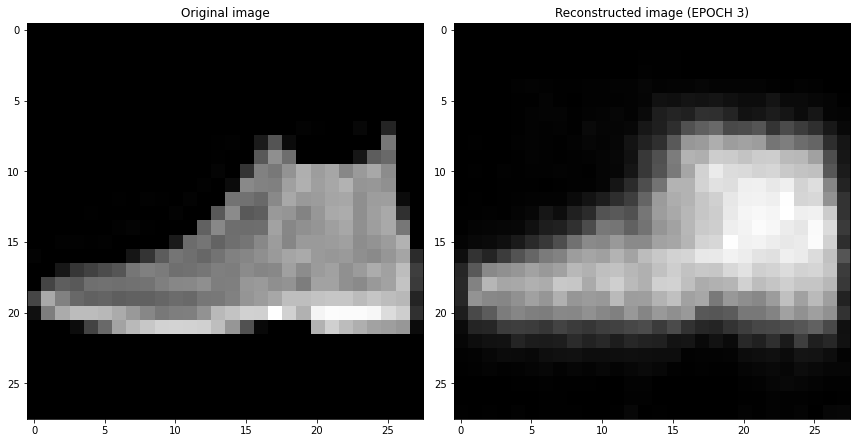

EPOCH 4/10

partial train loss (single batch): 0.033341

partial train loss (single batch): 0.032917

partial train loss (single batch): 0.030663

partial train loss (single batch): 0.031746

partial train loss (single batch): 0.031689

partial train loss (single batch): 0.029739

partial train loss (single batch): 0.032607

partial train loss (single batch): 0.033297

partial train loss (single batch): 0.030993

partial train loss (single batch): 0.030991

partial train loss (single batch): 0.030657

partial train loss (single batch): 0.030186

partial train loss (single batch): 0.031247

partial train loss (single batch): 0.030241

partial train loss (single batch): 0.030844

partial train loss (single batch): 0.031123

partial train loss (single batch): 0.030981

partial train loss (single batch): 0.031814

partial train loss (single batch): 0.032856

partial train loss (single batch): 0.032498

partial train loss (single batch): 0.031517

partial train loss (single batch): 0.030743

partial train loss (single batch): 0.031519

partial train loss (single batch): 0.032591

partial train loss (single batch): 0.032252

partial train loss (single batch): 0.031506

partial train loss (single batch): 0.032173

partial train loss (single batch): 0.032384

partial train loss (single batch): 0.029242

partial train loss (single batch): 0.029726

partial train loss (single batch): 0.031413

partial train loss (single batch): 0.032080

partial train loss (single batch): 0.030416

partial train loss (single batch): 0.031456

partial train loss (single batch): 0.031630

partial train loss (single batch): 0.033150

partial train loss (single batch): 0.030184

partial train loss (single batch): 0.032834

partial train loss (single batch): 0.030492

partial train loss (single batch): 0.029928

partial train loss (single batch): 0.031078

partial train loss (single batch): 0.031860

partial train loss (single batch): 0.031226

partial train loss (single batch): 0.031480

partial train loss (single batch): 0.032035

partial train loss (single batch): 0.030692

partial train loss (single batch): 0.029620

partial train loss (single batch): 0.032491

partial train loss (single batch): 0.030790

partial train loss (single batch): 0.031216

partial train loss (single batch): 0.029848

partial train loss (single batch): 0.031752

partial train loss (single batch): 0.032681

partial train loss (single batch): 0.030358

partial train loss (single batch): 0.030719

partial train loss (single batch): 0.030363

partial train loss (single batch): 0.030062

partial train loss (single batch): 0.030150

partial train loss (single batch): 0.030934

partial train loss (single batch): 0.029613

partial train loss (single batch): 0.029566

partial train loss (single batch): 0.030913

partial train loss (single batch): 0.029467

partial train loss (single batch): 0.031643

partial train loss (single batch): 0.031744

partial train loss (single batch): 0.030390

partial train loss (single batch): 0.030997

partial train loss (single batch): 0.032090

partial train loss (single batch): 0.030959

partial train loss (single batch): 0.030590

partial train loss (single batch): 0.031061

partial train loss (single batch): 0.029613

partial train loss (single batch): 0.030424

partial train loss (single batch): 0.029927

partial train loss (single batch): 0.029577

partial train loss (single batch): 0.029761

partial train loss (single batch): 0.032468

partial train loss (single batch): 0.031516

partial train loss (single batch): 0.029533

partial train loss (single batch): 0.032562

partial train loss (single batch): 0.032436

partial train loss (single batch): 0.029952

partial train loss (single batch): 0.031900

partial train loss (single batch): 0.030865

partial train loss (single batch): 0.030380

partial train loss (single batch): 0.030601

partial train loss (single batch): 0.031066

partial train loss (single batch): 0.030319

partial train loss (single batch): 0.032461

partial train loss (single batch): 0.029511

partial train loss (single batch): 0.030241

partial train loss (single batch): 0.031219

partial train loss (single batch): 0.028520

partial train loss (single batch): 0.030754

partial train loss (single batch): 0.031891

partial train loss (single batch): 0.030508

partial train loss (single batch): 0.031844

partial train loss (single batch): 0.031273

partial train loss (single batch): 0.031363

partial train loss (single batch): 0.031434

partial train loss (single batch): 0.028775

partial train loss (single batch): 0.030390

partial train loss (single batch): 0.031677

partial train loss (single batch): 0.029969

partial train loss (single batch): 0.031110

partial train loss (single batch): 0.029614

partial train loss (single batch): 0.030487

partial train loss (single batch): 0.031339

partial train loss (single batch): 0.030566

partial train loss (single batch): 0.030816

partial train loss (single batch): 0.029653

partial train loss (single batch): 0.031103

partial train loss (single batch): 0.032951

partial train loss (single batch): 0.032988

partial train loss (single batch): 0.028858

partial train loss (single batch): 0.028558

partial train loss (single batch): 0.032919

partial train loss (single batch): 0.031970

partial train loss (single batch): 0.032214

partial train loss (single batch): 0.030051

partial train loss (single batch): 0.031294

partial train loss (single batch): 0.031336

partial train loss (single batch): 0.030693

partial train loss (single batch): 0.029440

partial train loss (single batch): 0.030640

partial train loss (single batch): 0.030916

partial train loss (single batch): 0.028969

partial train loss (single batch): 0.030775

partial train loss (single batch): 0.028119

partial train loss (single batch): 0.030951

partial train loss (single batch): 0.031078

partial train loss (single batch): 0.032396

partial train loss (single batch): 0.030920

partial train loss (single batch): 0.030460

partial train loss (single batch): 0.030508

partial train loss (single batch): 0.029590

partial train loss (single batch): 0.031556

partial train loss (single batch): 0.028821

partial train loss (single batch): 0.030593

partial train loss (single batch): 0.030840

partial train loss (single batch): 0.029230

partial train loss (single batch): 0.028946

partial train loss (single batch): 0.030463

partial train loss (single batch): 0.031699

partial train loss (single batch): 0.030256

partial train loss (single batch): 0.030354

partial train loss (single batch): 0.029528

partial train loss (single batch): 0.032814

partial train loss (single batch): 0.029075

partial train loss (single batch): 0.030845

partial train loss (single batch): 0.030525

partial train loss (single batch): 0.031462

partial train loss (single batch): 0.028555

partial train loss (single batch): 0.030375

partial train loss (single batch): 0.030092

partial train loss (single batch): 0.030288

partial train loss (single batch): 0.030962

partial train loss (single batch): 0.029757

partial train loss (single batch): 0.030021

partial train loss (single batch): 0.030995

partial train loss (single batch): 0.030368

partial train loss (single batch): 0.031882

partial train loss (single batch): 0.029530

partial train loss (single batch): 0.032436

partial train loss (single batch): 0.029886

partial train loss (single batch): 0.028997

partial train loss (single batch): 0.029363

partial train loss (single batch): 0.029331

partial train loss (single batch): 0.030706

partial train loss (single batch): 0.029434

partial train loss (single batch): 0.029408

partial train loss (single batch): 0.030057

partial train loss (single batch): 0.030012

partial train loss (single batch): 0.031410

partial train loss (single batch): 0.028309

partial train loss (single batch): 0.030260

partial train loss (single batch): 0.028874

partial train loss (single batch): 0.029779

partial train loss (single batch): 0.030282

partial train loss (single batch): 0.029959

partial train loss (single batch): 0.029506

partial train loss (single batch): 0.029303

partial train loss (single batch): 0.030918

partial train loss (single batch): 0.028563

partial train loss (single batch): 0.030346

partial train loss (single batch): 0.029825

partial train loss (single batch): 0.030088

partial train loss (single batch): 0.027765

partial train loss (single batch): 0.029952

partial train loss (single batch): 0.033698

partial train loss (single batch): 0.029561

partial train loss (single batch): 0.031218

partial train loss (single batch): 0.030606

partial train loss (single batch): 0.032000

partial train loss (single batch): 0.029675

partial train loss (single batch): 0.030266

partial train loss (single batch): 0.030010

partial train loss (single batch): 0.029345

partial train loss (single batch): 0.029667

partial train loss (single batch): 0.029097

partial train loss (single batch): 0.030739

partial train loss (single batch): 0.031775

partial train loss (single batch): 0.030540

partial train loss (single batch): 0.030873

partial train loss (single batch): 0.032647

partial train loss (single batch): 0.031208

partial train loss (single batch): 0.029578

partial train loss (single batch): 0.030470

partial train loss (single batch): 0.030780

partial train loss (single batch): 0.029958

partial train loss (single batch): 0.031603

partial train loss (single batch): 0.031142

partial train loss (single batch): 0.029631

partial train loss (single batch): 0.028837

partial train loss (single batch): 0.032038

partial train loss (single batch): 0.031268

partial train loss (single batch): 0.030480

partial train loss (single batch): 0.029761

partial train loss (single batch): 0.031218

partial train loss (single batch): 0.031550

partial train loss (single batch): 0.030531

partial train loss (single batch): 0.031871

partial train loss (single batch): 0.031397

partial train loss (single batch): 0.032259

partial train loss (single batch): 0.029021

partial train loss (single batch): 0.029140

partial train loss (single batch): 0.031394

partial train loss (single batch): 0.031028

partial train loss (single batch): 0.031989

partial train loss (single batch): 0.031134

partial train loss (single batch): 0.032047

partial train loss (single batch): 0.027809

partial train loss (single batch): 0.030413

partial train loss (single batch): 0.030987

partial train loss (single batch): 0.029826

VALIDATION - EPOCH 4/10 - loss: 0.030267

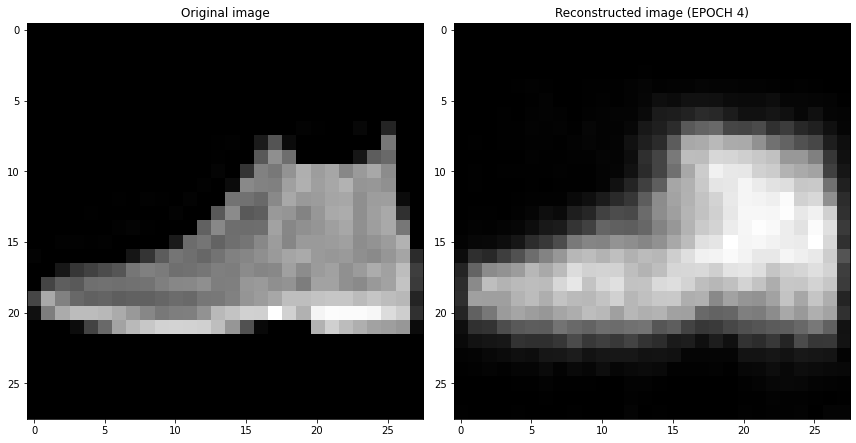

EPOCH 5/10

partial train loss (single batch): 0.030943

partial train loss (single batch): 0.029669

partial train loss (single batch): 0.029217

partial train loss (single batch): 0.029241

partial train loss (single batch): 0.030232

partial train loss (single batch): 0.031422

partial train loss (single batch): 0.028962

partial train loss (single batch): 0.030265

partial train loss (single batch): 0.030933

partial train loss (single batch): 0.029334

partial train loss (single batch): 0.029454

partial train loss (single batch): 0.030505

partial train loss (single batch): 0.030525

partial train loss (single batch): 0.030453

partial train loss (single batch): 0.029244

partial train loss (single batch): 0.030935

partial train loss (single batch): 0.030180

partial train loss (single batch): 0.031705

partial train loss (single batch): 0.030577

partial train loss (single batch): 0.029427

partial train loss (single batch): 0.030751

partial train loss (single batch): 0.029884

partial train loss (single batch): 0.029774

partial train loss (single batch): 0.030242

partial train loss (single batch): 0.029048

partial train loss (single batch): 0.029703

partial train loss (single batch): 0.029956

partial train loss (single batch): 0.031549

partial train loss (single batch): 0.030130

partial train loss (single batch): 0.030422

partial train loss (single batch): 0.027728

partial train loss (single batch): 0.028332

partial train loss (single batch): 0.028756

partial train loss (single batch): 0.030273

partial train loss (single batch): 0.028983

partial train loss (single batch): 0.029903

partial train loss (single batch): 0.030313

partial train loss (single batch): 0.028416

partial train loss (single batch): 0.028617

partial train loss (single batch): 0.032229

partial train loss (single batch): 0.030557

partial train loss (single batch): 0.030831

partial train loss (single batch): 0.029622

partial train loss (single batch): 0.032018

partial train loss (single batch): 0.030654

partial train loss (single batch): 0.029802

partial train loss (single batch): 0.029859

partial train loss (single batch): 0.028857

partial train loss (single batch): 0.029829

partial train loss (single batch): 0.029695

partial train loss (single batch): 0.029322

partial train loss (single batch): 0.029186

partial train loss (single batch): 0.030265

partial train loss (single batch): 0.029918

partial train loss (single batch): 0.030066

partial train loss (single batch): 0.030026

partial train loss (single batch): 0.028895

partial train loss (single batch): 0.028320

partial train loss (single batch): 0.029428

partial train loss (single batch): 0.030526

partial train loss (single batch): 0.028307

partial train loss (single batch): 0.030589

partial train loss (single batch): 0.030571

partial train loss (single batch): 0.030729

partial train loss (single batch): 0.029752

partial train loss (single batch): 0.030793

partial train loss (single batch): 0.030563

partial train loss (single batch): 0.030005

partial train loss (single batch): 0.029866

partial train loss (single batch): 0.029453

partial train loss (single batch): 0.030995

partial train loss (single batch): 0.030317

partial train loss (single batch): 0.029912

partial train loss (single batch): 0.029274

partial train loss (single batch): 0.030492

partial train loss (single batch): 0.029467

partial train loss (single batch): 0.030939

partial train loss (single batch): 0.030712

partial train loss (single batch): 0.029949

partial train loss (single batch): 0.029529

partial train loss (single batch): 0.029660

partial train loss (single batch): 0.028849

partial train loss (single batch): 0.029997

partial train loss (single batch): 0.030886

partial train loss (single batch): 0.030069

partial train loss (single batch): 0.028798

partial train loss (single batch): 0.030034

partial train loss (single batch): 0.031421

partial train loss (single batch): 0.030457

partial train loss (single batch): 0.030852

partial train loss (single batch): 0.030315

partial train loss (single batch): 0.030963

partial train loss (single batch): 0.030308

partial train loss (single batch): 0.029470

partial train loss (single batch): 0.029625

partial train loss (single batch): 0.030308

partial train loss (single batch): 0.028853

partial train loss (single batch): 0.030084

partial train loss (single batch): 0.029599

partial train loss (single batch): 0.030034

partial train loss (single batch): 0.028821

partial train loss (single batch): 0.028922

partial train loss (single batch): 0.028019

partial train loss (single batch): 0.030832

partial train loss (single batch): 0.031177

partial train loss (single batch): 0.029156

partial train loss (single batch): 0.030531

partial train loss (single batch): 0.030528

partial train loss (single batch): 0.028433

partial train loss (single batch): 0.029694

partial train loss (single batch): 0.029896

partial train loss (single batch): 0.028026

partial train loss (single batch): 0.032661

partial train loss (single batch): 0.029524

partial train loss (single batch): 0.028652

partial train loss (single batch): 0.029356

partial train loss (single batch): 0.029268

partial train loss (single batch): 0.028997

partial train loss (single batch): 0.030003

partial train loss (single batch): 0.029339

partial train loss (single batch): 0.030277

partial train loss (single batch): 0.029164

partial train loss (single batch): 0.028976

partial train loss (single batch): 0.028864

partial train loss (single batch): 0.027560

partial train loss (single batch): 0.028553

partial train loss (single batch): 0.029485

partial train loss (single batch): 0.028899

partial train loss (single batch): 0.030051

partial train loss (single batch): 0.028786

partial train loss (single batch): 0.029681

partial train loss (single batch): 0.030907

partial train loss (single batch): 0.030589

partial train loss (single batch): 0.032129

partial train loss (single batch): 0.030999

partial train loss (single batch): 0.030164

partial train loss (single batch): 0.028520

partial train loss (single batch): 0.028359

partial train loss (single batch): 0.031354

partial train loss (single batch): 0.030431

partial train loss (single batch): 0.030301

partial train loss (single batch): 0.029727

partial train loss (single batch): 0.029452

partial train loss (single batch): 0.028876

partial train loss (single batch): 0.028481

partial train loss (single batch): 0.030269

partial train loss (single batch): 0.031952

partial train loss (single batch): 0.030765

partial train loss (single batch): 0.028457

partial train loss (single batch): 0.029659

partial train loss (single batch): 0.030280

partial train loss (single batch): 0.027814

partial train loss (single batch): 0.029839

partial train loss (single batch): 0.028412

partial train loss (single batch): 0.030160

partial train loss (single batch): 0.031055

partial train loss (single batch): 0.027298

partial train loss (single batch): 0.029280

partial train loss (single batch): 0.031025

partial train loss (single batch): 0.030177

partial train loss (single batch): 0.029998

partial train loss (single batch): 0.029524

partial train loss (single batch): 0.029167

partial train loss (single batch): 0.027708

partial train loss (single batch): 0.030934

partial train loss (single batch): 0.029547

partial train loss (single batch): 0.029067

partial train loss (single batch): 0.029958

partial train loss (single batch): 0.028930

partial train loss (single batch): 0.028184

partial train loss (single batch): 0.027769

partial train loss (single batch): 0.027875

partial train loss (single batch): 0.028340

partial train loss (single batch): 0.028674

partial train loss (single batch): 0.030770

partial train loss (single batch): 0.029371

partial train loss (single batch): 0.029852

partial train loss (single batch): 0.030499

partial train loss (single batch): 0.029110

partial train loss (single batch): 0.028354

partial train loss (single batch): 0.028750

partial train loss (single batch): 0.029328

partial train loss (single batch): 0.028776

partial train loss (single batch): 0.029467

partial train loss (single batch): 0.028073

partial train loss (single batch): 0.027862

partial train loss (single batch): 0.029111

partial train loss (single batch): 0.027966

partial train loss (single batch): 0.029271

partial train loss (single batch): 0.029856

partial train loss (single batch): 0.028316

partial train loss (single batch): 0.030394

partial train loss (single batch): 0.029452

partial train loss (single batch): 0.030097

partial train loss (single batch): 0.030773

partial train loss (single batch): 0.028693

partial train loss (single batch): 0.027272

partial train loss (single batch): 0.028090

partial train loss (single batch): 0.028956

partial train loss (single batch): 0.029651

partial train loss (single batch): 0.030802

partial train loss (single batch): 0.028382

partial train loss (single batch): 0.028061

partial train loss (single batch): 0.030725

partial train loss (single batch): 0.028863

partial train loss (single batch): 0.030561

partial train loss (single batch): 0.028774

partial train loss (single batch): 0.031510

partial train loss (single batch): 0.028537

partial train loss (single batch): 0.029316

partial train loss (single batch): 0.027595

partial train loss (single batch): 0.030241

partial train loss (single batch): 0.030677

partial train loss (single batch): 0.029525

partial train loss (single batch): 0.029254

partial train loss (single batch): 0.028775

partial train loss (single batch): 0.028983

partial train loss (single batch): 0.030394

partial train loss (single batch): 0.029396

partial train loss (single batch): 0.029261

partial train loss (single batch): 0.029772

partial train loss (single batch): 0.029012

partial train loss (single batch): 0.028044

partial train loss (single batch): 0.028541

partial train loss (single batch): 0.028707

partial train loss (single batch): 0.030488

partial train loss (single batch): 0.029049

partial train loss (single batch): 0.027984

partial train loss (single batch): 0.029803

partial train loss (single batch): 0.030140

partial train loss (single batch): 0.028931

partial train loss (single batch): 0.028395

partial train loss (single batch): 0.029598

partial train loss (single batch): 0.029498

partial train loss (single batch): 0.031344

VALIDATION - EPOCH 5/10 - loss: 0.029194

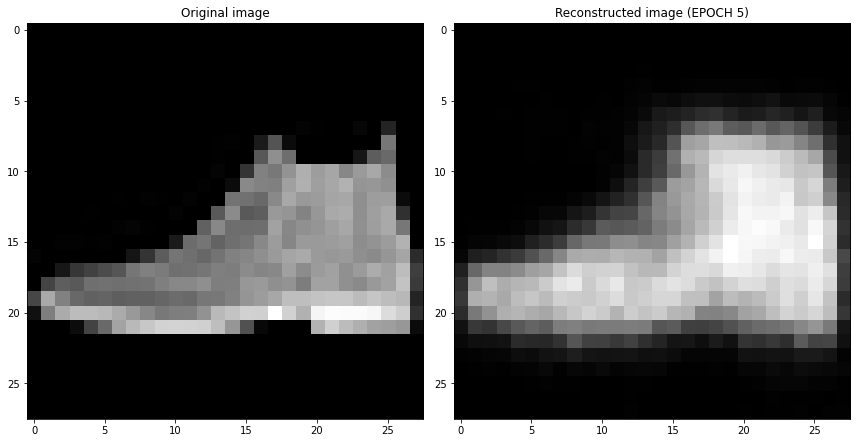

EPOCH 6/10

partial train loss (single batch): 0.029102

partial train loss (single batch): 0.030445

partial train loss (single batch): 0.030181

partial train loss (single batch): 0.028643

partial train loss (single batch): 0.029365

partial train loss (single batch): 0.030132

partial train loss (single batch): 0.029436

partial train loss (single batch): 0.029919

partial train loss (single batch): 0.030398

partial train loss (single batch): 0.029881

partial train loss (single batch): 0.029635

partial train loss (single batch): 0.027951

partial train loss (single batch): 0.027184

partial train loss (single batch): 0.027678

partial train loss (single batch): 0.028941

partial train loss (single batch): 0.029086

partial train loss (single batch): 0.029275

partial train loss (single batch): 0.028532

partial train loss (single batch): 0.029405

partial train loss (single batch): 0.030983

partial train loss (single batch): 0.030641

partial train loss (single batch): 0.030626

partial train loss (single batch): 0.030104

partial train loss (single batch): 0.029270

partial train loss (single batch): 0.030215

partial train loss (single batch): 0.028405

partial train loss (single batch): 0.031120

partial train loss (single batch): 0.027799

partial train loss (single batch): 0.028646

partial train loss (single batch): 0.030014

partial train loss (single batch): 0.029559

partial train loss (single batch): 0.030544

partial train loss (single batch): 0.029142

partial train loss (single batch): 0.029951

partial train loss (single batch): 0.028460

partial train loss (single batch): 0.030013

partial train loss (single batch): 0.029130

partial train loss (single batch): 0.027452

partial train loss (single batch): 0.028858

partial train loss (single batch): 0.029898

partial train loss (single batch): 0.030383

partial train loss (single batch): 0.030125

partial train loss (single batch): 0.028722

partial train loss (single batch): 0.029253

partial train loss (single batch): 0.029829

partial train loss (single batch): 0.028634

partial train loss (single batch): 0.028992

partial train loss (single batch): 0.028543

partial train loss (single batch): 0.027139

partial train loss (single batch): 0.027730

partial train loss (single batch): 0.027705

partial train loss (single batch): 0.028213

partial train loss (single batch): 0.029081

partial train loss (single batch): 0.027114

partial train loss (single batch): 0.029308

partial train loss (single batch): 0.028411

partial train loss (single batch): 0.029328

partial train loss (single batch): 0.031108

partial train loss (single batch): 0.029004

partial train loss (single batch): 0.027817

partial train loss (single batch): 0.029472

partial train loss (single batch): 0.028810

partial train loss (single batch): 0.027993

partial train loss (single batch): 0.027805

partial train loss (single batch): 0.027924

partial train loss (single batch): 0.028740

partial train loss (single batch): 0.029740

partial train loss (single batch): 0.027718

partial train loss (single batch): 0.029349

partial train loss (single batch): 0.028777

partial train loss (single batch): 0.028447

partial train loss (single batch): 0.028407

partial train loss (single batch): 0.029692

partial train loss (single batch): 0.028988

partial train loss (single batch): 0.028167

partial train loss (single batch): 0.030628

partial train loss (single batch): 0.029342

partial train loss (single batch): 0.028030

partial train loss (single batch): 0.030628

partial train loss (single batch): 0.028678

partial train loss (single batch): 0.029080

partial train loss (single batch): 0.027025

partial train loss (single batch): 0.028025

partial train loss (single batch): 0.029606

partial train loss (single batch): 0.028860

partial train loss (single batch): 0.027031

partial train loss (single batch): 0.029020

partial train loss (single batch): 0.029861

partial train loss (single batch): 0.028476

partial train loss (single batch): 0.029251

partial train loss (single batch): 0.028829

partial train loss (single batch): 0.028063

partial train loss (single batch): 0.029986

partial train loss (single batch): 0.029257

partial train loss (single batch): 0.028748

partial train loss (single batch): 0.031265

partial train loss (single batch): 0.028518

partial train loss (single batch): 0.030191

partial train loss (single batch): 0.028546

partial train loss (single batch): 0.028161

partial train loss (single batch): 0.027426

partial train loss (single batch): 0.026618

partial train loss (single batch): 0.028451

partial train loss (single batch): 0.028841

partial train loss (single batch): 0.028799

partial train loss (single batch): 0.029854

partial train loss (single batch): 0.029072

partial train loss (single batch): 0.030112

partial train loss (single batch): 0.028648

partial train loss (single batch): 0.029448

partial train loss (single batch): 0.028187

partial train loss (single batch): 0.028740

partial train loss (single batch): 0.029002

partial train loss (single batch): 0.028999

partial train loss (single batch): 0.027562

partial train loss (single batch): 0.028033

partial train loss (single batch): 0.029110

partial train loss (single batch): 0.029064

partial train loss (single batch): 0.029113

partial train loss (single batch): 0.029504

partial train loss (single batch): 0.029674

partial train loss (single batch): 0.028559

partial train loss (single batch): 0.028393

partial train loss (single batch): 0.029424

partial train loss (single batch): 0.027327

partial train loss (single batch): 0.029065

partial train loss (single batch): 0.027383

partial train loss (single batch): 0.029391

partial train loss (single batch): 0.027792

partial train loss (single batch): 0.029046

partial train loss (single batch): 0.028359

partial train loss (single batch): 0.028848

partial train loss (single batch): 0.027892

partial train loss (single batch): 0.027793

partial train loss (single batch): 0.029424

partial train loss (single batch): 0.028321

partial train loss (single batch): 0.028663

partial train loss (single batch): 0.029418

partial train loss (single batch): 0.028102

partial train loss (single batch): 0.030292

partial train loss (single batch): 0.028660

partial train loss (single batch): 0.029038

partial train loss (single batch): 0.027935

partial train loss (single batch): 0.027603

partial train loss (single batch): 0.030626

partial train loss (single batch): 0.028846

partial train loss (single batch): 0.028747

partial train loss (single batch): 0.028030

partial train loss (single batch): 0.028227

partial train loss (single batch): 0.027842

partial train loss (single batch): 0.028180

partial train loss (single batch): 0.029998

partial train loss (single batch): 0.029091

partial train loss (single batch): 0.029563

partial train loss (single batch): 0.028723

partial train loss (single batch): 0.029728

partial train loss (single batch): 0.027901

partial train loss (single batch): 0.028650

partial train loss (single batch): 0.028763

partial train loss (single batch): 0.028075

partial train loss (single batch): 0.030566

partial train loss (single batch): 0.029171

partial train loss (single batch): 0.029520

partial train loss (single batch): 0.027477

partial train loss (single batch): 0.027416

partial train loss (single batch): 0.027428

partial train loss (single batch): 0.028294

partial train loss (single batch): 0.027979

partial train loss (single batch): 0.030193

partial train loss (single batch): 0.028271

partial train loss (single batch): 0.026876

partial train loss (single batch): 0.028610

partial train loss (single batch): 0.027588

partial train loss (single batch): 0.028573

partial train loss (single batch): 0.030767

partial train loss (single batch): 0.027580

partial train loss (single batch): 0.029967

partial train loss (single batch): 0.028779

partial train loss (single batch): 0.029895

partial train loss (single batch): 0.028238

partial train loss (single batch): 0.029658

partial train loss (single batch): 0.028632

partial train loss (single batch): 0.027898

partial train loss (single batch): 0.028760

partial train loss (single batch): 0.028594

partial train loss (single batch): 0.027957

partial train loss (single batch): 0.028709

partial train loss (single batch): 0.028076

partial train loss (single batch): 0.028494

partial train loss (single batch): 0.028064

partial train loss (single batch): 0.027940

partial train loss (single batch): 0.028195

partial train loss (single batch): 0.025826

partial train loss (single batch): 0.029515

partial train loss (single batch): 0.028213

partial train loss (single batch): 0.028919

partial train loss (single batch): 0.028405

partial train loss (single batch): 0.028326

partial train loss (single batch): 0.027955

partial train loss (single batch): 0.028619

partial train loss (single batch): 0.027567

partial train loss (single batch): 0.028056

partial train loss (single batch): 0.030068

partial train loss (single batch): 0.027489

partial train loss (single batch): 0.027972

partial train loss (single batch): 0.030484

partial train loss (single batch): 0.027836

partial train loss (single batch): 0.027958

partial train loss (single batch): 0.028521

partial train loss (single batch): 0.029047

partial train loss (single batch): 0.031354

partial train loss (single batch): 0.027676

partial train loss (single batch): 0.030184

partial train loss (single batch): 0.030619

partial train loss (single batch): 0.028458

partial train loss (single batch): 0.027248

partial train loss (single batch): 0.029357

partial train loss (single batch): 0.028570

partial train loss (single batch): 0.029965

partial train loss (single batch): 0.027634

partial train loss (single batch): 0.030491

partial train loss (single batch): 0.028430

partial train loss (single batch): 0.028377

partial train loss (single batch): 0.027929

partial train loss (single batch): 0.028776

partial train loss (single batch): 0.028173

partial train loss (single batch): 0.027784

partial train loss (single batch): 0.028112

partial train loss (single batch): 0.029502

partial train loss (single batch): 0.028581

partial train loss (single batch): 0.029227

partial train loss (single batch): 0.029565

partial train loss (single batch): 0.027137

partial train loss (single batch): 0.027929

partial train loss (single batch): 0.030546

VALIDATION - EPOCH 6/10 - loss: 0.028388

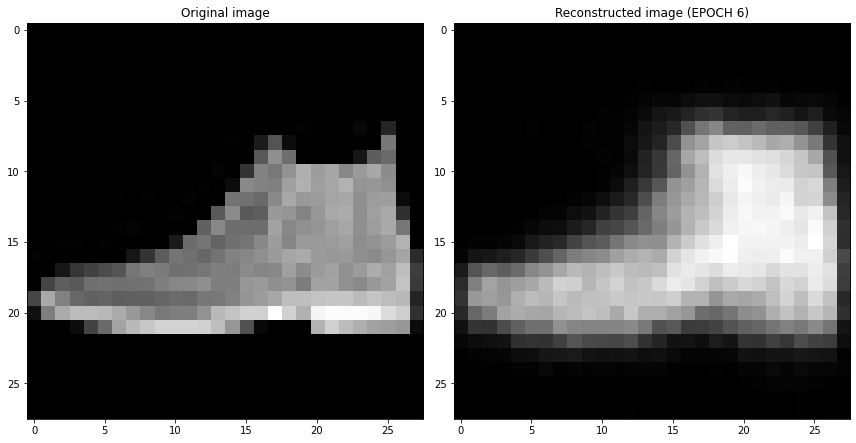

EPOCH 7/10

partial train loss (single batch): 0.028685

partial train loss (single batch): 0.028821

partial train loss (single batch): 0.029544

partial train loss (single batch): 0.027581

partial train loss (single batch): 0.028110

partial train loss (single batch): 0.027418

partial train loss (single batch): 0.028171

partial train loss (single batch): 0.029708

partial train loss (single batch): 0.028941

partial train loss (single batch): 0.027325

partial train loss (single batch): 0.028911

partial train loss (single batch): 0.025943

partial train loss (single batch): 0.029081

partial train loss (single batch): 0.029494

partial train loss (single batch): 0.027930

partial train loss (single batch): 0.028023

partial train loss (single batch): 0.029323

partial train loss (single batch): 0.028679

partial train loss (single batch): 0.028843

partial train loss (single batch): 0.027396

partial train loss (single batch): 0.030573

partial train loss (single batch): 0.027528

partial train loss (single batch): 0.028359

partial train loss (single batch): 0.029771

partial train loss (single batch): 0.029024

partial train loss (single batch): 0.028089

partial train loss (single batch): 0.028904

partial train loss (single batch): 0.028687

partial train loss (single batch): 0.028876

partial train loss (single batch): 0.028828

partial train loss (single batch): 0.026952

partial train loss (single batch): 0.029811

partial train loss (single batch): 0.029018

partial train loss (single batch): 0.029246

partial train loss (single batch): 0.028281

partial train loss (single batch): 0.028734

partial train loss (single batch): 0.029254

partial train loss (single batch): 0.029265

partial train loss (single batch): 0.027194

partial train loss (single batch): 0.029718

partial train loss (single batch): 0.028214

partial train loss (single batch): 0.027025

partial train loss (single batch): 0.028873

partial train loss (single batch): 0.027531

partial train loss (single batch): 0.027953

partial train loss (single batch): 0.028649

partial train loss (single batch): 0.028437

partial train loss (single batch): 0.029346

partial train loss (single batch): 0.030200

partial train loss (single batch): 0.028463

partial train loss (single batch): 0.027975

partial train loss (single batch): 0.027923

partial train loss (single batch): 0.026909

partial train loss (single batch): 0.027539

partial train loss (single batch): 0.027552

partial train loss (single batch): 0.027882

partial train loss (single batch): 0.028677

partial train loss (single batch): 0.027259

partial train loss (single batch): 0.027660

partial train loss (single batch): 0.027320

partial train loss (single batch): 0.027125

partial train loss (single batch): 0.027007

partial train loss (single batch): 0.027595

partial train loss (single batch): 0.026309

partial train loss (single batch): 0.026486

partial train loss (single batch): 0.030469

partial train loss (single batch): 0.026495

partial train loss (single batch): 0.030315

partial train loss (single batch): 0.028421

partial train loss (single batch): 0.029054

partial train loss (single batch): 0.027962

partial train loss (single batch): 0.027384

partial train loss (single batch): 0.027918

partial train loss (single batch): 0.029572

partial train loss (single batch): 0.026947

partial train loss (single batch): 0.026875

partial train loss (single batch): 0.029371

partial train loss (single batch): 0.027305

partial train loss (single batch): 0.028802

partial train loss (single batch): 0.028997

partial train loss (single batch): 0.029094

partial train loss (single batch): 0.026626

partial train loss (single batch): 0.029289

partial train loss (single batch): 0.028877

partial train loss (single batch): 0.028556

partial train loss (single batch): 0.027924

partial train loss (single batch): 0.029315

partial train loss (single batch): 0.028128

partial train loss (single batch): 0.027001

partial train loss (single batch): 0.028523

partial train loss (single batch): 0.029606

partial train loss (single batch): 0.028439

partial train loss (single batch): 0.026953

partial train loss (single batch): 0.027472

partial train loss (single batch): 0.028539

partial train loss (single batch): 0.029084

partial train loss (single batch): 0.031022

partial train loss (single batch): 0.030891

partial train loss (single batch): 0.029647

partial train loss (single batch): 0.030827

partial train loss (single batch): 0.029927

partial train loss (single batch): 0.026484

partial train loss (single batch): 0.027913

partial train loss (single batch): 0.027303

partial train loss (single batch): 0.029217

partial train loss (single batch): 0.027890

partial train loss (single batch): 0.026704

partial train loss (single batch): 0.029509

partial train loss (single batch): 0.029136

partial train loss (single batch): 0.029033

partial train loss (single batch): 0.028547

partial train loss (single batch): 0.028490

partial train loss (single batch): 0.027685

partial train loss (single batch): 0.029396

partial train loss (single batch): 0.029145

partial train loss (single batch): 0.028474

partial train loss (single batch): 0.028052

partial train loss (single batch): 0.029486

partial train loss (single batch): 0.028715

partial train loss (single batch): 0.024589

partial train loss (single batch): 0.028792

partial train loss (single batch): 0.026468

partial train loss (single batch): 0.029101

partial train loss (single batch): 0.030004

partial train loss (single batch): 0.026983

partial train loss (single batch): 0.028983

partial train loss (single batch): 0.028300

partial train loss (single batch): 0.026845

partial train loss (single batch): 0.030949

partial train loss (single batch): 0.030012

partial train loss (single batch): 0.026141

partial train loss (single batch): 0.028056

partial train loss (single batch): 0.027365

partial train loss (single batch): 0.028591

partial train loss (single batch): 0.027529

partial train loss (single batch): 0.027024

partial train loss (single batch): 0.026437

partial train loss (single batch): 0.028685

partial train loss (single batch): 0.026815

partial train loss (single batch): 0.028619

partial train loss (single batch): 0.027722

partial train loss (single batch): 0.027240

partial train loss (single batch): 0.027140

partial train loss (single batch): 0.027321

partial train loss (single batch): 0.027350

partial train loss (single batch): 0.027155

partial train loss (single batch): 0.029237

partial train loss (single batch): 0.027002

partial train loss (single batch): 0.026728

partial train loss (single batch): 0.028310

partial train loss (single batch): 0.027410

partial train loss (single batch): 0.028226

partial train loss (single batch): 0.029448

partial train loss (single batch): 0.026224

partial train loss (single batch): 0.028522

partial train loss (single batch): 0.030531

partial train loss (single batch): 0.028827

partial train loss (single batch): 0.028712

partial train loss (single batch): 0.026420

partial train loss (single batch): 0.027727

partial train loss (single batch): 0.027086

partial train loss (single batch): 0.027699

partial train loss (single batch): 0.027467

partial train loss (single batch): 0.028782

partial train loss (single batch): 0.027576

partial train loss (single batch): 0.027932

partial train loss (single batch): 0.028207

partial train loss (single batch): 0.027474

partial train loss (single batch): 0.028865

partial train loss (single batch): 0.027036

partial train loss (single batch): 0.027956

partial train loss (single batch): 0.027663

partial train loss (single batch): 0.026918

partial train loss (single batch): 0.027162

partial train loss (single batch): 0.027393

partial train loss (single batch): 0.027526

partial train loss (single batch): 0.028360

partial train loss (single batch): 0.024972

partial train loss (single batch): 0.027666

partial train loss (single batch): 0.027593

partial train loss (single batch): 0.027650

partial train loss (single batch): 0.026636

partial train loss (single batch): 0.027962

partial train loss (single batch): 0.029345

partial train loss (single batch): 0.027639

partial train loss (single batch): 0.029599

partial train loss (single batch): 0.028205

partial train loss (single batch): 0.027638

partial train loss (single batch): 0.028795

partial train loss (single batch): 0.027343

partial train loss (single batch): 0.026752

partial train loss (single batch): 0.029910

partial train loss (single batch): 0.027917

partial train loss (single batch): 0.027874

partial train loss (single batch): 0.028553

partial train loss (single batch): 0.028059

partial train loss (single batch): 0.025880

partial train loss (single batch): 0.028476

partial train loss (single batch): 0.028217

partial train loss (single batch): 0.028323

partial train loss (single batch): 0.027702

partial train loss (single batch): 0.027963

partial train loss (single batch): 0.029152

partial train loss (single batch): 0.028816

partial train loss (single batch): 0.028911

partial train loss (single batch): 0.028782

partial train loss (single batch): 0.028016

partial train loss (single batch): 0.027640

partial train loss (single batch): 0.027615

partial train loss (single batch): 0.027639

partial train loss (single batch): 0.026875

partial train loss (single batch): 0.026899

partial train loss (single batch): 0.026836

partial train loss (single batch): 0.028720

partial train loss (single batch): 0.027628

partial train loss (single batch): 0.027349

partial train loss (single batch): 0.027988

partial train loss (single batch): 0.027639

partial train loss (single batch): 0.027407

partial train loss (single batch): 0.028961

partial train loss (single batch): 0.030743

partial train loss (single batch): 0.028901

partial train loss (single batch): 0.029162

partial train loss (single batch): 0.028147

partial train loss (single batch): 0.027428

partial train loss (single batch): 0.027177

partial train loss (single batch): 0.028826

partial train loss (single batch): 0.027651

partial train loss (single batch): 0.027548

partial train loss (single batch): 0.027435

partial train loss (single batch): 0.028044

partial train loss (single batch): 0.027065

partial train loss (single batch): 0.028095

partial train loss (single batch): 0.028072

partial train loss (single batch): 0.026943

VALIDATION - EPOCH 7/10 - loss: 0.027863

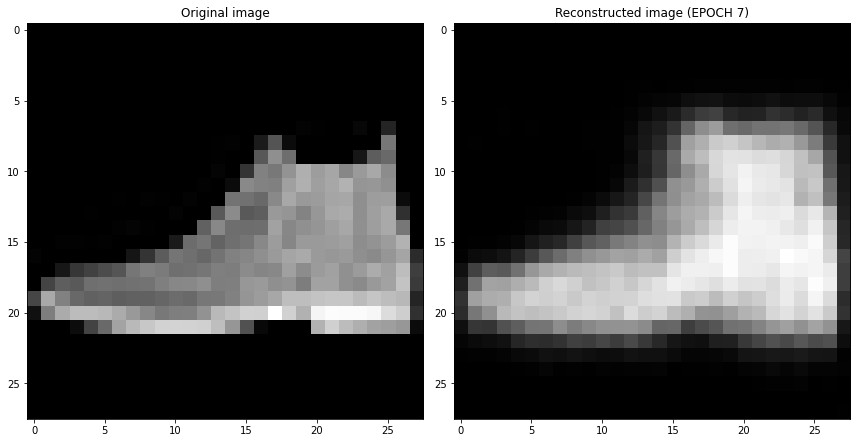

EPOCH 8/10

partial train loss (single batch): 0.029019

partial train loss (single batch): 0.025765

partial train loss (single batch): 0.026739

partial train loss (single batch): 0.029708

partial train loss (single batch): 0.026878

partial train loss (single batch): 0.029108

partial train loss (single batch): 0.028493

partial train loss (single batch): 0.026617

partial train loss (single batch): 0.027513

partial train loss (single batch): 0.028471

partial train loss (single batch): 0.029247

partial train loss (single batch): 0.030105

partial train loss (single batch): 0.026866

partial train loss (single batch): 0.027467

partial train loss (single batch): 0.027544

partial train loss (single batch): 0.029119

partial train loss (single batch): 0.028006

partial train loss (single batch): 0.026966

partial train loss (single batch): 0.027378

partial train loss (single batch): 0.028362

partial train loss (single batch): 0.026529

partial train loss (single batch): 0.028154

partial train loss (single batch): 0.027778

partial train loss (single batch): 0.028810

partial train loss (single batch): 0.025832

partial train loss (single batch): 0.027038

partial train loss (single batch): 0.028581

partial train loss (single batch): 0.027586

partial train loss (single batch): 0.026609

partial train loss (single batch): 0.029291

partial train loss (single batch): 0.029316

partial train loss (single batch): 0.028053

partial train loss (single batch): 0.028304

partial train loss (single batch): 0.027378

partial train loss (single batch): 0.028714

partial train loss (single batch): 0.028209

partial train loss (single batch): 0.027488

partial train loss (single batch): 0.027404

partial train loss (single batch): 0.029065

partial train loss (single batch): 0.027293

partial train loss (single batch): 0.028182

partial train loss (single batch): 0.027913

partial train loss (single batch): 0.025644

partial train loss (single batch): 0.028952

partial train loss (single batch): 0.027579

partial train loss (single batch): 0.028308

partial train loss (single batch): 0.028318

partial train loss (single batch): 0.027284

partial train loss (single batch): 0.027036

partial train loss (single batch): 0.027702

partial train loss (single batch): 0.027374

partial train loss (single batch): 0.027480

partial train loss (single batch): 0.027078

partial train loss (single batch): 0.028228

partial train loss (single batch): 0.028173

partial train loss (single batch): 0.027296

partial train loss (single batch): 0.027236

partial train loss (single batch): 0.027246

partial train loss (single batch): 0.026402

partial train loss (single batch): 0.027448

partial train loss (single batch): 0.027855

partial train loss (single batch): 0.027885

partial train loss (single batch): 0.028019

partial train loss (single batch): 0.027094

partial train loss (single batch): 0.028354

partial train loss (single batch): 0.027749

partial train loss (single batch): 0.026989

partial train loss (single batch): 0.027781

partial train loss (single batch): 0.028004

partial train loss (single batch): 0.027190

partial train loss (single batch): 0.028096

partial train loss (single batch): 0.028232

partial train loss (single batch): 0.027942

partial train loss (single batch): 0.027493

partial train loss (single batch): 0.028722

partial train loss (single batch): 0.028494

partial train loss (single batch): 0.026951

partial train loss (single batch): 0.029128

partial train loss (single batch): 0.028856

partial train loss (single batch): 0.026895

partial train loss (single batch): 0.027952

partial train loss (single batch): 0.028845

partial train loss (single batch): 0.028972

partial train loss (single batch): 0.027757

partial train loss (single batch): 0.027086

partial train loss (single batch): 0.027328

partial train loss (single batch): 0.026772

partial train loss (single batch): 0.027487

partial train loss (single batch): 0.026591

partial train loss (single batch): 0.027413

partial train loss (single batch): 0.028425

partial train loss (single batch): 0.027698

partial train loss (single batch): 0.028188

partial train loss (single batch): 0.027316

partial train loss (single batch): 0.026769

partial train loss (single batch): 0.026685

partial train loss (single batch): 0.027517

partial train loss (single batch): 0.028367

partial train loss (single batch): 0.028452

partial train loss (single batch): 0.028113

partial train loss (single batch): 0.027296

partial train loss (single batch): 0.028350

partial train loss (single batch): 0.028092

partial train loss (single batch): 0.027096

partial train loss (single batch): 0.026288

partial train loss (single batch): 0.027456

partial train loss (single batch): 0.025982

partial train loss (single batch): 0.027189

partial train loss (single batch): 0.026542

partial train loss (single batch): 0.025206

partial train loss (single batch): 0.028535

partial train loss (single batch): 0.027837

partial train loss (single batch): 0.026948

partial train loss (single batch): 0.028545

partial train loss (single batch): 0.026008

partial train loss (single batch): 0.026572

partial train loss (single batch): 0.027326

partial train loss (single batch): 0.027150

partial train loss (single batch): 0.027773

partial train loss (single batch): 0.027950

partial train loss (single batch): 0.027748

partial train loss (single batch): 0.028302

partial train loss (single batch): 0.026794

partial train loss (single batch): 0.028697

partial train loss (single batch): 0.026107

partial train loss (single batch): 0.028860

partial train loss (single batch): 0.028447

partial train loss (single batch): 0.028553

partial train loss (single batch): 0.027353

partial train loss (single batch): 0.027854

partial train loss (single batch): 0.025836

partial train loss (single batch): 0.028298

partial train loss (single batch): 0.028262

partial train loss (single batch): 0.027621

partial train loss (single batch): 0.027743

partial train loss (single batch): 0.027081

partial train loss (single batch): 0.028874

partial train loss (single batch): 0.026283

partial train loss (single batch): 0.028582

partial train loss (single batch): 0.027319

partial train loss (single batch): 0.029571

partial train loss (single batch): 0.025327

partial train loss (single batch): 0.026784

partial train loss (single batch): 0.026749

partial train loss (single batch): 0.027082

partial train loss (single batch): 0.028055

partial train loss (single batch): 0.028858

partial train loss (single batch): 0.029240

partial train loss (single batch): 0.028666

partial train loss (single batch): 0.027090

partial train loss (single batch): 0.027486

partial train loss (single batch): 0.027452

partial train loss (single batch): 0.028207

partial train loss (single batch): 0.027957

partial train loss (single batch): 0.027758

partial train loss (single batch): 0.027994

partial train loss (single batch): 0.026236

partial train loss (single batch): 0.027758

partial train loss (single batch): 0.027871

partial train loss (single batch): 0.026140

partial train loss (single batch): 0.027931

partial train loss (single batch): 0.027031

partial train loss (single batch): 0.027755

partial train loss (single batch): 0.026556

partial train loss (single batch): 0.027501

partial train loss (single batch): 0.027812

partial train loss (single batch): 0.027392

partial train loss (single batch): 0.027817

partial train loss (single batch): 0.026758

partial train loss (single batch): 0.027133

partial train loss (single batch): 0.026958

partial train loss (single batch): 0.028461

partial train loss (single batch): 0.026264

partial train loss (single batch): 0.027583

partial train loss (single batch): 0.026598

partial train loss (single batch): 0.028666

partial train loss (single batch): 0.026366

partial train loss (single batch): 0.027091

partial train loss (single batch): 0.027903

partial train loss (single batch): 0.027594

partial train loss (single batch): 0.026761

partial train loss (single batch): 0.026749

partial train loss (single batch): 0.027686

partial train loss (single batch): 0.027927

partial train loss (single batch): 0.026808

partial train loss (single batch): 0.025474

partial train loss (single batch): 0.027328

partial train loss (single batch): 0.027159

partial train loss (single batch): 0.026915

partial train loss (single batch): 0.025392

partial train loss (single batch): 0.027120

partial train loss (single batch): 0.027455

partial train loss (single batch): 0.027076

partial train loss (single batch): 0.027180

partial train loss (single batch): 0.028971

partial train loss (single batch): 0.028190

partial train loss (single batch): 0.029667

partial train loss (single batch): 0.027064

partial train loss (single batch): 0.027897

partial train loss (single batch): 0.026391

partial train loss (single batch): 0.028057

partial train loss (single batch): 0.028276

partial train loss (single batch): 0.026551

partial train loss (single batch): 0.026733

partial train loss (single batch): 0.025603

partial train loss (single batch): 0.027193

partial train loss (single batch): 0.026391

partial train loss (single batch): 0.026077

partial train loss (single batch): 0.027416

partial train loss (single batch): 0.027314

partial train loss (single batch): 0.027272

partial train loss (single batch): 0.027949

partial train loss (single batch): 0.027330

partial train loss (single batch): 0.026555

partial train loss (single batch): 0.026063

partial train loss (single batch): 0.025151

partial train loss (single batch): 0.027629

partial train loss (single batch): 0.026753

partial train loss (single batch): 0.026402

partial train loss (single batch): 0.026526

partial train loss (single batch): 0.028883

partial train loss (single batch): 0.026514

partial train loss (single batch): 0.027596

partial train loss (single batch): 0.027969

partial train loss (single batch): 0.027118

partial train loss (single batch): 0.028790

partial train loss (single batch): 0.025887

partial train loss (single batch): 0.026354

partial train loss (single batch): 0.026730

partial train loss (single batch): 0.027048

partial train loss (single batch): 0.027588

partial train loss (single batch): 0.027884

partial train loss (single batch): 0.028226

partial train loss (single batch): 0.027595

partial train loss (single batch): 0.027112

VALIDATION - EPOCH 8/10 - loss: 0.027331

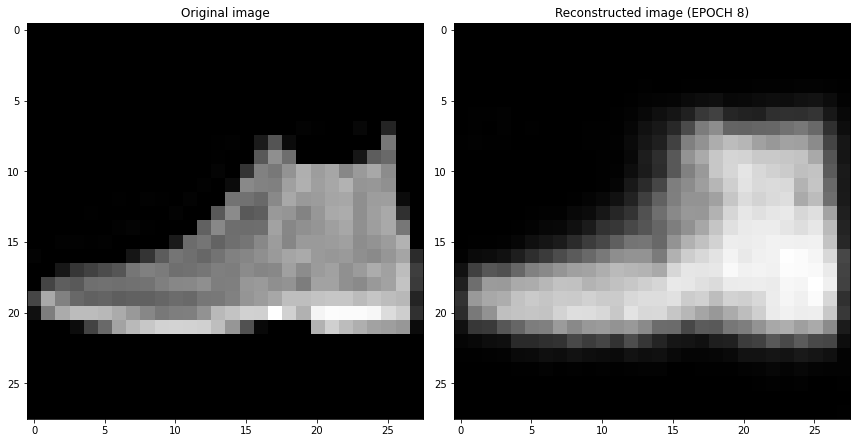

EPOCH 9/10

partial train loss (single batch): 0.025280

partial train loss (single batch): 0.026649

partial train loss (single batch): 0.026787

partial train loss (single batch): 0.026878

partial train loss (single batch): 0.026752

partial train loss (single batch): 0.028369

partial train loss (single batch): 0.026056

partial train loss (single batch): 0.025834

partial train loss (single batch): 0.027624

partial train loss (single batch): 0.028157

partial train loss (single batch): 0.029681

partial train loss (single batch): 0.027114

partial train loss (single batch): 0.027116

partial train loss (single batch): 0.028277

partial train loss (single batch): 0.028446

partial train loss (single batch): 0.028003

partial train loss (single batch): 0.026249

partial train loss (single batch): 0.026203

partial train loss (single batch): 0.027604

partial train loss (single batch): 0.027972

partial train loss (single batch): 0.027228

partial train loss (single batch): 0.025858

partial train loss (single batch): 0.027650

partial train loss (single batch): 0.026767

partial train loss (single batch): 0.027177

partial train loss (single batch): 0.028220

partial train loss (single batch): 0.027219

partial train loss (single batch): 0.026930

partial train loss (single batch): 0.026966

partial train loss (single batch): 0.028841

partial train loss (single batch): 0.027845

partial train loss (single batch): 0.028908

partial train loss (single batch): 0.027677

partial train loss (single batch): 0.027452

partial train loss (single batch): 0.026546

partial train loss (single batch): 0.028153

partial train loss (single batch): 0.026167

partial train loss (single batch): 0.028149

partial train loss (single batch): 0.028084

partial train loss (single batch): 0.026678

partial train loss (single batch): 0.026401

partial train loss (single batch): 0.027456

partial train loss (single batch): 0.026067

partial train loss (single batch): 0.027525

partial train loss (single batch): 0.028344

partial train loss (single batch): 0.025634

partial train loss (single batch): 0.026881

partial train loss (single batch): 0.027003

partial train loss (single batch): 0.025528

partial train loss (single batch): 0.027099

partial train loss (single batch): 0.028129

partial train loss (single batch): 0.026158

partial train loss (single batch): 0.027579

partial train loss (single batch): 0.026623

partial train loss (single batch): 0.027149

partial train loss (single batch): 0.026673

partial train loss (single batch): 0.029306

partial train loss (single batch): 0.026104

partial train loss (single batch): 0.026707

partial train loss (single batch): 0.026444

partial train loss (single batch): 0.027186

partial train loss (single batch): 0.026909

partial train loss (single batch): 0.027362

partial train loss (single batch): 0.028039

partial train loss (single batch): 0.027728

partial train loss (single batch): 0.026626

partial train loss (single batch): 0.027981

partial train loss (single batch): 0.026989

partial train loss (single batch): 0.027430

partial train loss (single batch): 0.026085

partial train loss (single batch): 0.026381

partial train loss (single batch): 0.026129

partial train loss (single batch): 0.025862

partial train loss (single batch): 0.027390

partial train loss (single batch): 0.026796

partial train loss (single batch): 0.026083

partial train loss (single batch): 0.028467

partial train loss (single batch): 0.026948

partial train loss (single batch): 0.027416

partial train loss (single batch): 0.025919

partial train loss (single batch): 0.026762

partial train loss (single batch): 0.026147

partial train loss (single batch): 0.025990

partial train loss (single batch): 0.026292

partial train loss (single batch): 0.026898

partial train loss (single batch): 0.025991

partial train loss (single batch): 0.028640

partial train loss (single batch): 0.026589

partial train loss (single batch): 0.028124

partial train loss (single batch): 0.027487

partial train loss (single batch): 0.027403

partial train loss (single batch): 0.026057

partial train loss (single batch): 0.027403

partial train loss (single batch): 0.027980

partial train loss (single batch): 0.027142

partial train loss (single batch): 0.027953

partial train loss (single batch): 0.027582

partial train loss (single batch): 0.027704

partial train loss (single batch): 0.026454

partial train loss (single batch): 0.025809

partial train loss (single batch): 0.026621

partial train loss (single batch): 0.029767

partial train loss (single batch): 0.027157

partial train loss (single batch): 0.026694

partial train loss (single batch): 0.026412

partial train loss (single batch): 0.026222

partial train loss (single batch): 0.027614

partial train loss (single batch): 0.028233

partial train loss (single batch): 0.027883

partial train loss (single batch): 0.026574

partial train loss (single batch): 0.026902

partial train loss (single batch): 0.027511

partial train loss (single batch): 0.028607

partial train loss (single batch): 0.028124

partial train loss (single batch): 0.027402

partial train loss (single batch): 0.027330

partial train loss (single batch): 0.027597

partial train loss (single batch): 0.026687

partial train loss (single batch): 0.026747

partial train loss (single batch): 0.026160

partial train loss (single batch): 0.027038

partial train loss (single batch): 0.027872

partial train loss (single batch): 0.027568

partial train loss (single batch): 0.026357

partial train loss (single batch): 0.028600

partial train loss (single batch): 0.027383

partial train loss (single batch): 0.026676

partial train loss (single batch): 0.027737

partial train loss (single batch): 0.028167

partial train loss (single batch): 0.027043

partial train loss (single batch): 0.028338

partial train loss (single batch): 0.025911

partial train loss (single batch): 0.026445

partial train loss (single batch): 0.027311

partial train loss (single batch): 0.026315

partial train loss (single batch): 0.026419

partial train loss (single batch): 0.026527

partial train loss (single batch): 0.024443

partial train loss (single batch): 0.026253

partial train loss (single batch): 0.026339

partial train loss (single batch): 0.025974

partial train loss (single batch): 0.027838

partial train loss (single batch): 0.026367

partial train loss (single batch): 0.026448

partial train loss (single batch): 0.027244

partial train loss (single batch): 0.027205

partial train loss (single batch): 0.026338

partial train loss (single batch): 0.027333

partial train loss (single batch): 0.026436

partial train loss (single batch): 0.028398

partial train loss (single batch): 0.027469

partial train loss (single batch): 0.027219

partial train loss (single batch): 0.027196

partial train loss (single batch): 0.028556

partial train loss (single batch): 0.027786

partial train loss (single batch): 0.026087

partial train loss (single batch): 0.026451

partial train loss (single batch): 0.026774

partial train loss (single batch): 0.026797

partial train loss (single batch): 0.026757

partial train loss (single batch): 0.028519

partial train loss (single batch): 0.025901

partial train loss (single batch): 0.029279

partial train loss (single batch): 0.028366

partial train loss (single batch): 0.026597

partial train loss (single batch): 0.027232

partial train loss (single batch): 0.025167

partial train loss (single batch): 0.027006

partial train loss (single batch): 0.025186

partial train loss (single batch): 0.027605

partial train loss (single batch): 0.027285

partial train loss (single batch): 0.028791

partial train loss (single batch): 0.027073

partial train loss (single batch): 0.027050

partial train loss (single batch): 0.027996

partial train loss (single batch): 0.026495

partial train loss (single batch): 0.027746

partial train loss (single batch): 0.027351

partial train loss (single batch): 0.027318

partial train loss (single batch): 0.027131

partial train loss (single batch): 0.027567

partial train loss (single batch): 0.026764

partial train loss (single batch): 0.026399

partial train loss (single batch): 0.026441

partial train loss (single batch): 0.026425

partial train loss (single batch): 0.029031

partial train loss (single batch): 0.027185

partial train loss (single batch): 0.026935

partial train loss (single batch): 0.027549

partial train loss (single batch): 0.026063

partial train loss (single batch): 0.027353

partial train loss (single batch): 0.026539

partial train loss (single batch): 0.029164

partial train loss (single batch): 0.025727

partial train loss (single batch): 0.026297

partial train loss (single batch): 0.028015

partial train loss (single batch): 0.026404

partial train loss (single batch): 0.026990

partial train loss (single batch): 0.025982

partial train loss (single batch): 0.027754

partial train loss (single batch): 0.026508

partial train loss (single batch): 0.027583

partial train loss (single batch): 0.025655

partial train loss (single batch): 0.026624

partial train loss (single batch): 0.026937

partial train loss (single batch): 0.026048

partial train loss (single batch): 0.024684

partial train loss (single batch): 0.028354

partial train loss (single batch): 0.027331

partial train loss (single batch): 0.027219

partial train loss (single batch): 0.027021

partial train loss (single batch): 0.026186

partial train loss (single batch): 0.027204

partial train loss (single batch): 0.027104

partial train loss (single batch): 0.027121

partial train loss (single batch): 0.028561

partial train loss (single batch): 0.026692

partial train loss (single batch): 0.026128

partial train loss (single batch): 0.026447

partial train loss (single batch): 0.026314

partial train loss (single batch): 0.025636

partial train loss (single batch): 0.024729

partial train loss (single batch): 0.026514

partial train loss (single batch): 0.027387

partial train loss (single batch): 0.025942

partial train loss (single batch): 0.026360

partial train loss (single batch): 0.028821

partial train loss (single batch): 0.027809

partial train loss (single batch): 0.025677

partial train loss (single batch): 0.026843

partial train loss (single batch): 0.026540

partial train loss (single batch): 0.025393

partial train loss (single batch): 0.026491

partial train loss (single batch): 0.024560

partial train loss (single batch): 0.028841

VALIDATION - EPOCH 9/10 - loss: 0.026808

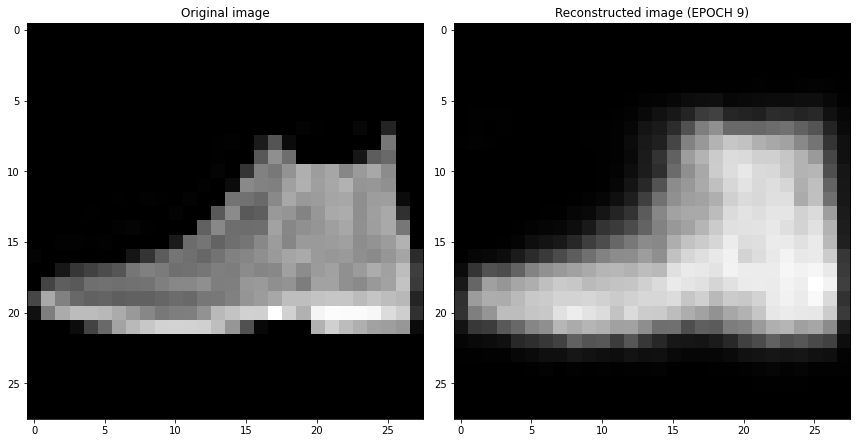

EPOCH 10/10

partial train loss (single batch): 0.025823

partial train loss (single batch): 0.027552

partial train loss (single batch): 0.028166

partial train loss (single batch): 0.026111

partial train loss (single batch): 0.026137

partial train loss (single batch): 0.027971

partial train loss (single batch): 0.026470

partial train loss (single batch): 0.026669

partial train loss (single batch): 0.025652

partial train loss (single batch): 0.025490

partial train loss (single batch): 0.026487

partial train loss (single batch): 0.027190

partial train loss (single batch): 0.027365

partial train loss (single batch): 0.026837

partial train loss (single batch): 0.025339

partial train loss (single batch): 0.026371

partial train loss (single batch): 0.026954

partial train loss (single batch): 0.027300

partial train loss (single batch): 0.026838

partial train loss (single batch): 0.026260

partial train loss (single batch): 0.026527

partial train loss (single batch): 0.028018

partial train loss (single batch): 0.027295

partial train loss (single batch): 0.025949

partial train loss (single batch): 0.026123

partial train loss (single batch): 0.027096

partial train loss (single batch): 0.027893

partial train loss (single batch): 0.028305

partial train loss (single batch): 0.025128

partial train loss (single batch): 0.026716

partial train loss (single batch): 0.027753

partial train loss (single batch): 0.025864

partial train loss (single batch): 0.026183

partial train loss (single batch): 0.025727

partial train loss (single batch): 0.026326

partial train loss (single batch): 0.025966

partial train loss (single batch): 0.026246

partial train loss (single batch): 0.027368

partial train loss (single batch): 0.025884

partial train loss (single batch): 0.026632

partial train loss (single batch): 0.026167

partial train loss (single batch): 0.026619

partial train loss (single batch): 0.025316

partial train loss (single batch): 0.027076

partial train loss (single batch): 0.027174

partial train loss (single batch): 0.027621

partial train loss (single batch): 0.025998

partial train loss (single batch): 0.028406

partial train loss (single batch): 0.026010

partial train loss (single batch): 0.027297

partial train loss (single batch): 0.026680

partial train loss (single batch): 0.026050

partial train loss (single batch): 0.026554

partial train loss (single batch): 0.026453

partial train loss (single batch): 0.027207

partial train loss (single batch): 0.026389

partial train loss (single batch): 0.026296

partial train loss (single batch): 0.027303

partial train loss (single batch): 0.024823

partial train loss (single batch): 0.027938

partial train loss (single batch): 0.027528

partial train loss (single batch): 0.027465

partial train loss (single batch): 0.026923

partial train loss (single batch): 0.025353

partial train loss (single batch): 0.025569

partial train loss (single batch): 0.027217

partial train loss (single batch): 0.027903

partial train loss (single batch): 0.025188

partial train loss (single batch): 0.025903

partial train loss (single batch): 0.027829

partial train loss (single batch): 0.026048

partial train loss (single batch): 0.025743

partial train loss (single batch): 0.027869

partial train loss (single batch): 0.026946

partial train loss (single batch): 0.026995

partial train loss (single batch): 0.027309

partial train loss (single batch): 0.026997

partial train loss (single batch): 0.027243

partial train loss (single batch): 0.025556

partial train loss (single batch): 0.025815

partial train loss (single batch): 0.025161

partial train loss (single batch): 0.026610

partial train loss (single batch): 0.026704

partial train loss (single batch): 0.028036

partial train loss (single batch): 0.027224

partial train loss (single batch): 0.026749

partial train loss (single batch): 0.027778

partial train loss (single batch): 0.026581

partial train loss (single batch): 0.026995

partial train loss (single batch): 0.028155

partial train loss (single batch): 0.026182

partial train loss (single batch): 0.026415

partial train loss (single batch): 0.026143

partial train loss (single batch): 0.025590

partial train loss (single batch): 0.026744

partial train loss (single batch): 0.026592

partial train loss (single batch): 0.027744

partial train loss (single batch): 0.025360

partial train loss (single batch): 0.027569

partial train loss (single batch): 0.027258

partial train loss (single batch): 0.026405

partial train loss (single batch): 0.025674

partial train loss (single batch): 0.026023

partial train loss (single batch): 0.027006

partial train loss (single batch): 0.026434

partial train loss (single batch): 0.027207

partial train loss (single batch): 0.027479

partial train loss (single batch): 0.026643

partial train loss (single batch): 0.026628

partial train loss (single batch): 0.027984

partial train loss (single batch): 0.025619

partial train loss (single batch): 0.026178

partial train loss (single batch): 0.025996

partial train loss (single batch): 0.026992

partial train loss (single batch): 0.026424

partial train loss (single batch): 0.026267

partial train loss (single batch): 0.025761

partial train loss (single batch): 0.027540

partial train loss (single batch): 0.026054

partial train loss (single batch): 0.024913

partial train loss (single batch): 0.026694

partial train loss (single batch): 0.026892

partial train loss (single batch): 0.026552

partial train loss (single batch): 0.026940

partial train loss (single batch): 0.026654

partial train loss (single batch): 0.027602

partial train loss (single batch): 0.027732

partial train loss (single batch): 0.026800

partial train loss (single batch): 0.027702

partial train loss (single batch): 0.024894

partial train loss (single batch): 0.028613

partial train loss (single batch): 0.026430

partial train loss (single batch): 0.028489

partial train loss (single batch): 0.027271

partial train loss (single batch): 0.027122

partial train loss (single batch): 0.025521

partial train loss (single batch): 0.027142

partial train loss (single batch): 0.026122

partial train loss (single batch): 0.025190

partial train loss (single batch): 0.027651

partial train loss (single batch): 0.027404

partial train loss (single batch): 0.027997

partial train loss (single batch): 0.026846

partial train loss (single batch): 0.025507

partial train loss (single batch): 0.025444

partial train loss (single batch): 0.026079

partial train loss (single batch): 0.027085

partial train loss (single batch): 0.025127

partial train loss (single batch): 0.028255

partial train loss (single batch): 0.026182

partial train loss (single batch): 0.026823

partial train loss (single batch): 0.027246

partial train loss (single batch): 0.026784

partial train loss (single batch): 0.025879

partial train loss (single batch): 0.024918

partial train loss (single batch): 0.026119

partial train loss (single batch): 0.025889

partial train loss (single batch): 0.025993

partial train loss (single batch): 0.026617

partial train loss (single batch): 0.026285

partial train loss (single batch): 0.025699

partial train loss (single batch): 0.028116

partial train loss (single batch): 0.026743

partial train loss (single batch): 0.027306

partial train loss (single batch): 0.026041

partial train loss (single batch): 0.026872

partial train loss (single batch): 0.026560

partial train loss (single batch): 0.027101

partial train loss (single batch): 0.026995

partial train loss (single batch): 0.025742

partial train loss (single batch): 0.024409

partial train loss (single batch): 0.027793

partial train loss (single batch): 0.030080

partial train loss (single batch): 0.027884

partial train loss (single batch): 0.025377

partial train loss (single batch): 0.025256

partial train loss (single batch): 0.027006

partial train loss (single batch): 0.027162

partial train loss (single batch): 0.025641

partial train loss (single batch): 0.027064

partial train loss (single batch): 0.026584

partial train loss (single batch): 0.025495

partial train loss (single batch): 0.026159

partial train loss (single batch): 0.025934

partial train loss (single batch): 0.027629

partial train loss (single batch): 0.026296

partial train loss (single batch): 0.025722

partial train loss (single batch): 0.026975

partial train loss (single batch): 0.026030

partial train loss (single batch): 0.026004

partial train loss (single batch): 0.026867

partial train loss (single batch): 0.025401

partial train loss (single batch): 0.026250

partial train loss (single batch): 0.027665

partial train loss (single batch): 0.026508

partial train loss (single batch): 0.027087

partial train loss (single batch): 0.027812

partial train loss (single batch): 0.027296

partial train loss (single batch): 0.027899

partial train loss (single batch): 0.026906

partial train loss (single batch): 0.026696

partial train loss (single batch): 0.026328

partial train loss (single batch): 0.026100

partial train loss (single batch): 0.027367

partial train loss (single batch): 0.026119

partial train loss (single batch): 0.027229

partial train loss (single batch): 0.025478

partial train loss (single batch): 0.025452

partial train loss (single batch): 0.026178

partial train loss (single batch): 0.025414

partial train loss (single batch): 0.025957

partial train loss (single batch): 0.025424

partial train loss (single batch): 0.026343

partial train loss (single batch): 0.026568

partial train loss (single batch): 0.025747

partial train loss (single batch): 0.025803

partial train loss (single batch): 0.025943

partial train loss (single batch): 0.029209

partial train loss (single batch): 0.026741

partial train loss (single batch): 0.026696

partial train loss (single batch): 0.027137

partial train loss (single batch): 0.026700

partial train loss (single batch): 0.023875

partial train loss (single batch): 0.025253

partial train loss (single batch): 0.029268

partial train loss (single batch): 0.026947

partial train loss (single batch): 0.027023

partial train loss (single batch): 0.025033

partial train loss (single batch): 0.027118

partial train loss (single batch): 0.027098

partial train loss (single batch): 0.026002

partial train loss (single batch): 0.025456

partial train loss (single batch): 0.026824

partial train loss (single batch): 0.026843

partial train loss (single batch): 0.025125

VALIDATION - EPOCH 10/10 - loss: 0.026580

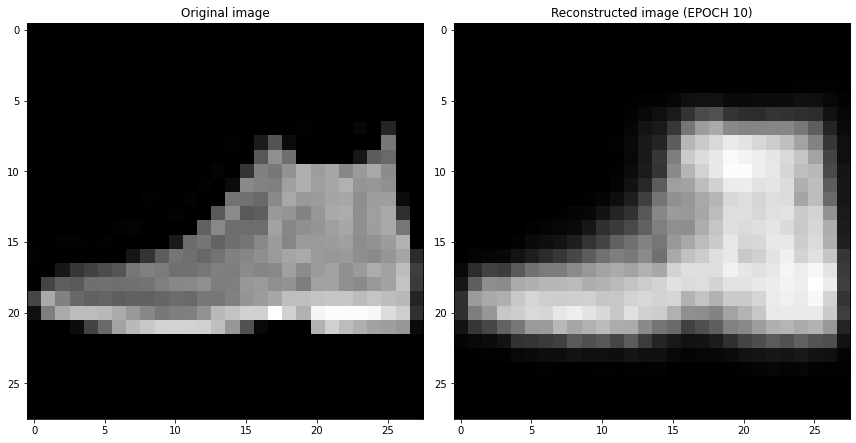

In [ ]:
torch.manual_seed(999)

### Initialize the two networks
encoded_space_dim = 10  # this is the only line we change!
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)


### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 5e-4 # Learning rate
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-5)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)


### Training cycle
num_epochs = 10
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
    ### Validation  (use the testing function)
    val_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print Validationloss
    print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))

    ### Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))
    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(12,6))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
    axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)
    # Save figures
    os.makedirs('autoencoder_progress_%d_features' % encoded_space_dim, exist_ok=True)
    fig.savefig('autoencoder_progress_%d_features/epoch_%d.jpg' % (encoded_space_dim, epoch + 1))
    plt.show()
    plt.close()

### Get the encoded representation of the test samples

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

100%|██████████| 10000/10000 [00:08<00:00, 1211.08it/s]


,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,label
0,-31.007051,32.777634,12.859493,9
1,-14.079576,-18.750046,-48.408478,2
2,14.548528,-53.694118,5.216158,1
3,9.981250,-41.069649,16.423239,1
4,0.407568,-5.948061,-14.199286,6
...,...,...,...,...
9995,-26.522591,40.726051,-9.736078,9
9996,4.192958,-26.338230,18.929869,1
9997,-22.488197,-30.433527,8.215878,8
9998,0.343053,-64.624489,18.466352,1


## PCA

In [ ]:
pca = PCA(n_components=2)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples)
encoded_samples_reduced_PCA

array([[ 51.53244247,  -8.03381236],
       [-16.50040302,  37.62239139],
       [-45.09604734, -26.30350219],
       ...,
       [ -8.43758162, -14.82299065],
       [-45.43946961, -36.14037617],
       [ 34.64964991, -16.49149347]])

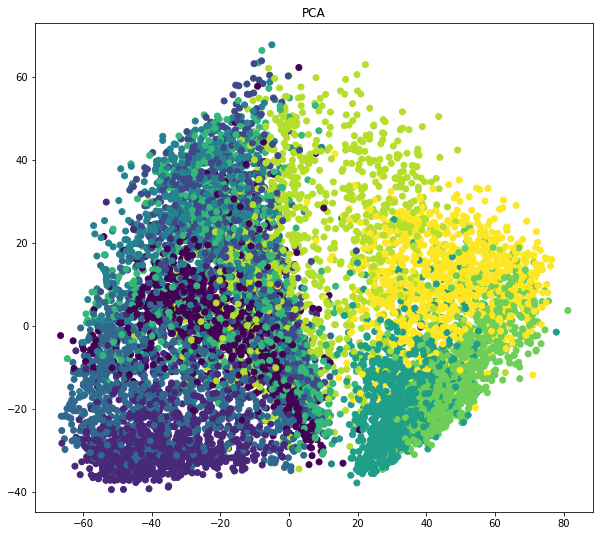

In [ ]:
fig,ax = plt.subplots(figsize=(10,9))
ax.set_title('PCA')
ax.scatter(encoded_samples_reduced_PCA[:,0], encoded_samples_reduced_PCA[:,1], c=encoded_samples.label.to_numpy())

In [ ]:
type(encoded_samples_reduced_PCA)

numpy.ndarray

In [ ]:
px.scatter(encoded_samples_reduced_PCA[:,0], encoded_samples_reduced_PCA[:,1],  color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

## t-SNE

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



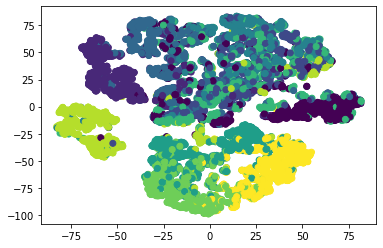

In [ ]:
tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)
plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())

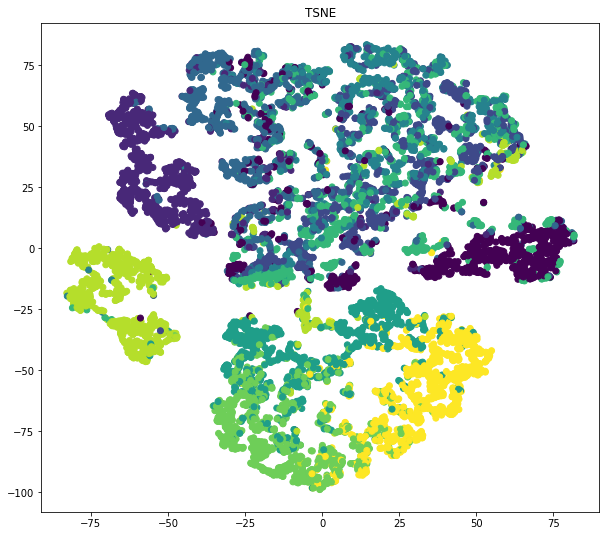

In [ ]:
fig,ax = plt.subplots(figsize=(10,9))
ax.set_title('TSNE')
ax.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())

In [ ]:
px.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1],  color=[label_names[l] for l in encoded_samples.label.to_numpy()], opacity=0.7)

## Transfer learning

In [ ]:

N = [2, 4]


M = [4, 16, 32]

l_rate = [0.001, 0.0001]

loss_fn = torch.nn.CrossEntropyLoss() # TODO

# Define an optimizer
lr = 1e-3
optim = torch.optim.Adam(trf_net.parameters(), lr=lr, weight_decay=5e-4)
n_epochs = [5, 10, 20]

weights = [0, 0.0001, 0.01]


dropouts = [0, 0.2, 0.4]

In [ ]:
class Net4(nn.Module):
    
    def __init__(self, Ni, Nh1, Nh2, Nh3, Nh4, No, dropout_p):
        """
        Ni - Input size
        Nh1 - Neurons in the 1st hidden layer
        Nh2 - Neurons in the 2nd hidden layer
        Nh3 - Neurons in the 3rd hidden layer
        Nh4 - Neurons in the 4th hidden layer
        No - Output size
        activation - Activation function
        dropout_p - Dropout probability
        """
        super().__init__()
        
        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1)
        self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2)
        self.fc3 = nn.Linear(in_features=Nh2, out_features=Nh3)
        self.fc4 = nn.Linear(in_features=Nh3, out_features=Nh4)
        self.out = nn.Linear(in_features=Nh4, out_features=No)
        
        self.act = nn.ReLU()

        self.dropout = nn.Dropout(dropout_p)

        print('Network initialized')
        
    def forward(self, x, additional_out=False):

        x = x.view(x.size(0), -1) # Reshaping from matrix to
        x = self.dropout(self.act(self.fc1(x)))
        x = self.dropout(self.act(self.fc2(x)))
        x = self.dropout(self.act(self.fc3(x)))
        x = self.dropout(self.act(self.fc4(x)))
        x = self.out(x)

        return x

In [ ]:
class CNN(nn.Module):
    '''
    Module including network structure and functioning, basic training, testing and validating operations.
    '''
    def __init__(self, n_channels, pdrop2d, pdrop1d):
        '''
        The network is composed of:
        - one convolutional layer with 1 input channel, @n_channels output channels, a 3 by 3 kernel 
        - another convolutional layer with @n_channels input channels, 2*@n_channels output channels, 5 by 5 kernel
        - a dropout layer
        - one fully connected layer with (img size)x(2*n_channels)=50xn_channels inputs, 100 outputs
        - another dropout layer
        - one fully connected layer with 100 inputs, 10 outputs (corresponding to the 10 labels)  
        
        Input
        n_channels: number of convolutional channels
        pdrop2d:    dropout probability of 2D dropout layer
        pdrop1d:    dropout probability of 1D dropout layer
        '''
        super(CNN, self).__init__()
    
        # --> img size = 28-3+2*1+1= 28x28 
        self.conv1 = nn.Conv2d(1, n_channels, kernel_size=3, padding=1)
        # Max Pooling --> img size halved = 14x14
        self.mpool = nn.MaxPool2d(2, 2)    
        # dropout layer
        self.drop2 = nn.Dropout2d(p=pdrop2d) 
        # --> img size = 14-5+1 = 10x10
        self.conv2 = nn.Conv2d(n_channels, 2*n_channels, kernel_size=5) 
        # Max Pooling --> img size halved = 5x5
        
        # fully connceted layer with (img size)x(2*n_channels)=50xn_channels, 100 output units
        self.fulc1 = nn.Linear(50*n_channels, 100)             
        # dropout after first linear layer
        self.drop1 = nn.Dropout(p=pdrop1d)
        # fully connected layer with inputs equal to number of outputs of previous layer, 10 outputs (10 digits)
        self.fulc2 = nn.Linear(100, 10)
        
        print('Network initialized')

    def forward(self, x):
        
        x = F.relu(self.conv1(x))
        x = self.mpool(x)
        x = F.relu(self.conv2(x))
        x = self.mpool(x)
        x = self.drop2(x)
        x = x.view(x.size(0), -1) # reshaping necessary for linear layer
        x = F.relu(self.fulc1(x))
        x = self.drop1(x)
        x = self.fulc2(x)
        
        return x
    
    def train_step(self, train_loader, optimizer, loss_func, device, epoch, verbose=False):
        """
        Define the basic train step.
        
        train_loader: dataloader
        optimizer:    type of selected optimizer (SGD, Adam...)
        loss_func:    selected loss function
        device:       gpu (if available) or cpu
        epoch:        number of epoch in training process
        verbose:      if True prints out status of training process, default False
        
        Return: training loss.
        """
        
        train_loss = [] #initialize vector containing training losses
        self.train()    #set training mode
        
        for ii, s_batch in enumerate(train_loader):
            
            x_batch = s_batch[0].to(device)       #import data, move to device 
            label_b = s_batch[1].to(device)       #import labels, move to device
            
            for_out = self.forward(x_batch)       #forward pass
            
            tr_loss = loss_func(for_out, label_b) #compute loss
        
            self.zero_grad()                      #back-propagation
            tr_loss.backward()
            
            optimizer.step()                      #weights update
                
            ba_loss = tr_loss.detach().cpu().numpy()
            train_loss.append(ba_loss)            #save loss for batch
            
            if (ii % 10 == 0 and verbose): # every 10 batches print out a sumary of training results
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch+1, ii * len(s_batch[0]), len(train_loader.dataset),
                    100. * ii / len(train_loader), ba_loss))

        return train_loss
    
    
    def val_step(self, valid_loader, loss_func, device):
        """
        Define basic validation step.
        
        valid_loader: dataloader
        loss_func:    selected loss function
        device:       gpu (if available) or cpu
        
        Return: validation loss, validation accuracy.
        """
        val_loss = [] #initialize vector containing validation losses
        self.eval()   #set evaluation mode
        
        with torch.no_grad():                         #disable gradient tracking
            for s_batch in valid_loader:
                
                x_batch = s_batch[0].to(device)       #import data, move to device
                label_b = s_batch[1].to(device)       #import labels, move to device
            
                for_out = self.forward(x_batch)       #forward pass

                va_loss = loss_func(for_out, label_b) #compute loss

                ba_loss = va_loss.detach().cpu().numpy()
                val_loss.append(ba_loss)           #save loss for batch
        
        return val_loss
    
    def fitting(self, train_loader, val_loader, optimizer, loss_func, verbose, param):
        '''
        Define training process.
        
        train_loader: train set dataloader 
        valid_loader: validation set dataloader
        optimizer:    selected optimizer 
        loss_func:    selected loss function
        verbose:      if True prints out training status during training process
        param:        dictionary containing the rest of the parameters
        
        Return: train and validation losses.
        '''
        
        train_loss_log = [] 
        val_loss_log = []
        
        for epoch in tqdm(range(param['num_epochs'])):
            # Training
            train_loss = self.train_step(train_loader, optimizer, loss_func, 
                                         param['device'], epoch, verbose)
                
            # Compute and store average training loss
            train_loss = np.mean(train_loss)
            train_loss_log.append(train_loss)
            
            # Validation 
            valid_loss = self.val_step(val_loader, loss_func, param['device'])
            
            # Compute and store average validation loss
            valid_loss = np.mean(valid_loss)
            val_loss_log.append(valid_loss)
            
            # Check for early stopping condition
            stop = self._early_stopping(val_loss_log, param['num_epochs'])
            if stop: 
                print('Early stopping at epoch ', epoch)
                param['num_epochs'] = epoch
                break
            
        return train_loss_log, val_loss_log
    
    def predicting(self, data_loader, device):
        '''
        Compute and returns predicted labels.
        '''              
                
        predicts = [] #initialize vector containing predictions
        self.eval()   #set evaluation mode
        
        with torch.no_grad():                   #disable gradient tracking
            for s_batch in tqdm(data_loader):
                
                x_batch = s_batch[0].to(device) #import data, move to device
                
                for_out = self.forward(x_batch) #forward pass

                outputs = for_out.cpu().numpy().argmax()
                predicts.append(outputs)        #save predictions
        
        return np.array(predicts)
                    
    def _early_stopping(self, val_loss_log, num_epochs):
        
        stop = False
        
        if len(val_loss_log)>1:
            # set interval dimension in which to check loss values
            range_loss = min(len(val_loss_log), 10)
            last_loss = val_loss_log[-1]
            mean_loss = np.mean(val_loss_log[-range_loss:-1])
            
            if (np.abs(last_loss-mean_loss) < 0.005): 
                stop = True
                
        return stop


In [ ]:
### Reload the network state
# First initialize the network (if not already done)
# IMPORTANT: you need to know the model definition!!
trf_net = CNN(7, 0.11774536456083606, 0.07879246895944839) 
# Load the state dict previously saved
net_state_dict = torch.load('FashionMNIST_best_net_parameters.torch')
# Update the network parameters
trf_net.load_state_dict(net_state_dict)

Network initialized


<All keys matched successfully>

In [ ]:
trf_net.eval()

CNN(
  (conv1): Conv2d(1, 7, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (mpool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (drop2): Dropout2d(p=0.11774536456083606, inplace=False)
  (conv2): Conv2d(7, 14, kernel_size=(5, 5), stride=(1, 1))
  (fulc1): Linear(in_features=350, out_features=100, bias=True)
  (drop1): Dropout(p=0.07879246895944839, inplace=False)
  (fulc2): Linear(in_features=100, out_features=10, bias=True)
)

In [ ]:
model

OrderedDict([('fc1.weight',
              tensor([[ 5.2260e-41, -2.1500e-03, -2.1500e-03,  ...,  3.6650e-02,
                        1.2007e-02,  1.4159e-03],
                      [ 8.5441e-04,  9.6986e-04, -2.5884e-02,  ...,  1.0665e-01,
                        4.1270e-02,  4.0651e-03],
                      [ 1.2651e-37, -8.5020e-04,  3.6849e-02,  ...,  1.7046e-01,
                        3.9414e-02, -3.9251e-04],
                      ...,
                      [-7.1078e-38, -5.4816e-39,  2.0312e-39,  ...,  5.7139e-40,
                       -2.9753e-39,  6.1649e-39],
                      [ 3.2729e-38,  2.8747e-39, -1.0519e-02,  ...,  5.5406e-02,
                        1.8019e-02, -1.9893e-10],
                      [ 1.5260e-38, -7.6365e-38, -1.4790e-37,  ...,  6.7607e-39,
                        6.7632e-39, -2.7712e-39]])),
             ('fc1.bias',
              tensor([-1.3295e+00,  3.8296e-01, -7.1254e-01,  6.7962e-01, -1.0560e+00,
                      -9.1458e-01, -8.9863e

In [ ]:
loss_fn = nn.CrossEntropyLoss()

In [ ]:
all_inputs = []
all_outputs = []
all_labels = []
trf_net.eval().to(device) # Evaluation mode (e.g. disable dropout)
with torch.no_grad(): # Disable gradient tracking
    for sample_batched in test_dataloader:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)
        # Forward pass
        out = trf_net(x_batch)
        # Save outputs and labels
        all_inputs.append(x_batch)
        all_outputs.append(out)
        all_labels.append(label_batch)
# Concatenate all the outputs and labels in a single tensor
all_inputs  = torch.cat(all_inputs)
all_outputs = torch.cat(all_outputs)
all_labels  = torch.cat(all_labels)

test_loss = loss_fn(all_outputs, all_labels)
print(f"AVERAGE TEST LOSS: {test_loss}")

AVERAGE TEST LOSS: 2.4710872173309326


In [ ]:
# Network input (the test set)
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=True, num_workers=2)

# Network output
predictions = []
trf_net.to(device)
trf_net.eval()
with torch.no_grad():
  for sample_batched in test_dataloader:
    # Move data to device
    x_batched = sample_batched[0].to(device)
    label_batched = sample_batched[1].to(device)

    # Forward pass
    out = trf_net(x_batched).squeeze().cpu()
    predictions.append([sample_batched, F.softmax(out, dim=1)])

In [ ]:
y_true = []
y_pred = []
images = []
y_pred_prob = []

for batch in predictions:
  # batch[0][0] : (128) images in one batch
  # batch[0][1] : (128) ground truths of the batch
  # batch[1] : (128) predictions for the batch
  for (img, gt, pred) in zip(batch[0][0], batch[0][1], batch[1]):
    y_pred.append((int)(np.argmax(pred)))
    y_true.append((int)(gt))
    images.append(np.array(img))
    y_pred_prob.append(pred)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
images = np.array(images)
y_pred_prob = np.array(y_pred_prob, dtype='object')

corr_pred = (y_true == y_pred)
print(f'Number of correct predictions: {sum(corr_pred)}/{len(corr_pred)} ({100 * sum(corr_pred)/len(corr_pred)}%)\n')

prec, rec, fscore, supp = precision_recall_fscore_support(y_true, y_pred)

print('F1 score')
for i in range(10):
  print(f'Class {i}: {fscore[i]:.4f}')

print('\nConfusion matrix (row - true, column - predicted):')
print(confusion_matrix(y_true, y_pred))

Number of correct predictions: 399/10000 (3.99%)

F1 score
Class 0: 0.0136
Class 1: 0.0583
Class 2: 0.0237
Class 3: 0.0342
Class 4: 0.0339
Class 5: 0.2104
Class 6: 0.0086
Class 7: 0.0250
Class 8: 0.0344
Class 9: 0.0013

Confusion matrix (row - true, column - predicted):
[[ 12   6  43  31   6  13   4  56 809  20]
 [ 56  69   8   3   4   2   1  64 532 261]
 [202  59  34   0  43  10  37  20 473 122]
 [  7  71 191  22   7   8  38   8 627  21]
 [139  56  32   2  24   5  26   7 652  57]
 [ 55  29 559  98  60 130   7  33  28   1]
 [ 75  23  64   7  37   9   5  51 655  74]
 [ 61 106 584   0 205   1  22  18   0   3]
 [127 238 299   4  28   9  19 183  84   9]
 [ 28 709  58 121   4  49   1   2  27   1]]


In [ ]:
y_true_c = y_true[corr_pred]
y_pred_c = y_pred[corr_pred]
images_c = images[corr_pred]
y_pred_prob_c = y_pred_prob[corr_pred]

wrong_pred = (y_true != y_pred)
y_true_w = y_true[wrong_pred]
y_pred_w = y_pred[wrong_pred]
images_w = images[wrong_pred]
y_pred_prob_w = y_pred_prob[wrong_pred]

TypeError: ignored

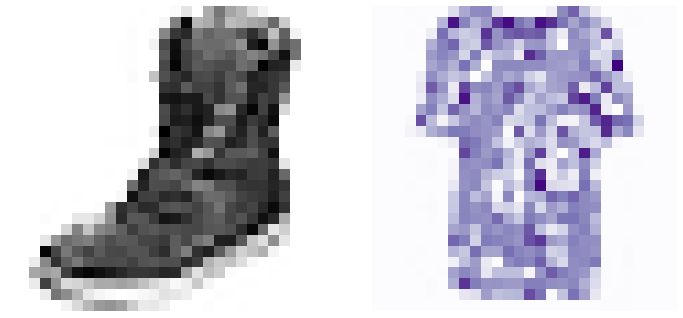

In [ ]:
# Get two images
index1 = np.random.randint(0, len(y_true))
index2 = np.random.randint(0, len(y_true))

img1 = images[index1].squeeze()
label1 = y_true[index1]
img2 = images[index2].squeeze()
label2 = y_true[index2]

fig, ax = plt.subplots(1, 2, figsize=(12,8))
ax[0].imshow(img1, cmap='Greys')
tmp1 = f'Label: {label1}\n'
ax[0].axis('off')
ax[1].imshow(img2, cmap='Purples')
tmp2 = f'Label: {label2}\n'
ax[1].axis('off')

img1 = np.reshape(img1, (1, 1, img1.shape[0], img1.shape[1]))
img2 = np.reshape(img2, (1, 1, img2.shape[0], img2.shape[1]))

# Evaluation
trf_net.to(device)
trf_net.eval()
with torch.no_grad():
  # Move data to device
  x_batched1 = torch.from_numpy(img1).to(device)
  x_batched2 = torch.from_numpy(img2).to(device)

  # Forward pass
  out1, out11, out21, out31 = trf_net.forward(x_batched1, True)
  out1 = out1.squeeze().cpu()
  out11 = out11.squeeze().cpu()
  out21 = out21.squeeze().cpu()
  out31 = out31.squeeze().cpu()
  out2, out12, out22, out32 = trf_net.forward(x_batched2, True)
  out2 = out2.squeeze().cpu()
  out12 = out12.squeeze().cpu()
  out22 = out22.squeeze().cpu()
  out32 = out32.squeeze().cpu()

pred1 = F.softmax(out1, dim=0)
pred2 = F.softmax(out2, dim=0)

tmp1 = tmp1 + f'Prediction: {np.argmax(pred1)}'
ax[0].set_title(tmp1)
tmp2 = tmp2 + f'Prediction: {np.argmax(pred2)}'
ax[1].set_title(tmp2)

plt.show()

In [ ]:
from PIL import Image 

In [ ]:
index = 2
sample_image, sample_label = test_dataset[index]
sample_image = sample_image.unsqueeze(0)

Image.open(test_dataset.samples[0][index])

## Training loop (fine-tuning)

In [ ]:
### Training function
def train_epoch(net, device, dataloader, loss_fn, optimizer):
    # Set train mode
    net.train()
    for image_batch, label_batch in dataloader:
        # Move tensors to the selected device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Forward pass
        out = net(image_batch)
        # Evaluate loss
        loss = loss_fn(out, label_batch)
        # Backward pass and update
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print loss
        print('\t Training loss (single batch):', float(loss.data))

In [ ]:
### Testing function
def test_epoch(net, device, dataloader, loss_fn):
    # Set evaluation mode
    net.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, label_batch in tqdm(dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Forward pass
            out = net(image_batch)
            # Append the network output and the original image to the lists
            conc_out.append(out)
            conc_label.append(label_batch)
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return conc_out, conc_label, val_loss.data # We return all the outputs, all the labels and the global loss

In [ ]:
### Training cycle
num_epochs = 20
train_losses = []
val_losses = []
for epoch in range(num_epochs):
    print(f"EPOCH {epoch + 1}/{num_epochs}")
    ### Training (use the training function)
    train_epoch(
        net=trf_net,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
    
    ### Train loss (use the TESTING function! We want the train loss but using the network in eval mode and without random transformations)
    # NOTE: understand why we are doing this!
    _, _, train_loss = test_epoch(
        net=trf_net,
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn)
    # Print Train loss
    print(f"\n\n\t TRAIN - EPOCH {epoch + 1}/{num_epochs} - train loss: {train_loss}\n\n")
    train_losses.append(train_loss)

    ### Validation  (use the testing function)
    _, _, val_loss = test_epoch(
        net=trf_net,
        device=device, 
        dataloader=val_dataloader, 
        loss_fn=loss_fn)
    # Print Validation loss
    print(f"\n\n\t VALIDATION - EPOCH {epoch + 1}/{num_epochs} - val loss: {val_loss}\n\n")
    val_losses.append(val_loss)

    ### Save model parameters
    torch.save(trf_net.state_dict(), 'finetuned_model.pth')

EPOCH 1/20
	 Training loss (single batch): 0.38763514161109924
	 Training loss (single batch): 0.34900954365730286
	 Training loss (single batch): 0.3431224524974823
	 Training loss (single batch): 0.3187822997570038
	 Training loss (single batch): 0.3358488976955414
	 Training loss (single batch): 0.34499451518058777
	 Training loss (single batch): 0.3673483431339264
	 Training loss (single batch): 0.3363680839538574
	 Training loss (single batch): 0.4597996175289154
	 Training loss (single batch): 0.397346168756485
	 Training loss (single batch): 0.3985815644264221
	 Training loss (single batch): 0.37918001413345337
	 Training loss (single batch): 0.35804691910743713
	 Training loss (single batch): 0.389289528131485
	 Training loss (single batch): 0.3170606791973114
	 Training loss (single batch): 0.3362705111503601
	 Training loss (single batch): 0.32103466987609863
	 Training loss (single batch): 0.35212987661361694
	 Training loss (single batch): 0.39359140396118164
	 Training los

100%|██████████| 188/188 [00:03<00:00, 52.00it/s]




	 TRAIN - EPOCH 1/20 - train loss: 0.3008626401424408




  0%|          | 0/12000 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning:

This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.

100%|██████████| 12000/12000 [00:24<00:00, 490.02it/s]




	 VALIDATION - EPOCH 1/20 - val loss: 0.32105544209480286


EPOCH 2/20
	 Training loss (single batch): 0.32685238122940063
	 Training loss (single batch): 0.27708154916763306
	 Training loss (single batch): 0.2540580928325653
	 Training loss (single batch): 0.34533050656318665
	 Training loss (single batch): 0.3985254466533661
	 Training loss (single batch): 0.3385317623615265
	 Training loss (single batch): 0.2949768900871277
	 Training loss (single batch): 0.32903823256492615
	 Training loss (single batch): 0.3156871795654297
	 Training loss (single batch): 0.3468225598335266
	 Training loss (single batch): 0.3113132417201996
	 Training loss (single batch): 0.3157097399234772
	 Training loss (single batch): 0.22615665197372437
	 Training loss (single batch): 0.3032487630844116
	 Training loss (single batch): 0.3532962203025818
	 Training loss (single batch): 0.3411029279232025
	 Training loss (single batch): 0.3162100911140442
	 Training loss (single batch): 0.23378238081932068
	 T

100%|██████████| 188/188 [00:03<00:00, 52.67it/s]




	 TRAIN - EPOCH 2/20 - train loss: 0.28937122225761414




100%|██████████| 12000/12000 [00:24<00:00, 496.53it/s]




	 VALIDATION - EPOCH 2/20 - val loss: 0.31579160690307617


EPOCH 3/20
	 Training loss (single batch): 0.4203678071498871
	 Training loss (single batch): 0.38728582859039307
	 Training loss (single batch): 0.26829373836517334
	 Training loss (single batch): 0.3898923397064209
	 Training loss (single batch): 0.33378180861473083
	 Training loss (single batch): 0.3334999084472656
	 Training loss (single batch): 0.27730420231819153
	 Training loss (single batch): 0.3572286367416382
	 Training loss (single batch): 0.28219252824783325
	 Training loss (single batch): 0.3003183901309967
	 Training loss (single batch): 0.31960543990135193
	 Training loss (single batch): 0.3449670374393463
	 Training loss (single batch): 0.3299659192562103
	 Training loss (single batch): 0.31010112166404724
	 Training loss (single batch): 0.3181472420692444
	 Training loss (single batch): 0.25568339228630066
	 Training loss (single batch): 0.37734508514404297
	 Training loss (single batch): 0.34839683771133423

100%|██████████| 188/188 [00:03<00:00, 52.59it/s]




	 TRAIN - EPOCH 3/20 - train loss: 0.27959078550338745




100%|██████████| 12000/12000 [00:24<00:00, 489.76it/s]




	 VALIDATION - EPOCH 3/20 - val loss: 0.30790889263153076


EPOCH 4/20
	 Training loss (single batch): 0.2828351557254791
	 Training loss (single batch): 0.2409900724887848
	 Training loss (single batch): 0.2736988961696625
	 Training loss (single batch): 0.29429247975349426
	 Training loss (single batch): 0.3413954973220825
	 Training loss (single batch): 0.29153576493263245
	 Training loss (single batch): 0.36644965410232544
	 Training loss (single batch): 0.33474522829055786
	 Training loss (single batch): 0.4103316068649292
	 Training loss (single batch): 0.38601961731910706
	 Training loss (single batch): 0.3177310526371002
	 Training loss (single batch): 0.33420222997665405
	 Training loss (single batch): 0.2814541459083557
	 Training loss (single batch): 0.3122306764125824
	 Training loss (single batch): 0.3068258762359619
	 Training loss (single batch): 0.3127986788749695
	 Training loss (single batch): 0.2988020181655884
	 Training loss (single batch): 0.3304506242275238
	 T

100%|██████████| 188/188 [00:03<00:00, 52.31it/s]




	 TRAIN - EPOCH 4/20 - train loss: 0.28953635692596436




100%|██████████| 12000/12000 [00:24<00:00, 487.67it/s]




	 VALIDATION - EPOCH 4/20 - val loss: 0.31956490874290466


EPOCH 5/20
	 Training loss (single batch): 0.30365514755249023
	 Training loss (single batch): 0.3057505190372467
	 Training loss (single batch): 0.361037015914917
	 Training loss (single batch): 0.34877195954322815
	 Training loss (single batch): 0.3528212904930115
	 Training loss (single batch): 0.32053956389427185
	 Training loss (single batch): 0.25686195492744446
	 Training loss (single batch): 0.38945192098617554
	 Training loss (single batch): 0.25130364298820496
	 Training loss (single batch): 0.3249962329864502
	 Training loss (single batch): 0.30570971965789795
	 Training loss (single batch): 0.32774022221565247
	 Training loss (single batch): 0.3188994824886322
	 Training loss (single batch): 0.27164411544799805
	 Training loss (single batch): 0.2570202946662903
	 Training loss (single batch): 0.3245239555835724
	 Training loss (single batch): 0.26001065969467163
	 Training loss (single batch): 0.30789873003959656

100%|██████████| 188/188 [00:03<00:00, 52.34it/s]




	 TRAIN - EPOCH 5/20 - train loss: 0.2727201581001282




100%|██████████| 12000/12000 [00:24<00:00, 484.58it/s]




	 VALIDATION - EPOCH 5/20 - val loss: 0.3058665990829468


EPOCH 6/20
	 Training loss (single batch): 0.2607169449329376
	 Training loss (single batch): 0.31701749563217163
	 Training loss (single batch): 0.2838631868362427
	 Training loss (single batch): 0.4207555651664734
	 Training loss (single batch): 0.2665007710456848
	 Training loss (single batch): 0.2590208351612091
	 Training loss (single batch): 0.3143801689147949
	 Training loss (single batch): 0.3166874051094055
	 Training loss (single batch): 0.28112101554870605
	 Training loss (single batch): 0.2615950405597687
	 Training loss (single batch): 0.2883993983268738
	 Training loss (single batch): 0.3059677183628082
	 Training loss (single batch): 0.16652049124240875
	 Training loss (single batch): 0.29251745343208313
	 Training loss (single batch): 0.3247716426849365
	 Training loss (single batch): 0.29212379455566406
	 Training loss (single batch): 0.34486618638038635
	 Training loss (single batch): 0.2991224527359009
	 Tr

100%|██████████| 188/188 [00:03<00:00, 52.21it/s]




	 TRAIN - EPOCH 6/20 - train loss: 0.2584094703197479




100%|██████████| 12000/12000 [00:24<00:00, 482.65it/s]




	 VALIDATION - EPOCH 6/20 - val loss: 0.29109472036361694


EPOCH 7/20
	 Training loss (single batch): 0.40117159485816956
	 Training loss (single batch): 0.2557152211666107
	 Training loss (single batch): 0.2550765872001648
	 Training loss (single batch): 0.27161484956741333
	 Training loss (single batch): 0.26074787974357605
	 Training loss (single batch): 0.23103973269462585
	 Training loss (single batch): 0.2797512412071228
	 Training loss (single batch): 0.28289976716041565
	 Training loss (single batch): 0.296783983707428
	 Training loss (single batch): 0.34888797998428345
	 Training loss (single batch): 0.3051307797431946
	 Training loss (single batch): 0.31407541036605835
	 Training loss (single batch): 0.29000794887542725
	 Training loss (single batch): 0.2945656180381775
	 Training loss (single batch): 0.2726578712463379
	 Training loss (single batch): 0.2306724488735199
	 Training loss (single batch): 0.28897589445114136
	 Training loss (single batch): 0.3479732573032379
	

100%|██████████| 188/188 [00:03<00:00, 52.22it/s]




	 TRAIN - EPOCH 7/20 - train loss: 0.26542335748672485




100%|██████████| 12000/12000 [00:24<00:00, 489.39it/s]




	 VALIDATION - EPOCH 7/20 - val loss: 0.3063666820526123


EPOCH 8/20
	 Training loss (single batch): 0.27844375371932983
	 Training loss (single batch): 0.3298666179180145
	 Training loss (single batch): 0.2547992467880249
	 Training loss (single batch): 0.25025951862335205
	 Training loss (single batch): 0.26128843426704407
	 Training loss (single batch): 0.29835811257362366
	 Training loss (single batch): 0.23643527925014496
	 Training loss (single batch): 0.32589852809906006
	 Training loss (single batch): 0.3876785337924957
	 Training loss (single batch): 0.34016093611717224
	 Training loss (single batch): 0.36416545510292053
	 Training loss (single batch): 0.24257613718509674
	 Training loss (single batch): 0.2413264364004135
	 Training loss (single batch): 0.318123459815979
	 Training loss (single batch): 0.2940177321434021
	 Training loss (single batch): 0.2628888785839081
	 Training loss (single batch): 0.26738080382347107
	 Training loss (single batch): 0.2537522315979004
	

100%|██████████| 188/188 [00:03<00:00, 52.72it/s]




	 TRAIN - EPOCH 8/20 - train loss: 0.2450740933418274




100%|██████████| 12000/12000 [00:25<00:00, 475.77it/s]




	 VALIDATION - EPOCH 8/20 - val loss: 0.28821423649787903


EPOCH 9/20
	 Training loss (single batch): 0.3348248302936554
	 Training loss (single batch): 0.2796551585197449
	 Training loss (single batch): 0.23102684319019318
	 Training loss (single batch): 0.30526483058929443
	 Training loss (single batch): 0.2541310489177704
	 Training loss (single batch): 0.2491794377565384
	 Training loss (single batch): 0.2880572974681854
	 Training loss (single batch): 0.19528399407863617
	 Training loss (single batch): 0.3240172564983368
	 Training loss (single batch): 0.3664931356906891
	 Training loss (single batch): 0.21833845973014832
	 Training loss (single batch): 0.3143419325351715
	 Training loss (single batch): 0.3121584951877594
	 Training loss (single batch): 0.24264776706695557
	 Training loss (single batch): 0.23545284569263458
	 Training loss (single batch): 0.25405967235565186
	 Training loss (single batch): 0.26707422733306885
	 Training loss (single batch): 0.3206774592399597
	

100%|██████████| 188/188 [00:03<00:00, 52.97it/s]




	 TRAIN - EPOCH 9/20 - train loss: 0.24417224526405334




100%|██████████| 12000/12000 [00:24<00:00, 484.76it/s]




	 VALIDATION - EPOCH 9/20 - val loss: 0.2898768186569214


EPOCH 10/20
	 Training loss (single batch): 0.23536469042301178
	 Training loss (single batch): 0.3056311309337616
	 Training loss (single batch): 0.304402619600296
	 Training loss (single batch): 0.26914191246032715
	 Training loss (single batch): 0.26821810007095337
	 Training loss (single batch): 0.2418193519115448
	 Training loss (single batch): 0.21529658138751984
	 Training loss (single batch): 0.33205944299697876
	 Training loss (single batch): 0.3031695485115051
	 Training loss (single batch): 0.21875405311584473
	 Training loss (single batch): 0.30258363485336304
	 Training loss (single batch): 0.2599913775920868
	 Training loss (single batch): 0.3167356848716736
	 Training loss (single batch): 0.3648194968700409
	 Training loss (single batch): 0.2425146847963333
	 Training loss (single batch): 0.35621559619903564
	 Training loss (single batch): 0.20824600756168365
	 Training loss (single batch): 0.28428494930267334


100%|██████████| 188/188 [00:03<00:00, 52.34it/s]




	 TRAIN - EPOCH 10/20 - train loss: 0.24532963335514069




100%|██████████| 12000/12000 [00:24<00:00, 482.99it/s]




	 VALIDATION - EPOCH 10/20 - val loss: 0.29604941606521606


EPOCH 11/20
	 Training loss (single batch): 0.24454167485237122
	 Training loss (single batch): 0.24422594904899597
	 Training loss (single batch): 0.24778828024864197
	 Training loss (single batch): 0.19121015071868896
	 Training loss (single batch): 0.29927700757980347
	 Training loss (single batch): 0.24027623236179352
	 Training loss (single batch): 0.34688901901245117
	 Training loss (single batch): 0.2898460328578949
	 Training loss (single batch): 0.21975833177566528
	 Training loss (single batch): 0.22535626590251923
	 Training loss (single batch): 0.2442251294851303
	 Training loss (single batch): 0.18847276270389557
	 Training loss (single batch): 0.24498394131660461
	 Training loss (single batch): 0.2809758186340332
	 Training loss (single batch): 0.2570820152759552
	 Training loss (single batch): 0.3248728811740875
	 Training loss (single batch): 0.1898895800113678
	 Training loss (single batch): 0.2544939815998

100%|██████████| 188/188 [00:03<00:00, 51.82it/s]




	 TRAIN - EPOCH 11/20 - train loss: 0.23392148315906525




100%|██████████| 12000/12000 [00:24<00:00, 480.81it/s]




	 VALIDATION - EPOCH 11/20 - val loss: 0.28639745712280273


EPOCH 12/20
	 Training loss (single batch): 0.21806734800338745
	 Training loss (single batch): 0.18974080681800842
	 Training loss (single batch): 0.19411762058734894
	 Training loss (single batch): 0.2877289354801178
	 Training loss (single batch): 0.26932844519615173
	 Training loss (single batch): 0.24336382746696472
	 Training loss (single batch): 0.26838621497154236
	 Training loss (single batch): 0.2824975550174713
	 Training loss (single batch): 0.2839350402355194
	 Training loss (single batch): 0.43197834491729736
	 Training loss (single batch): 0.23745495080947876
	 Training loss (single batch): 0.24700643122196198
	 Training loss (single batch): 0.24848847091197968
	 Training loss (single batch): 0.2397574931383133
	 Training loss (single batch): 0.282205730676651
	 Training loss (single batch): 0.24659642577171326
	 Training loss (single batch): 0.29630547761917114
	 Training loss (single batch): 0.2623891234397

100%|██████████| 188/188 [00:03<00:00, 52.13it/s]




	 TRAIN - EPOCH 12/20 - train loss: 0.22970613837242126




100%|██████████| 12000/12000 [00:25<00:00, 479.19it/s]




	 VALIDATION - EPOCH 12/20 - val loss: 0.2881990671157837


EPOCH 13/20
	 Training loss (single batch): 0.21733230352401733
	 Training loss (single batch): 0.26451224088668823
	 Training loss (single batch): 0.2860218584537506
	 Training loss (single batch): 0.20877821743488312
	 Training loss (single batch): 0.22081106901168823
	 Training loss (single batch): 0.2040461301803589
	 Training loss (single batch): 0.3569389581680298
	 Training loss (single batch): 0.2222958207130432
	 Training loss (single batch): 0.3350369930267334
	 Training loss (single batch): 0.2540319561958313
	 Training loss (single batch): 0.27384626865386963
	 Training loss (single batch): 0.28779491782188416
	 Training loss (single batch): 0.23962388932704926
	 Training loss (single batch): 0.2040088176727295
	 Training loss (single batch): 0.1992388367652893
	 Training loss (single batch): 0.22696135938167572
	 Training loss (single batch): 0.24663153290748596
	 Training loss (single batch): 0.2475877255201339

100%|██████████| 188/188 [00:03<00:00, 52.47it/s]




	 TRAIN - EPOCH 13/20 - train loss: 0.22380027174949646




100%|██████████| 12000/12000 [00:25<00:00, 474.55it/s]




	 VALIDATION - EPOCH 13/20 - val loss: 0.2795636057853699


EPOCH 14/20
	 Training loss (single batch): 0.24224990606307983
	 Training loss (single batch): 0.23797577619552612
	 Training loss (single batch): 0.22809089720249176
	 Training loss (single batch): 0.2856537997722626
	 Training loss (single batch): 0.27927905321121216
	 Training loss (single batch): 0.2609310746192932
	 Training loss (single batch): 0.2672994136810303
	 Training loss (single batch): 0.2703382670879364
	 Training loss (single batch): 0.20618566870689392
	 Training loss (single batch): 0.30717894434928894
	 Training loss (single batch): 0.2919130325317383
	 Training loss (single batch): 0.23838576674461365
	 Training loss (single batch): 0.32548657059669495
	 Training loss (single batch): 0.2828769385814667
	 Training loss (single batch): 0.24953033030033112
	 Training loss (single batch): 0.24783731997013092
	 Training loss (single batch): 0.3113303780555725
	 Training loss (single batch): 0.255967974662780

100%|██████████| 188/188 [00:03<00:00, 52.22it/s]




	 TRAIN - EPOCH 14/20 - train loss: 0.22553321719169617




100%|██████████| 12000/12000 [00:24<00:00, 480.96it/s]




	 VALIDATION - EPOCH 14/20 - val loss: 0.28365859389305115


EPOCH 15/20
	 Training loss (single batch): 0.19955888390541077
	 Training loss (single batch): 0.2939012348651886
	 Training loss (single batch): 0.27638328075408936
	 Training loss (single batch): 0.22953274846076965
	 Training loss (single batch): 0.28304141759872437
	 Training loss (single batch): 0.261843740940094
	 Training loss (single batch): 0.23274841904640198
	 Training loss (single batch): 0.28413456678390503
	 Training loss (single batch): 0.20248304307460785
	 Training loss (single batch): 0.22293543815612793
	 Training loss (single batch): 0.2549970746040344
	 Training loss (single batch): 0.18267159163951874
	 Training loss (single batch): 0.2813403606414795
	 Training loss (single batch): 0.29620361328125
	 Training loss (single batch): 0.28891390562057495
	 Training loss (single batch): 0.27805763483047485
	 Training loss (single batch): 0.2414427399635315
	 Training loss (single batch): 0.2395548224449157

100%|██████████| 188/188 [00:03<00:00, 51.63it/s]




	 TRAIN - EPOCH 15/20 - train loss: 0.21769173443317413




100%|██████████| 12000/12000 [00:25<00:00, 478.12it/s]




	 VALIDATION - EPOCH 15/20 - val loss: 0.27854591608047485


EPOCH 16/20
	 Training loss (single batch): 0.26247528195381165
	 Training loss (single batch): 0.21532954275608063
	 Training loss (single batch): 0.1948332041501999
	 Training loss (single batch): 0.21510976552963257
	 Training loss (single batch): 0.29296523332595825
	 Training loss (single batch): 0.2137642651796341
	 Training loss (single batch): 0.29029256105422974
	 Training loss (single batch): 0.2588721811771393
	 Training loss (single batch): 0.2987562417984009
	 Training loss (single batch): 0.20876070857048035
	 Training loss (single batch): 0.2786386013031006
	 Training loss (single batch): 0.3255068361759186
	 Training loss (single batch): 0.3096545338630676
	 Training loss (single batch): 0.2785987854003906
	 Training loss (single batch): 0.16032253205776215
	 Training loss (single batch): 0.22034114599227905
	 Training loss (single batch): 0.24462032318115234
	 Training loss (single batch): 0.291727423667907

100%|██████████| 188/188 [00:03<00:00, 51.64it/s]




	 TRAIN - EPOCH 16/20 - train loss: 0.20972181856632233




100%|██████████| 12000/12000 [00:25<00:00, 473.45it/s]




	 VALIDATION - EPOCH 16/20 - val loss: 0.273220419883728


EPOCH 17/20
	 Training loss (single batch): 0.2484319806098938
	 Training loss (single batch): 0.1975724995136261
	 Training loss (single batch): 0.22885827720165253
	 Training loss (single batch): 0.2558024823665619
	 Training loss (single batch): 0.21572209894657135
	 Training loss (single batch): 0.2827794551849365
	 Training loss (single batch): 0.25724366307258606
	 Training loss (single batch): 0.2880776822566986
	 Training loss (single batch): 0.2225242555141449
	 Training loss (single batch): 0.28719961643218994
	 Training loss (single batch): 0.20153909921646118
	 Training loss (single batch): 0.2659063935279846
	 Training loss (single batch): 0.21931038796901703
	 Training loss (single batch): 0.22311051189899445
	 Training loss (single batch): 0.27464559674263
	 Training loss (single batch): 0.252532422542572
	 Training loss (single batch): 0.2983630895614624
	 Training loss (single batch): 0.30827492475509644
	 Tr

100%|██████████| 188/188 [00:03<00:00, 51.52it/s]




	 TRAIN - EPOCH 17/20 - train loss: 0.22030147910118103




100%|██████████| 12000/12000 [00:25<00:00, 474.38it/s]




	 VALIDATION - EPOCH 17/20 - val loss: 0.280064195394516


EPOCH 18/20
	 Training loss (single batch): 0.2840209901332855
	 Training loss (single batch): 0.22202451527118683
	 Training loss (single batch): 0.3001394271850586
	 Training loss (single batch): 0.23359277844429016
	 Training loss (single batch): 0.2205125093460083
	 Training loss (single batch): 0.27863267064094543
	 Training loss (single batch): 0.2353205382823944
	 Training loss (single batch): 0.20380467176437378
	 Training loss (single batch): 0.22493579983711243
	 Training loss (single batch): 0.25223857164382935
	 Training loss (single batch): 0.3251205384731293
	 Training loss (single batch): 0.21825659275054932
	 Training loss (single batch): 0.20497708022594452
	 Training loss (single batch): 0.24347729980945587
	 Training loss (single batch): 0.18053284287452698
	 Training loss (single batch): 0.22138553857803345
	 Training loss (single batch): 0.23568376898765564
	 Training loss (single batch): 0.24814447760581

100%|██████████| 188/188 [00:03<00:00, 51.90it/s]




	 TRAIN - EPOCH 18/20 - train loss: 0.24146603047847748




100%|██████████| 12000/12000 [00:25<00:00, 477.26it/s]




	 VALIDATION - EPOCH 18/20 - val loss: 0.30471014976501465


EPOCH 19/20
	 Training loss (single batch): 0.31374892592430115
	 Training loss (single batch): 0.238780215382576
	 Training loss (single batch): 0.2993851602077484
	 Training loss (single batch): 0.21568773686885834
	 Training loss (single batch): 0.19879098236560822
	 Training loss (single batch): 0.18086059391498566
	 Training loss (single batch): 0.28740647435188293
	 Training loss (single batch): 0.25089049339294434
	 Training loss (single batch): 0.29084450006484985
	 Training loss (single batch): 0.2545582056045532
	 Training loss (single batch): 0.23912975192070007
	 Training loss (single batch): 0.2036322057247162
	 Training loss (single batch): 0.3055848181247711
	 Training loss (single batch): 0.3311624825000763
	 Training loss (single batch): 0.3661215901374817
	 Training loss (single batch): 0.17864535748958588
	 Training loss (single batch): 0.20178256928920746
	 Training loss (single batch): 0.351423978805542

100%|██████████| 188/188 [00:03<00:00, 52.18it/s]




	 TRAIN - EPOCH 19/20 - train loss: 0.2051738053560257




100%|██████████| 12000/12000 [00:24<00:00, 483.09it/s]




	 VALIDATION - EPOCH 19/20 - val loss: 0.26963725686073303


EPOCH 20/20
	 Training loss (single batch): 0.28279319405555725
	 Training loss (single batch): 0.19072557985782623
	 Training loss (single batch): 0.24420395493507385
	 Training loss (single batch): 0.2650702893733978
	 Training loss (single batch): 0.23173941671848297
	 Training loss (single batch): 0.22950491309165955
	 Training loss (single batch): 0.20439612865447998
	 Training loss (single batch): 0.255488783121109
	 Training loss (single batch): 0.34674108028411865
	 Training loss (single batch): 0.20872363448143005
	 Training loss (single batch): 0.22729593515396118
	 Training loss (single batch): 0.25521591305732727
	 Training loss (single batch): 0.2421298623085022
	 Training loss (single batch): 0.19049158692359924
	 Training loss (single batch): 0.2516682744026184
	 Training loss (single batch): 0.31004834175109863
	 Training loss (single batch): 0.24414923787117004
	 Training loss (single batch): 0.216303497552

100%|██████████| 188/188 [00:03<00:00, 51.73it/s]




	 TRAIN - EPOCH 20/20 - train loss: 0.2184843122959137




100%|██████████| 12000/12000 [00:24<00:00, 483.51it/s]



	 VALIDATION - EPOCH 20/20 - val loss: 0.28546589612960815




## Final test

In [ ]:
# Load saved parameters
trf_net.load_state_dict(torch.load('finetuned_model.pth'))

<All keys matched successfully>

In [ ]:
### Test loss
test_outputs, test_labels, test_loss = test_epoch(
    net=trf_net,
    device=device, 
    dataloader=test_dataloader, 
    loss_fn=loss_fn)
# Print Test loss
print(f"\n\nTEST LOSS : {test_loss}")

100%|██████████| 40/40 [00:00<00:00, 54.62it/s]



TEST LOSS : 0.3066108226776123


### Confusion matrix

In [ ]:
y_true = test_labels.cpu().data.numpy()
y_pred = test_outputs.cpu().argmax(dim=1).numpy()

In [ ]:
### Confusion matrix
# Predicted labels
y_true = test_labels.cpu().data.numpy()
y_pred = test_outputs.cpu().argmax(dim=1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,843,1,11,21,7,1,108,0,8,0
1,1,982,0,10,3,0,3,0,1,0
2,12,1,748,10,137,0,89,0,3,0
3,16,15,10,869,45,0,40,0,3,2
4,0,0,27,25,875,0,71,0,2,0
5,0,0,0,0,0,928,0,56,0,16
6,108,4,48,22,78,0,734,0,6,0
7,0,0,0,0,0,4,0,980,0,16
8,3,1,1,3,3,1,3,5,980,0
9,0,0,0,0,0,2,0,35,1,962


In [ ]:
# Plot directly the network output
fig = px.bar(y=out.flatten().cpu().numpy())
fig.update_layout(
    xaxis_title='Class Index',
    yaxis_title='Linear Network Output'
)

In [ ]:
net_input = test_dataset[1][0].unsqueeze(0)

In [ ]:
# Define input
net_input = test_dataset[1][0].unsqueeze(0)
net_input = net_input.to(device)

In [ ]:
# Evaluate output
trf_net.eval()
with torch.no_grad():
    intermediate_outputs = []
    out = trf_net(net_input)
    # Now the intermediate_outputs list contains the intermediate outputs thanks to the hook function

# Analyze intermediate outputs
for layer_num, intermediate_output in enumerate(intermediate_outputs):
    intermediate_output = intermediate_output.cpu().data.numpy()
    # Plot
    plot_nchw_data(intermediate_output, 8, 8, 'Layer %d convolutional kernels' % (layer_num + 1))

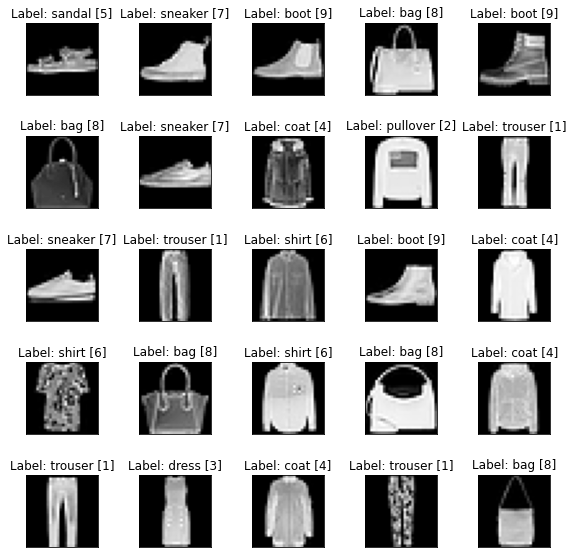

In [ ]:

label_names=['t-shirt','trouser','pullover','dress','coat','sandal','shirt',
             'sneaker','bag','boot']
fig, axs = plt.subplots(5, 5, figsize=(8,8))
for ax in axs.flatten(): 
    img, label = random.choice(test_dataset)
    ax.imshow(np.array(img)[0], cmap='gist_gray')
    ax.set_title(f'Label: {label_names[label]} [{label}]')
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

In [ ]:
# Remove the hooks using the handles saved during the hooks definition
for handle in hook_handles:
  handle.remove()

In [ ]:
# Hook function to call during forward pass (extract second last layer features)
def hook_feature_space(module, input, output):
    feature_space.append(output) # feature_space must be a list defined before evaluating the network output

# Attach the hook function to layer classifier[5]
hook_handle = trf_net.register_forward_hook(hook_feature_space)

In [ ]:
feature_space = [] # This list will be filled by the feature space values

### Analyze all the test samples
test_outputs, test_labels, test_loss = test_epoch(
    net=trf_net,
    device=device, 
    dataloader=test_dataloader, 
    loss_fn=loss_fn)

# Concatenate all the features in a single tensor
feature_space = torch.cat(feature_space)

100%|██████████| 40/40 [00:00<00:00, 56.93it/s]


In [ ]:
print(feature_space.shape)

torch.Size([10000, 10])


In [ ]:
feature_space = feature_space.cpu()
test_labels   = test_labels.cpu()
test_outputs  = test_outputs.cpu()

In [ ]:
### t-SNE embedding of the dataset (t-distributed Stochastic Neighbor Embedding)
print("Computing t-SNE embedding")
tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
feature_space_tsne = tsne.fit_transform(feature_space)

Computing t-SNE embedding


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [ ]:
# Dictionary containing the mapping from label name to ID
label_to_id = {
  't-shirt': 0,
  'trouser': 1,
  'pullover': 2,
  'dress': 3,
  'coat' : 4,
  'sandal': 5,
  'shirt' : 6,
  'sneaker' : 7,
  'bag' :      8,
  'boot' : 9
}
# Dictionary containing the mapping from ID to label name
id_to_label = {id: label for label, id in label_to_id.items()}

print('label_to_id =', label_to_id)
print('id_to_label =', id_to_label)

label_to_id = {'t-shirt': 0, 'trouser': 1, 'pullover': 2, 'dress': 3, 'coat': 4, 'sandal': 5, 'shirt': 6, 'sneaker': 7, 'bag': 8, 'boot': 9}
id_to_label = {0: 't-shirt', 1: 'trouser', 2: 'pullover', 3: 'dress', 4: 'coat', 5: 'sandal', 6: 'shirt', 7: 'sneaker', 8: 'bag', 9: 'boot'}


In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(feature_space_tsne)
df['label'] = test_labels
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,67.933357,6.329213,9,boot
1,-57.316746,-47.178234,2,pullover
2,-41.271675,82.865578,1,trouser
3,-31.511438,91.396576,1,trouser
4,-16.728661,-15.470138,6,shirt
...,...,...,...,...
9995,81.140228,10.022400,9,boot
9996,-20.515228,58.211643,1,trouser
9997,9.259926,-24.936649,8,bag
9998,-16.991013,65.442085,1,trouser


In [ ]:
### t-SNE Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

### Isomap embedding

In [ ]:
### Isomap embedding of the dataset
print("Computing Isomap")
isomap = manifold.Isomap(n_components=2)
feature_space_isomap = isomap.fit_transform(feature_space)

Computing Isomap


In [ ]:
print(f"FEATURE SPACE SHAPE: {feature_space.shape}")
print(f"FEATURE SPACE SHAPE (Isomap): {feature_space_isomap.shape}")

FEATURE SPACE SHAPE: torch.Size([10000, 10])
FEATURE SPACE SHAPE (Isomap): (10000, 2)


In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(feature_space_isomap)
df['label'] = test_labels
df['label_name'] = df.label.apply(lambda l: id_to_label[l])

In [ ]:
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

# Variational autoencoder

In [ ]:
class Encoder(nn.Module):

  def __init__(self, enc_dim=2):

    super().__init__()

    # Convolutional section
    self.conv1 = nn.Conv2d(1, 8, kernel_size=5, padding=1, stride=2) # out shape: 8x13x13
    self.conv2 = nn.Conv2d(8, 16, kernel_size=3, padding=1, stride=2) # out shape: 16x7x7

    # Linear section
    self.latent_mu = nn.Linear(16*7*7, enc_dim)
    self.latent_logvar = nn.Linear(16*7*7, enc_dim)

    print('Encoder initialized')
        
  def forward(self, x):

    # Convolutions
    x = F.relu(self.conv1(x))
    x = F.relu(self.conv2(x))

    # Flatten
    x = x.view(x.size(0), -1)
    
    # Linear
    mu = self.latent_mu(x)
    logvar = self.latent_logvar(x)

    return mu, logvar

class Decoder(nn.Module):
    
  def __init__(self, enc_dim=2):
      
    super().__init__()

    # Linear section
    self.fc1 = nn.Linear(enc_dim, 16*7*7)

    # Convolutional section
    self.conv2 = nn.ConvTranspose2d(16, 8, kernel_size=3, padding=1, stride=2)
    self.conv1 = nn.ConvTranspose2d(8, 1, kernel_size=5, padding=1, output_padding=1, stride=2)

    print('Decoder initialized')
      
  def forward(self, x):

    # Linear
    x = F.relu(self.fc1(x))

    # Unflatten
    x = x.view(x.size(0), 16, 7, 7)

    # Transposed convolutions
    x = F.relu(self.conv2(x))
    x = self.conv1(x)
    ## Apply sigmoid if the reconstruction loss is going 
    ## to be computed with Binary Cross Entropy
    x = torch.sigmoid(x)

    return x

class VariationalAutoencoder(nn.Module):

    def __init__(self, enc_dim=2):

        super().__init__()

        self.encoder = Encoder(enc_dim)
        self.decoder = Decoder(enc_dim)
        self.enc_dim = enc_dim
    
    def forward(self, x):

        latent_mu, latent_logvar = self.encoder(x)
        latent_img = self.latent_sample(latent_mu, latent_logvar)
        x_hat = self.decoder(latent_img)

        return x_hat, latent_mu, latent_logvar
    
    def latent_sample(self, mu, logvar):

        if self.training:

          # Reparameterization trick
          std = torch.exp(torch.mul(logvar, 0.5))
          epsilon = torch.normal(torch.zeros(self.enc_dim), torch.ones(self.enc_dim))
          epsilon = epsilon.to(device)

          # torch.mul(a,b) => elementwise multiplication
          z = torch.add(torch.mul(epsilon, std), mu)

          return z

        else:

            return mu

In [ ]:
vae = VariationalAutoencoder(enc_dim=8)

# Check if the GPU is available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f'Training device: {device}')

vae = vae.to(device)

num_params = sum(p.numel() for p in vae.parameters() if p.requires_grad)
print(f'\nNumber of parameters: {num_params}')

img_batch, label_batch = next(iter(test_dataloader))
img_batch = img_batch.to(device)
print(f'\nOriginal image shape: {img_batch.shape}')
rec_img_batch, mu_batch, sigma_batch = vae(img_batch)
print(f'Reconstructed image shape: {rec_img_batch.shape}')
print(f'Latent mu shape: {mu_batch.shape}')
print(f'Latent sigma shape: {sigma_batch.shape}')

Encoder initialized

Decoder initialized

Training device: cpu

Number of parameters: 22353

Original image shape: torch.Size([256, 1, 28, 28])

Reconstructed image shape: torch.Size([256, 1, 28, 28])

Latent mu shape: torch.Size([256, 8])

Latent sigma shape: torch.Size([256, 8])

In [ ]:
def compute_loss(img, rec_img, mu, logvar):

  # Important to use reduction='sum' because otherwise the two values differ for a 
  # high order of magnitude, and the minimization does not work well
    
  rec_loss = F.binary_cross_entropy(rec_img.view(-1, 784), img.view(-1, 784), reduction='sum')
  #rec_loss = F.mse_loss(rec_img, img, reduction='sum')
  
  kl_loss = -0.5 * torch.sum(1 + logvar - torch.exp(logvar) - torch.pow(mu, 2))
  
  return rec_loss + kl_loss

In [ ]:
loss = compute_loss(img_batch, rec_img_batch, mu_batch, sigma_batch)
print(loss)

tensor(133481.0469, grad_fn=<AddBackward0>)

In [ ]:
def training_epoch(vae, device, dataloader, optimizer):
  """
  vae - variational autoencoder
  device - device where to perform the training (cpu or cuda)
  dataloader - training set
  optimizer - optimizer
  """

  train_loss = []

  # Ignore the label (unsupervised learning)
  for img_batched, _ in dataloader:

    # Move data to device
    x_batched = img_batched.to(device)

    # Forward step
    x_rec, mu, sigma = vae(x_batched)

    # Compute loss
    loss = compute_loss(x_batched, x_rec, mu, sigma)

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()

    # Update the weights
    optimizer.step()

    # Save train loss for this batch
    loss_batch = loss.detach().cpu().numpy()
    train_loss.append(loss_batch)

  # Return average training loss for this epoch
  return np.mean(train_loss)

In [ ]:
def testing_epoch(vae, device, dataloader):
  """
  vae - variational autoencoder
  device - device where to perform the training (cpu or cuda)
  dataloader - test or validation set
  """

  test_loss = []

  # Disable gradient tracking
  with torch.no_grad():

    # Ignore the label
    for img_batched, _ in dataloader:

      # Move data to device
      x_batched = img_batched.to(device)

      # Forward step
      x_rec, mu, sigma = vae(x_batched)

       # Compute loss
      loss = compute_loss(x_batched, x_rec, mu, sigma)

      # Save test loss for this batch
      loss_batch = loss.detach().cpu().numpy()
      test_loss.append(loss_batch)
      
  # Return average test loss for this epoch
  return np.mean(test_loss)

In [ ]:
def visualize_image(img, rec_img, epoch):

  fig, ax = plt.subplots(1, 2, figsize=(6,3))

  ax[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
  ax[0].set_title('Original')
  ax[0].axis('off')

  ax[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
  ax[1].set_title(f'Reconstructed (EPOCH {epoch+1})')
  ax[1].axis('off')

  plt.tight_layout()
  plt.pause(0.1)
  plt.show()
  plt.close()

In [ ]:
print('\033[93m' + 'output')

[93moutput

[92m---------------------------------------[00m

Training device: cpu

======[95mLatent space dimension: 8

======[96mLearning rate: 0.0001

======[97mWeight decay: 1e-06

======[94mDropout probability: 0.01

Encoder initialized

Decoder initialized

.........EPOCH 1/100

Training loss: 146141.4688

Test loss: 141296.5469

Elapsed time: 14.2222 seconds

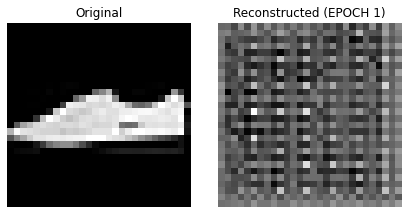

.........EPOCH 2/100

Training loss: 136450.7656

Test loss: 123407.4766

Elapsed time: 28.6692 seconds

.........EPOCH 3/100

Training loss: 119040.0000

Test loss: 110918.3984

Elapsed time: 42.7958 seconds

.........EPOCH 4/100

Training loss: 110564.0391

Test loss: 104781.2656

Elapsed time: 56.9303 seconds

.........EPOCH 5/100

Training loss: 104535.2344

Test loss: 98652.4844

Elapsed time: 71.0633 seconds

.........EPOCH 6/100

Training loss: 98371.9141

Test loss: 93019.6406

Elapsed time: 85.1826 seconds

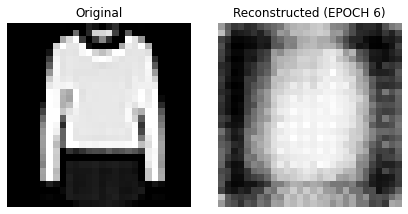

.........EPOCH 7/100

Training loss: 93287.4922

Test loss: 88930.0781

Elapsed time: 99.6658 seconds

.........EPOCH 8/100

Training loss: 89786.0625

Test loss: 86115.3984

Elapsed time: 113.8741 seconds

.........EPOCH 9/100

Training loss: 87099.0781

Test loss: 83761.2031

Elapsed time: 127.9743 seconds

.........EPOCH 10/100

Training loss: 85109.5547

Test loss: 82121.3516

Elapsed time: 142.6088 seconds

.........EPOCH 11/100

Training loss: 83453.4531

Test loss: 80654.1797

Elapsed time: 157.1401 seconds

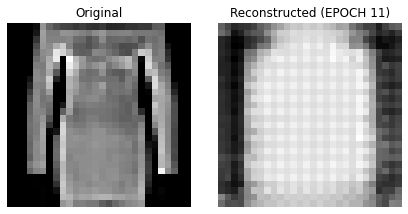

.........EPOCH 12/100

Training loss: 82131.2656

Test loss: 79158.0391

Elapsed time: 172.1267 seconds

.........EPOCH 13/100

Training loss: 80596.5391

Test loss: 77652.2969

Elapsed time: 187.0636 seconds

.........EPOCH 14/100

Training loss: 79200.5312

Test loss: 76368.2422

Elapsed time: 203.1238 seconds

.........EPOCH 15/100

Training loss: 77886.6797

Test loss: 75271.3594

Elapsed time: 218.3176 seconds

.........EPOCH 16/100

Training loss: 76848.7734

Test loss: 74178.1719

Elapsed time: 232.9873 seconds

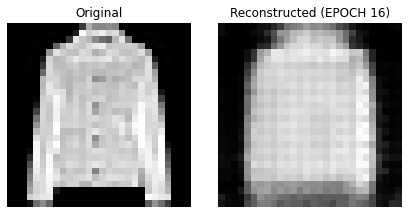

.........EPOCH 17/100

Training loss: 75755.1016

Test loss: 73253.6406

Elapsed time: 247.7048 seconds

.........EPOCH 18/100

Training loss: 74929.3828

Test loss: 72343.6562

Elapsed time: 262.5123 seconds

.........EPOCH 19/100

Training loss: 74128.3281

Test loss: 71757.2969

Elapsed time: 277.3907 seconds

.........EPOCH 20/100

Training loss: 73464.9062

Test loss: 71025.9375

Elapsed time: 292.0266 seconds

.........EPOCH 21/100

Training loss: 72825.9219

Test loss: 70362.2344

Elapsed time: 306.6382 seconds

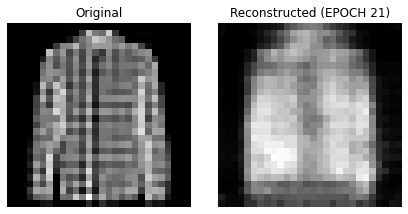

.........EPOCH 22/100

Training loss: 72395.3750

Test loss: 70083.0156

Elapsed time: 321.6811 seconds

.........EPOCH 23/100

Training loss: 71898.0078

Test loss: 69729.2109

Elapsed time: 336.6704 seconds

.........EPOCH 24/100

Training loss: 71667.1953

Test loss: 69315.6094

Elapsed time: 351.3797 seconds

.........EPOCH 25/100

Training loss: 71261.9375

Test loss: 69092.6719

Elapsed time: 366.0565 seconds

.........EPOCH 26/100

Training loss: 71115.5547

Test loss: 69019.6016

Elapsed time: 380.7675 seconds

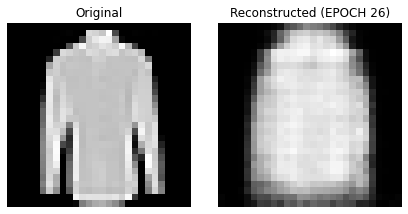

.........EPOCH 27/100

Training loss: 70764.0391

Test loss: 68633.1719

Elapsed time: 395.8300 seconds

.........EPOCH 28/100

Training loss: 70584.9922

Test loss: 68401.4922

Elapsed time: 410.4248 seconds

.........EPOCH 29/100

Training loss: 70329.6562

Test loss: 68584.3281

Elapsed time: 425.2917 seconds

.........EPOCH 30/100

Training loss: 70217.1094

Test loss: 68269.2969

Elapsed time: 440.1198 seconds

.........EPOCH 31/100

Training loss: 70007.8281

Test loss: 67886.6016

Elapsed time: 454.7772 seconds

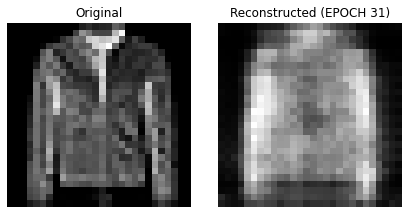

.........EPOCH 32/100

Training loss: 69884.8281

Test loss: 67730.2656

Elapsed time: 469.6228 seconds

.........EPOCH 33/100

Training loss: 69738.4141

Test loss: 67504.6875

Elapsed time: 484.2775 seconds

.........EPOCH 34/100

Training loss: 69700.9453

Test loss: 67533.1719

Elapsed time: 499.3045 seconds

.........EPOCH 35/100

Training loss: 69414.8750

Test loss: 67447.4609

Elapsed time: 514.2096 seconds

.........EPOCH 36/100

Training loss: 69308.5625

Test loss: 67222.7031

Elapsed time: 529.1831 seconds

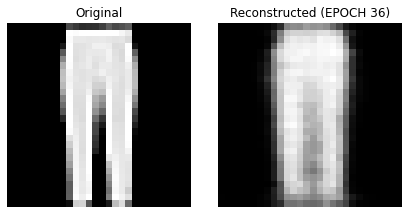

.........EPOCH 37/100

Training loss: 69198.8047

Test loss: 67158.9609

Elapsed time: 544.2266 seconds

.........EPOCH 38/100

Training loss: 69059.1797

Test loss: 67062.4844

Elapsed time: 558.9865 seconds

.........EPOCH 39/100

Training loss: 68960.0391

Test loss: 66882.9844

Elapsed time: 573.9463 seconds

.........EPOCH 40/100

Training loss: 68886.8672

Test loss: 66809.2656

Elapsed time: 588.5258 seconds

.........EPOCH 41/100

Training loss: 68703.9219

Test loss: 66610.0156

Elapsed time: 603.0945 seconds

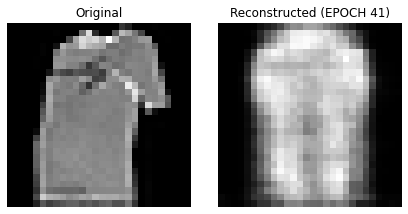

.........EPOCH 42/100

Training loss: 68670.9141

Test loss: 66698.1406

Elapsed time: 618.0800 seconds

.........EPOCH 43/100

Training loss: 68549.3750

Test loss: 66439.5391

Elapsed time: 632.9431 seconds

.........EPOCH 44/100

Training loss: 68453.4766

Test loss: 66292.1250

Elapsed time: 647.7967 seconds

.........EPOCH 45/100

Training loss: 68434.5938

Test loss: 66446.8281

Elapsed time: 662.6295 seconds

.........EPOCH 46/100

Training loss: 68315.8750

Test loss: 66260.8594

Elapsed time: 677.2230 seconds

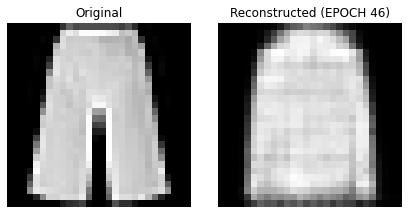

.........EPOCH 47/100

Training loss: 68219.3750

Test loss: 66128.5391

Elapsed time: 692.0150 seconds

.........EPOCH 48/100

Training loss: 68119.6797

Test loss: 66062.2578

Elapsed time: 706.9136 seconds

.........EPOCH 49/100

Training loss: 68146.5391

Test loss: 66216.5391

Elapsed time: 721.6913 seconds

.........EPOCH 50/100

Training loss: 68111.8047

Test loss: 66017.8203

Elapsed time: 736.3768 seconds

.........EPOCH 51/100

Training loss: 68006.9375

Test loss: 66131.8672

Elapsed time: 751.0430 seconds

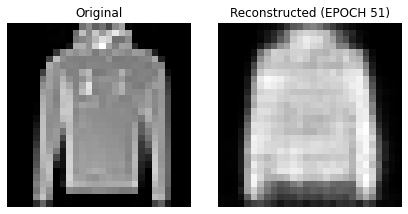

.........EPOCH 52/100

Training loss: 67824.8750

Test loss: 65775.5547

Elapsed time: 766.2533 seconds

.........EPOCH 53/100

Training loss: 67879.0781

Test loss: 65852.9844

Elapsed time: 781.1316 seconds

.........EPOCH 54/100

Training loss: 67740.7656

Test loss: 65838.6016

Elapsed time: 796.3466 seconds

.........EPOCH 55/100

Training loss: 67759.6719

Test loss: 65760.2969

Elapsed time: 811.3410 seconds

.........EPOCH 56/100

Training loss: 67649.8828

Test loss: 65635.3594

Elapsed time: 826.1575 seconds

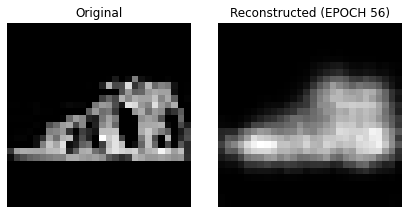

.........EPOCH 57/100

Training loss: 67620.2734

Test loss: 65558.8047

Elapsed time: 840.9745 seconds

.........EPOCH 58/100

Training loss: 67509.7578

Test loss: 65827.8125

Elapsed time: 855.8440 seconds

.........EPOCH 59/100

Training loss: 67526.5391

Test loss: 65579.4375

Elapsed time: 870.8388 seconds

.........EPOCH 60/100

Training loss: 67430.1875

Test loss: 65333.2734

Elapsed time: 885.3060 seconds

.........EPOCH 61/100

Training loss: 67392.4062

Test loss: 65336.6875

Elapsed time: 899.9071 seconds

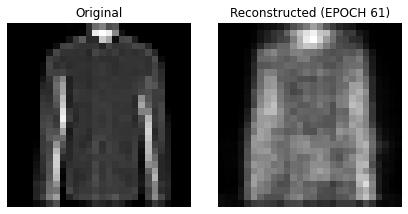

.........EPOCH 62/100

Training loss: 67372.3281

Test loss: 65511.7734

Elapsed time: 914.7297 seconds

.........EPOCH 63/100

Training loss: 67355.6953

Test loss: 65315.5391

Elapsed time: 929.6204 seconds

.........EPOCH 64/100

Training loss: 67254.7578

Test loss: 65562.6641

Elapsed time: 944.2000 seconds

.........EPOCH 65/100

Training loss: 67280.4219

Test loss: 65261.2383

Elapsed time: 958.5169 seconds

.........EPOCH 66/100

Training loss: 67133.8516

Test loss: 65192.5820

Elapsed time: 972.7767 seconds

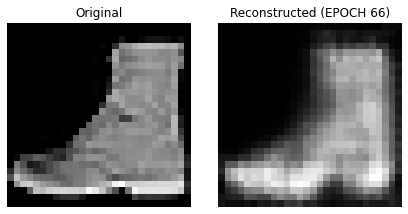

.........EPOCH 67/100

Training loss: 67170.3906

Test loss: 65178.5508

Elapsed time: 987.3927 seconds

.........EPOCH 68/100

Training loss: 67111.5391

Test loss: 65063.3203

Elapsed time: 1001.8119 seconds

.........EPOCH 69/100

Training loss: 67052.3750

Test loss: 65157.9766

Elapsed time: 1016.2564 seconds

.........EPOCH 70/100

Training loss: 66994.9766

Test loss: 65048.4766

Elapsed time: 1030.5375 seconds

.........EPOCH 71/100

Training loss: 66894.0234

Test loss: 64850.6758

Elapsed time: 1044.7840 seconds

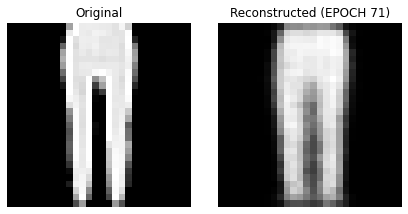

.........EPOCH 72/100

Training loss: 66822.9844

Test loss: 64824.9258

Elapsed time: 1059.2941 seconds

.........EPOCH 73/100

Training loss: 66932.5391

Test loss: 64998.0820

Elapsed time: 1073.4772 seconds

.........EPOCH 74/100

Training loss: 66898.3359

Test loss: 64832.1953

Elapsed time: 1087.8194 seconds

.........EPOCH 75/100

Training loss: 66779.6406

Test loss: 64763.2266

Elapsed time: 1102.0868 seconds

.........EPOCH 76/100

Training loss: 66678.5781

Test loss: 64678.7891

Elapsed time: 1116.3839 seconds

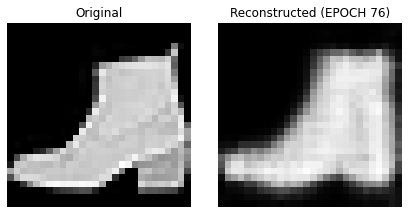

.........EPOCH 77/100

Training loss: 66725.8281

Test loss: 64674.1016

Elapsed time: 1130.8445 seconds

.........EPOCH 78/100

Training loss: 66719.1172

Test loss: 64819.0391

Elapsed time: 1145.1512 seconds

.........EPOCH 79/100

Training loss: 66665.0391

Test loss: 64701.6133

Elapsed time: 1159.4756 seconds

.........EPOCH 80/100

Training loss: 66643.2109

Test loss: 64704.7109

Elapsed time: 1173.9178 seconds

.........EPOCH 81/100

Training loss: 66560.3594

Test loss: 64668.1641

Elapsed time: 1188.1894 seconds

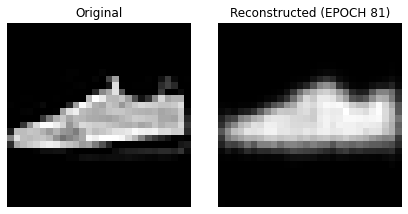

.........EPOCH 82/100

Training loss: 66603.3125

Test loss: 64647.4258

Elapsed time: 1202.7038 seconds

.........EPOCH 83/100

Training loss: 66507.3594

Test loss: 64509.8125

Elapsed time: 1216.8004 seconds

.........EPOCH 84/100

Training loss: 66501.7578

Test loss: 64619.4258

Elapsed time: 1231.0274 seconds

.........EPOCH 85/100

Training loss: 66547.1562

Test loss: 64635.1328

Elapsed time: 1245.1590 seconds

.........EPOCH 86/100

Training loss: 66462.5625

Test loss: 64473.0195

Elapsed time: 1259.3605 seconds

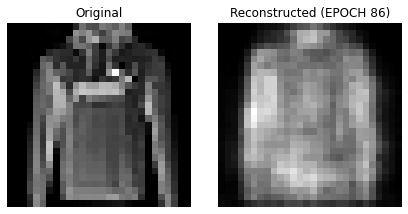

.........EPOCH 87/100

Training loss: 66399.7969

Test loss: 64571.8125

Elapsed time: 1273.8518 seconds

.........EPOCH 88/100

Training loss: 66372.1016

Test loss: 64280.5000

Elapsed time: 1288.0493 seconds

.........EPOCH 89/100

Training loss: 66371.4766

Test loss: 64426.6250

Elapsed time: 1302.2205 seconds

.........EPOCH 90/100

Training loss: 66288.8906

Test loss: 64322.8984

Elapsed time: 1316.2441 seconds

.........EPOCH 91/100

Training loss: 66365.5547

Test loss: 64330.1875

Elapsed time: 1330.3727 seconds

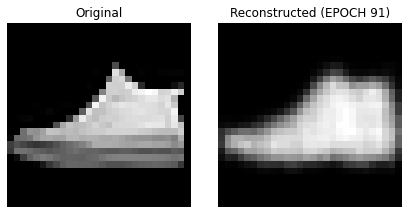

.........EPOCH 92/100

Training loss: 66314.3594

Test loss: 64397.6562

Elapsed time: 1344.7488 seconds

.........EPOCH 93/100

Training loss: 66223.7578

Test loss: 64253.7422

Elapsed time: 1358.9342 seconds

.........EPOCH 94/100

Training loss: 66220.1562

Test loss: 64410.6367

Elapsed time: 1373.0257 seconds

.........EPOCH 95/100

Training loss: 66164.5312

Test loss: 64450.4297

Elapsed time: 1387.1616 seconds

.........EPOCH 96/100

Training loss: 66158.7656

Test loss: 64174.4805

Elapsed time: 1401.3697 seconds

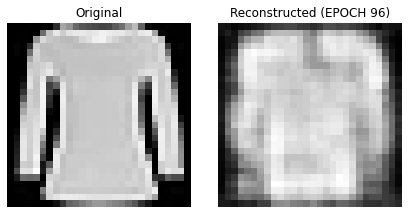

.........EPOCH 97/100

Training loss: 66099.8828

Test loss: 64213.7305

Elapsed time: 1415.7452 seconds

.........EPOCH 98/100

Training loss: 66180.9922

Test loss: 64164.9375

Elapsed time: 1429.9070 seconds

.........EPOCH 99/100

Training loss: 66092.9688

Test loss: 64087.9609

Elapsed time: 1443.9189 seconds

.........EPOCH 100/100

Training loss: 66023.6094

Test loss: 64041.1641

Elapsed time: 1457.9819 seconds

Final training loss: 66023.6094

Final test loss: 64041.1641

Elapsed time: 1457.9899 seconds

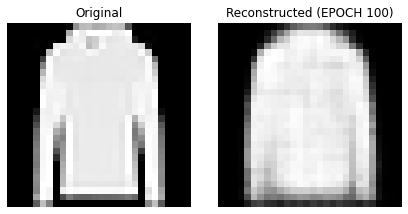

================END================

---------------------------------------

In [ ]:
print('\033[92m---------------------------------------\033[00m')

start = time.time()

# Check if the GPU is available
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f'Training device: {device}')

# Hyperparameters
latent_dim = 8
l_rate = 1e-4
w_decay = 1e-6
p_dropout = 0.01

# Print current configuration
print(f'======\033[95mLatent space dimension: {latent_dim}')
print(f'======\033[96mLearning rate: {l_rate}')
print(f'======\033[97mWeight decay: {w_decay}')
print(f'======\033[94mDropout probability: {p_dropout}\n')

# Initialize the variational autoencoder and move it to the device
vae = VariationalAutoencoder(enc_dim=latent_dim)
vae.to(device)

# Define the optimizer
opt = optim.Adam(vae.parameters(), lr=l_rate, weight_decay=w_decay)

# Lists to plot the trend of training and test losses
train_losses = []
test_losses = []

epochs = 100

# Training loop
for e in range(0, epochs):

  print(f'.........EPOCH {e+1}/{epochs}')

  # Train
  vae.train()
  train_loss = training_epoch(
      vae=vae,
      device=device,
      dataloader=train_dataloader,
      optimizer=opt
  )
  train_losses.append(train_loss)

  # Validate
  vae.eval()
  test_loss = testing_epoch(
      vae=vae,
      device=device,
      dataloader=test_dataloader
  )
  test_losses.append(test_loss)

  # Print progress
  print(f'Training loss: {train_loss:.4f}')
  print(f'Test loss: {test_loss:.4f}')
  end = time.time()
  print(f'Elapsed time: {end-start:.4f} seconds')

  if e % 5 == 0:

    # Plot progress: get the output of a random image at each epoch
    idx = np.random.randint(0, len(test_dataset))
    img = test_dataset[idx][0].unsqueeze(0).to(device)

    vae.eval() 

    with torch.no_grad():

      rec_img, mu, sigma = vae(img)
      visualize_image(img, rec_img, e)

# Final information
print(f'Final training loss: {train_losses[-1]:.4f}')
print(f'Final test loss: {test_losses[-1]:.4f}')
end = time.time()
print(f'Elapsed time: {end-start:.4f} seconds')

idx = np.random.randint(0, len(test_dataset))
img = test_dataset[idx][0].unsqueeze(0).to(device)

vae.eval() 

with torch.no_grad():

  rec_img, mu, sigma = vae(img)
  visualize_image(img, rec_img, e)

print('================END================')
print('---------------------------------------')

# Save the model
vae_state_dict = vae.state_dict()
torch.save(vae_state_dict, 'VAE_autoencoder.torch')

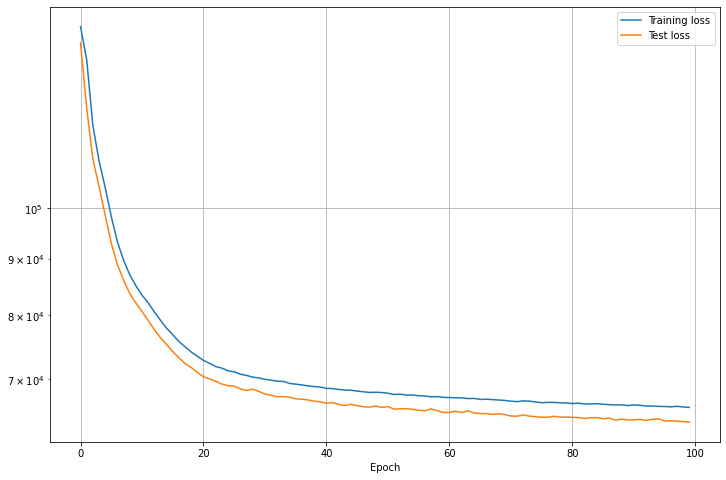

In [ ]:
# Plot training and test losses
plt.figure(figsize=(12,8))

plt.semilogy(range(epochs), train_losses, label='Training loss')
plt.semilogy(range(epochs), test_losses, label='Test loss')

plt.xlabel('Epoch')
plt.legend()
plt.grid()
plt.show()

## Latent space exploration

In [ ]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
latent_dim = 8

vae = VariationalAutoencoder(enc_dim=latent_dim)
vae.load_state_dict(torch.load('VAE_autoencoder.torch'))
vae.to(device)

Encoder initialized

Decoder initialized

VariationalAutoencoder(
  (encoder): Encoder(
    (conv1): Conv2d(1, 8, kernel_size=(5, 5), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (latent_mu): Linear(in_features=784, out_features=8, bias=True)
    (latent_logvar): Linear(in_features=784, out_features=8, bias=True)
  )
  (decoder): Decoder(
    (fc1): Linear(in_features=8, out_features=784, bias=True)
    (conv2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv1): ConvTranspose2d(8, 1, kernel_size=(5, 5), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

<Figure size 432x288 with 0 Axes>

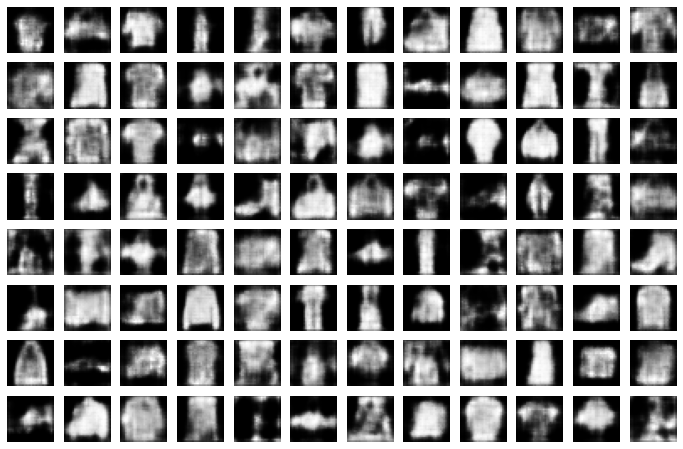

In [ ]:
plt.subplots_adjust()

vae.eval()

with torch.no_grad():

  # Sample from normal distribution
  latents = torch.randn(12*8, latent_dim)

  # Generate images using the decoder
  imgs = vae.decoder(latents.to(device)).cpu()

fig, ax = plt.subplots(8, 12, figsize=(12, 8))
index = 0
for i in range(8):
  for j in range(12):
    ax[i, j].imshow(imgs[index].squeeze().numpy(), cmap='gist_gray')
    ax[i, j].axis('off')
    index = index+1

plt.show()

## λ

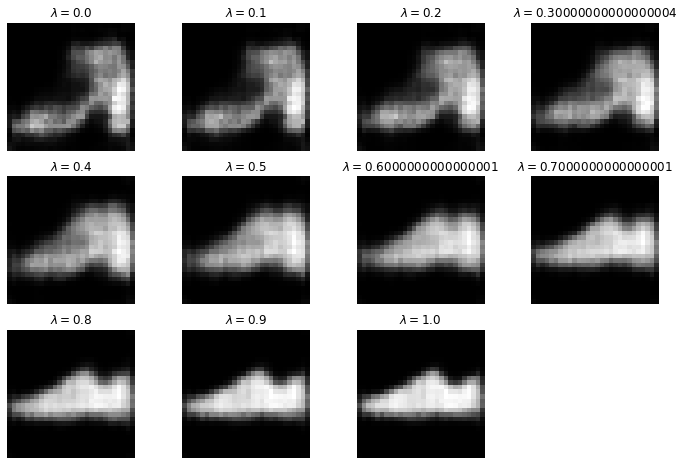

In [ ]:
vae.eval()

# Take two different images
idx1 = np.random.randint(0, len(test_dataset))
img1, lab1 = test_dataset[idx1]
idx2 = np.random.randint(0, len(test_dataset))
img2, lab2 = test_dataset[idx2]
while lab1 == lab2:
  idx2 = np.random.randint(0, len(test_dataset))
  img2, lab2 = test_dataset[idx2]

# Labda factors
lambdas = [l*.1 for l in range(11)]

# Encode the images
enc_1, _ = vae.encoder(img1.unsqueeze(0).to(device))
enc_2, _ = vae.encoder(img2.unsqueeze(0).to(device))

# Combine and plot
fig, ax = plt.subplots(3, 4, figsize=(12, 8))
ax = ax.ravel()

for ind, l in enumerate(lambdas):

  comb = (1-l)*enc_1 + l*enc_2
  dec = vae.decoder(comb).squeeze().cpu().detach().numpy()
  ax[ind].imshow(dec, cmap='gist_gray')
  ax[ind].set_title(f'$\lambda={l}$')
  ax[ind].axis('off')

ax[-1].axis('off')
plt.show()

In [ ]:
vae.eval()

# Take two different images
idx1 = np.random.randint(0, len(test_dataset))
img1, lab1 = test_dataset[idx1]
idx2 = np.random.randint(0, len(test_dataset))
img2, lab2 = test_dataset[idx2]
while lab1 == lab2:
  idx2 = np.random.randint(0, len(test_dataset))
  img2, lab2 = test_dataset[idx2]

# Labda factors
lambdas = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

# Encode the images
enc_1, _ = vae.encoder(img1.unsqueeze(0).to(device))
enc_2, _ = vae.encoder(img2.unsqueeze(0).to(device))

# Combine and plot
fig, ax = plt.subplots(3, 4, figsize=(12, 8))
ax = ax.ravel()

for ind, l in enumerate(lambdas):

  comb = (1-l)*enc_1 + l*enc_2
  dec = vae.decoder(comb).squeeze().cpu().detach().numpy()
  ax[ind].imshow(dec, cmap='gist_gray')
  ax[ind].set_title(f'$\lambda={l}$')
  ax[ind].axis('off')

ax[-1].axis('off')
plt.show()

### Latent variable sliding

In [ ]:
# Encode the images
encoded_images = []
labels = []

vae.eval()
with torch.no_grad():

    for img_batched, label_batched in test_dataloader:

      # Move data to device
      x_batched = img_batched.to(device)

      # Encode
      x_batched_encoded, _ = vae.encoder(x_batched)

      encoded_images.append(x_batched_encoded)
      labels.append(label_batched)

encoded_images = torch.cat(encoded_images)
labels = torch.cat(labels)

# Prepare dataframe for plotting
df = pd.DataFrame(encoded_images)
df['label'] = labels

In [ ]:
fig = px.scatter(df, x=0, y=1, color='label', hover_data=[df.index])
fig.show()

In [ ]:
fig = px.scatter(df, x=0, y=1,  color=[label_names[l] for l in labels.numpy()])
fig.show()

In [ ]:
type(labels.numpy())torch_tensor.cpu().detach().numpy()

numpy.ndarray

In [ ]:
tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_images)


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



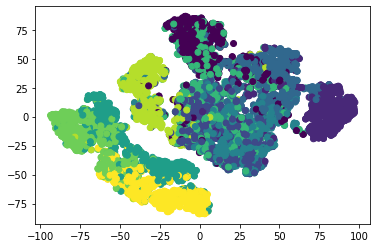

In [ ]:
plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=labels.numpy())

In [ ]:
px.scatter(encoded_images[:,0], encoded_samples_reduced_TSNE[:,1],  color=[label_names[l] for l in labels.numpy()], opacity=0.7)

## High-level and Lightweight PyTorch wrapper: PyTorch Lightning

In [56]:
to_tensor = torchvision.transforms.Compose([ torchvision.transforms.ToTensor(), ])


norm_transf = torchvision.transforms.Compose( [torchvision.transforms.ToTensor(),torchvision.transforms.Normalize((0.3256265724649235,), (.401880278354041,))] )

                                               


rotation_45 = torchvision.transforms.RandomRotation(45)
gauss_noise = torchvision.transforms.GaussianBlur(5)
choose_tran = torchvision.transforms.RandomChoice([rotation_45, gauss_noise])

transformation = torchvision.transforms.Compose( [ choose_tran, norm_transf] )

In [57]:
train_dataset = torchvision.datasets.FashionMNIST('dataset', train=True, download=True, transform=to_tensor)
test_dataset  = torchvision.datasets.FashionMNIST('dataset', train=False, download=True, transform=to_tensor)

In [58]:
loss_func = nn.MSELoss()

In [59]:
class Lit_AutoEncoder_Net(pl.LightningModule):

    def __init__(self, trial):

        super().__init__()
        
        # optuna functionality for selecting initial value.                                                                  
        encoded_space_dim = trial.suggest_int('encoded_space_dim', 2, 100)
        n_channels = trial.suggest_int('n_channels', 4, 10)
        
        self.trial = trial
        
        # Encoder part
        self.encoder = nn.Sequential( # First convolutional layer
                                      # 28x28 ========> 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # 15x15 ========> 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      #   8x8 ========> 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      nn.Linear(36*n_channels, 64),
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                      
                                    )
        # Decoder part
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units =  = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       #  3x3  =========> 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       #  7x7  =========> 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, output_padding=1, padding=1, stride=2),      
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       #  14x14 =========> 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, output_padding=1, padding=1, stride=2),
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = self.loss_func(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        opt = self.trial.suggest_categorical('optimizer', ['sgd', 'Adam'])
        lr  = self.trial.suggest_loguniform('learning_rate', 1e-5, 5e-3)
        wd  = self.trial.suggest_loguniform('weight_decay', 1e-6, 1e-4)
        mom = self.trial.suggest_uniform('momentum', 0.6, 1.)
        if opt=='sgd':
            optimizer = torch.optim.SGD(self.parameters(), lr=lr, momentum=mom, weight_decay=wd)
        elif opt=='Adam':
            optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
            
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

In [60]:
class MetricsCallback(Callback):
    '''
    To return losses and other metrics logged during training and validation.
    '''

    def __init__(self):
        super().__init__()
        self.metrics = []

    def on_validation_end(self, trainer, pl_module):
        self.metrics.append(trainer.callback_metrics)

## Optuna hyperparameter optimization

In [61]:
def objective(trial):
    # Function to optimize from optuna
    checkpoint_callback = pl.callbacks.ModelCheckpoint(
        os.path.join(PATH, "trial_{}".format(trial.number)), monitor="valid_loss" )

    metrics_callback = MetricsCallback()
    
    trainer = pl.Trainer( logger=False,
                          checkpoint_callback=checkpoint_callback,
                          max_epochs=30,
                          gpus=-1 if torch.cuda.is_available() else None,
                          callbacks=[ metrics_callback, 
                                      PyTorchLightningPruningCallback(trial, monitor="valid_loss")],
                         )

    model = Lit_AutoEncoder_Net(trial)
    trainer.fit(model, train_load, valid_load)
    
    return metrics_callback.metrics[-1]["valid_loss"].item()

In [62]:
def objective(trial):
    # Function to optimize from optuna
    checkpoint_callback = pl.callbacks.ModelCheckpoint(
        os.path.join(PATH, "trial_{}".format(trial.number)), monitor="valid_loss" )

    metrics_callback = MetricsCallback()
    
    trainer = pl.Trainer( logger=False,
                          checkpoint_callback=checkpoint_callback,
                          max_epochs=30,
                          gpus=-1 if torch.cuda.is_available() else None,
                          callbacks=[ metrics_callback, 
                                      PyTorchLightningPruningCallback(trial, monitor="valid_loss")],
                         )

    model = Lit_AutoEncoder_Net(trial)
    trainer.fit(model, train_load, valid_load)
    
    return metrics_callback.metrics[-1]["valid_loss"].item()

## Optuna tuner

In [63]:
pruner = optuna.pruners.MedianPruner()
study = optuna.create_study(direction="minimize", pruner=pruner)
joblib.dump(study, "optimize_hyperparams.pkl")

study.enqueue_trial({'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 
                     'learning_rate': 1e-3, 'weight_decay': 1e-5, 'momentum': 0.9})# select starting point

study.optimize(objective, n_trials=10, timeout=None)

[I 2022-02-03 23:09:44,567] A new study created in memory with name: no-name-0c5a228e-7259-4f1b-bcd0-ca24a01b3279
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: ExperimentalWarning:

enqueue_trial is experimental (supported from v1.2.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/optuna/study/study.py:857: ExperimentalWarning:

create_trial is experimental (supported from v2.0.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/optuna/study/study.py:857: ExperimentalWarning:

add_trial is experimental (supported from v2.0.0). The interface can change in the future.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dcad20990>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:22:12,204] Trial 0 finished with value: 0.014762910082936287 and parameters: {'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 0.001, 'weight_decay': 1e-05, 'momentum': 0.9}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca908bd0>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca908bd0>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.5 K
1 | decoder   | Sequential | 15.6 K
2 | loss_f

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:28:59,075] Trial 1 finished with value: 0.12498760968446732 and parameters: {'encoded_space_dim': 73, 'n_channels': 4, 'optimizer': 'sgd', 'learning_rate': 0.0003695706015327833, 'weight_decay': 1.6333275068898815e-06, 'momentum': 0.9150130003823997}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca84dd10>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca84dd10>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 19.1 K


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:37:18,290] Trial 2 finished with value: 0.015187110751867294 and parameters: {'encoded_space_dim': 29, 'n_channels': 6, 'optimizer': 'Adam', 'learning_rate': 0.00286713635016138, 'weight_decay': 5.167535260759489e-05, 'momentum': 0.6165763840481114}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dcaa70090>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dcaa70090>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 23.4 K
1

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:45:17,057] Trial 3 finished with value: 0.05179659649729729 and parameters: {'encoded_space_dim': 95, 'n_channels': 6, 'optimizer': 'Adam', 'learning_rate': 2.7849095832635973e-05, 'weight_decay': 5.009434331799615e-06, 'momentum': 0.9379872148836325}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9cbc050>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9cbc050>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 37.9 K

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:56:52,810] Trial 4 finished with value: 0.04733837768435478 and parameters: {'encoded_space_dim': 86, 'n_channels': 10, 'optimizer': 'Adam', 'learning_rate': 1.767357828939305e-05, 'weight_decay': 1.5639659943119524e-06, 'momentum': 0.9379726917220701}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9b41190>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9b41190>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 14.8 

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:58:13,148] Trial 5 pruned. Trial was pruned at epoch 4.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca4fd6d0>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dca4fd6d0>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 33.8 K
1 | decoder   | Sequential | 34.0 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
67.7 K    Trainable params
0         Non-trainable params
67.7 K    Total params
0.271     Total estimated model params size (MB)
/u

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

[I 2022-02-03 23:58:57,825] Trial 6 pruned. Trial was pruned at epoch 1.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9714c10>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9714c10>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 15.3 K
1 | decoder   | Sequential | 15.4 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
30.7 K    Trainable params
0         Non-trainable params
30.7 K    Total params
0.123     Total estimated model params size (MB)
/u

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-04 00:07:38,105] Trial 7 finished with value: 0.01983758620917797 and parameters: {'encoded_space_dim': 21, 'n_channels': 5, 'optimizer': 'Adam', 'learning_rate': 0.00036661925013142934, 'weight_decay': 5.480328185231845e-06, 'momentum': 0.6810117506864871}. Best is trial 0 with value: 0.014762910082936287.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9a24910>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc9a24910>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 34.0 K

Validation sanity check: 0it [00:00, ?it/s]

[I 2022-02-04 00:07:38,467] Trial 8 pruned. Trial was pruned at epoch 0.
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:148: LightningDeprecationWarning:

Setting `Trainer(checkpoint_callback=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc8787950>)` is deprecated in v1.5 and will be removed in v1.7. Please consider using `Trainer(enable_checkpointing=<pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint object at 0x7f2dc8787950>)`.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs

  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 30.7 K
1 | decoder   | Sequential | 30.8 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
61.5 K    Trainable params
0         Non-trainable params
61.5 K    Total params
0.246     Total estimated model params size (MB)
/u

Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/optuna/trial/_trial.py:592: UserWarning:

The reported value is ignored because this `step` 0 is already reported.



Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

[I 2022-02-04 00:18:33,229] Trial 9 finished with value: 0.01608232967555523 and parameters: {'encoded_space_dim': 97, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 0.0005488210745421048, 'weight_decay': 3.2418017812254387e-06, 'momentum': 0.9179261655129243}. Best is trial 0 with value: 0.014762910082936287.


In [64]:
trials_df = study.trials_dataframe()
trials_df.to_csv('/optuna_res.csv')

print("Number of finished trials: {}".format(len(study.trials)))

print("Trials saved to file.")

Number of finished trials: 10

Trials saved to file.

In [65]:
optuna.visualization.plot_optimization_history(study, target_name='Validation loss')

In [66]:
optuna.visualization.plot_intermediate_values(study)

In [67]:
optuna.visualization.plot_parallel_coordinate(study, target_name='Validation loss')

### Best params

In [68]:
best_trial = study.best_trial
best_params = best_trial.params

print('Best trial:')
print('Value: ', best_trial.value)

print('Best network parameters: ')
for key, value in best_params.items():
    print(f'    {key}: {value}')


Best trial:

Value:  0.014762910082936287

Best network parameters:

encoded_space_dim: 14

n_channels: 8

optimizer: Adam

learning_rate: 0.001

weight_decay: 1e-05

momentum: 0.9

In [69]:
class AutoEncoder(pl.LightningModule):

    def __init__(self, params):

        super().__init__()
                                                                          
        encoded_space_dim = params['encoded_space_dim']
        n_channels = params['n_channels']
        
        # Encoder
        self.encoder = nn.Sequential( # First convolutional layer
                                      # --> img size = (28-3+2*1)/2+1= 15x15 
                                      nn.Conv2d(1, n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Second convolutional layer
                                      # --> img size = (15-3+2*1)/2+1= 8x8 
                                      nn.Conv2d(n_channels, 2*n_channels, kernel_size=3, padding=1, stride=2),
                                      nn.ReLU(),
                                      # Third convolutional layer
                                      # --> img size = (8-3+2*0)/2+1= 3x3
                                      nn.Conv2d(2*n_channels, 4*n_channels, kernel_size=3, padding=0, stride=2),
                                      nn.ReLU(),
                                      # Flatten layer
                                      nn.Flatten(start_dim=1),
                                      # First linear layer
                                      # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                      nn.Linear(36*n_channels, 64), # arbitrary number of output units
                                      nn.ReLU(),
                                      # Second linear layer (output layer)
                                      nn.Linear(64, encoded_space_dim)
                                    )
        # Decoder
        self.decoder =  nn.Sequential( # First linear layer
                                       nn.Linear(encoded_space_dim, 64), 
                                       nn.ReLU(True),
                                       # Second linear layer
                                       # number of input units = (img size)x(4*n_channels) = 36*n_channels
                                       nn.Linear(64, 36*n_channels), 
                                       nn.ReLU(True),
                                       # Unflatten, fix images dimensions: 4*n_channels, 3x3 imgs 
                                       nn.Unflatten(dim=1, unflattened_size=(4*n_channels, 3, 3)),
                                       # First transposed convolution
                                       # --> img size = (3-1)*2-2*0+3-1+0+1 = 7x7
                                       nn.ConvTranspose2d(4*n_channels, 2*n_channels, kernel_size=3, 
                                                           output_padding=0, stride=2),
                                        nn.ReLU(True),
                                        # Second transposed convolution
                                       # --> img size = (7-1)*2-2*1+3-1+1+1 = 14x14
                                        nn.ConvTranspose2d(2*n_channels, n_channels, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        nn.ReLU(True),
                                        # Third transposed convolution
                                       # --> img size = (14-1)*2-2*1+3-1+1+1 = 28x28
                                        nn.ConvTranspose2d(n_channels, 1, kernel_size=3, 
                                                           output_padding=1, padding=1, stride=2),
                                        # To obtain an output in [0,1]
                                        nn.Sigmoid()
                                    )
        self.configure_loss(loss_func)
        
    def forward(self, x):
        # With Pytorch Lightning, training is separated from inference. 
        # The forward defines inference actions.
        embedding = self.encoder(x)
        return embedding

    def training_step(self, batch, batch_idx):
        # With Pytorch Lightning, training is separated from inference. 
        # The training_step defines the full training loop. 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        train_loss = F.mse_loss(x_hat, x)
        self.log('train_loss', train_loss)
        return train_loss
    
    def validation_step(self, batch, batch_idx, loss_name='valid_loss'): 
        # Similarly to the training_step we define the validation_step 
        x, y = batch
        # x /= 255. # for having values in (0,1]
        z = self.encoder(x)
        x_hat = self.decoder(z)
        val_loss = self.loss_func(x_hat, x)
        self.log(loss_name, val_loss, prog_bar=True)
        return val_loss
    
    def test_step(self, batch, batch_idx):
        self.validation_step(batch, batch_idx, loss_name='test_loss')

    def configure_optimizers(self):
        lr  = 0.001762965593327283
        wd  = 3.51339280579307e-06
        mom = 0.8897156643172137
        optimizer = torch.optim.Adam(self.parameters(), lr=lr, weight_decay=wd)
        return optimizer
    
    def configure_loss(self, loss_func):
        self.loss_func = loss_func

## Tuning the best Network

In [70]:
AE_net = AutoEncoder(best_params)

### Check image sizes
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0)
print('Original image shape:', img.shape)
# Encode the image
img_enc = AE_net.encoder(img)
print('Encoded image shape:', img_enc.shape)
img_enc = AE_net.forward(img)
print('Encoded image shape (forward pass):', img_enc.shape)
# Decode the image
dec_img = AE_net.decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape:
torch.Size([1, 1, 28, 28])

Encoded image shape:
torch.Size([1, 14])

Encoded image shape (forward pass):
torch.Size([1, 14])

Decoded image shape:
torch.Size([1, 1, 28, 28])

In [71]:
# Move both the encoder and the decoder to the selected device
AE_net.to(device)
AE_net.configure_loss(loss_func)

trainer = pl.Trainer(gpus=0, max_epochs=20, progress_bar_refresh_rate=20, callbacks=[EarlyStopping(monitor='valid_loss')])                     

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/callback_connector.py:91: LightningDeprecationWarning:

Setting `Trainer(progress_bar_refresh_rate=20)` is deprecated in v1.5 and will be removed in v1.7. Please pass `pytorch_lightning.callbacks.progress.TQDMProgressBar` with `refresh_rate` directly to the Trainer's `callbacks` argument instead. Or, to disable the progress bar pass `enable_progress_bar = False` to the Trainer.

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


In [72]:
trainer.fit(AE_net, train_load, valid_load)


  | Name      | Type       | Params
-----------------------------------------
0 | encoder   | Sequential | 25.3 K
1 | decoder   | Sequential | 25.5 K
2 | loss_func | MSELoss    | 0     
-----------------------------------------
50.8 K    Trainable params
0         Non-trainable params
50.8 K    Total params
0.203     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

Validating: 0it [00:00, ?it/s]

In [73]:
trainer.test(AE_net, test_load)

Testing: 0it [00:00, ?it/s]

--------------------------------------------------------------------------------
DATALOADER:0 TEST RESULTS
{'test_loss': 0.015651952475309372}
--------------------------------------------------------------------------------


[{'test_loss': 0.015651952475309372}]

In [74]:
# saving the model
trainer.save_checkpoint("best_net_rl.ckpt")

In [75]:
all_params = pd.read_csv('/optuna_res.csv')
best_param = all_params[all_params.value == all_params.value.min()]
best_param = best_param.to_dict()
print(best_param)

{
    'Unnamed: 0': {0: 0},
    'number': {0: 0},
    'value': {0: 0.0147629100829362},
    'datetime_start': {0: '2022-02-03 23:09:44.616154'},
    'datetime_complete': {0: '2022-02-03 23:22:12.202998'},
    'duration': {0: '0 days 00:12:27.586844'},
    'params_encoded_space_dim': {0: 14},
    'params_learning_rate': {0: 0.001},
    'params_momentum': {0: 0.9},
    'params_n_channels': {0: 8},
    'params_optimizer': {0: 'Adam'},
    'params_weight_decay': {0: 1e-05},
    'system_attrs_fixed_params': {
        0: "{'encoded_space_dim': 14, 'n_channels': 8, 'optimizer': 'Adam', 'learning_rate': 
0.001, 'weight_decay': 1e-05, 'momentum': 0.9}"
    },
    'state': {0: 'COMPLETE'}
}

In [76]:
# Initialise the final best network
best_params = {'encoded_space_dim': 14, 'n_channels': 8}
AE_net = AutoEncoder(best_params)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

loss_func = nn.MSELoss()

AE_net = AE_net.load_from_checkpoint(checkpoint_path="best_net_rl.ckpt", params=best_params)

Selected device: cpu

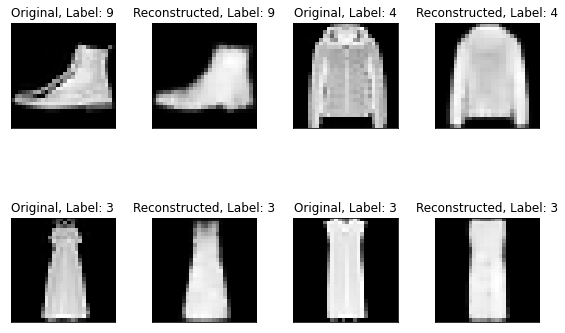

In [77]:
### Plot the performance of the best model over test dataset
fig, axs = plt.subplots(2, 4, figsize=(8,6))

for ax in axs:
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[1].set_title('Reconstructed, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[2].imshow(np.array(img1), cmap='gist_gray')
    ax[2].set_title('Original, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])

    ax[3].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[3].set_title('Reconstructed, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    
plt.tight_layout()

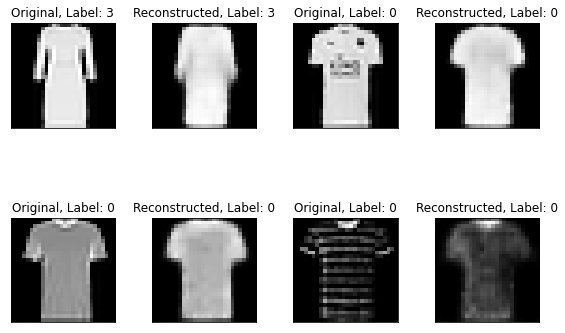

In [78]:
### Plot the performance of the best model over test dataset
fig, axs = plt.subplots(2, 4, figsize=(8,6))

for ax in axs:
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[0].imshow(np.array(img1), cmap='gist_gray')
    ax[0].set_title('Original, Label: %d' % label)
    ax[0].set_xticks([])
    ax[0].set_yticks([])

    ax[1].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[1].set_title('Reconstructed, Label: %d' % label)
    ax[1].set_xticks([])
    ax[1].set_yticks([])
    
    img, label = random.choice(test_dataset)
    img1 = img[0]
    with torch.no_grad():
        encoded_img  = AE_net.encoder(img.unsqueeze(0).to(device))
        decoded_img  = AE_net.decoder(encoded_img)
    
    ax[2].imshow(np.array(img1), cmap='gist_gray')
    ax[2].set_title('Original, Label: %d' % label)
    ax[2].set_xticks([])
    ax[2].set_yticks([])

    ax[3].imshow(decoded_img.squeeze().cpu().numpy(), cmap='gist_gray')
    ax[3].set_title('Reconstructed, Label: %d' % label)
    ax[3].set_xticks([])
    ax[3].set_yticks([])
    
    
plt.tight_layout()